In [1]:
%env XLA_PYTHON_CLIENT_MEM_FRACTION=.40

import jax
import numpy as np
import pandas as pd
import jax.numpy as jnp
import matplotlib.pyplot as plt
import seaborn as sns
import colorcet as cc

from tqdm.auto import tqdm
from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from aging.plotting import (
    figure,
    format_plots,
    add_identity,
    legend,
    save_factory,
    COLORMAPS,
    PLOT_CONFIG,
)
from copy import deepcopy
from operator import or_
from toolz import reduce, valmap, pluck
from aging.behavior.bio_age_model import (
    fit_model,
    masked_xval,
    raise_dim
)
from aging.organization.dataframes import load_male_long_df, load_female_long_df, DF_PATHS
from scipy.spatial.distance import pdist, squareform
from scipy.stats import ks_2samp
from itertools import product, combinations
from sklearn.metrics import median_absolute_error

env: XLA_PYTHON_CLIENT_MEM_FRACTION=.40


In [2]:
def make_sex_age_plot(age_df, width, height):
    age_df = age_df.copy()
    boundaries = np.arange(age_df["labels"].max() + 2) - 0.5
    pal = sns.blend_palette([COLORMAPS.ont_male(255), COLORMAPS.ont_female(255)], as_cmap=True)
    fig = figure(width, height)
    ax = fig.gca()
    perm = np.random.permutation(len(age_df))
    im = ax.scatter(
        age_df["true_ages"].iloc[perm],
        age_df["bio_ages"].iloc[perm],
        c=age_df["labels"].iloc[perm],
        cmap=pal,
        vmin=0,
        vmax=1,
        s=2.5,
        lw=0,
    )
    cb = fig.colorbar(
        mappable=im,
        boundaries=boundaries,
        ax=ax,
        label="Sex",
    )
    cb.set_ticks(range(0, 2))
    cb.set_ticklabels(["Male", "Female"])
    add_identity(ax, c="k", ls="--", zorder=-2)
    ax.set(
        xlabel="Chronological age (wks)",
        ylabel="Behavioral age (wks)",
        aspect="equal",
        xlim=(0, 60),
    )
    sns.despine()
    return fig

In [3]:
format_plots()
saver = save_factory(PLOT_CONFIG.save_path / "fig4-longv2-bambi-lab-comments", tight_layout=False)

In [4]:
def zscore(ser: pd.Series):
    return (ser - ser.mean()) / ser.std()


def demean(ser: pd.Series):
    return ser - ser.mean()


def quantile(n):
    def percentile_(x):
        return x.quantile(n)
    percentile_.__name__ = 'q_{:0.02f}'.format(n)
    return percentile_

In [5]:
m_df = load_male_long_df(average_weeks=True, merge_size=True, merge_ages=False)
m_size_col = m_df['quant_0.5']
m_df = m_df.drop(columns=['quant_0.5'])

f_df = load_female_long_df(average_weeks=True, merge_size=True, filter_female=False, merge_ages=False)
f_size_col = f_df['quant_0.5']
f_df = f_df.drop(columns=['quant_0.5'])

df = pd.concat([m_df, f_df])
size_col = pd.concat([m_size_col, f_size_col])
sort_idx = np.argsort(df.to_numpy().sum(0))[::-1]

label_encoder = OneHotEncoder(sparse_output=False, dtype=np.float32)
sex_id = label_encoder.fit_transform(np.hstack([np.zeros(len(df) - len(f_df)), np.ones(len(f_df))])[:, None]).T

mouse_ids = label_encoder.fit_transform(df.index.get_level_values("mouse").to_numpy()[:, None]).T
mouse_cat = label_encoder.categories_[0]

syllable_counts_jax = jnp.array(df.astype('float32'))
age = jnp.array(df.index.get_level_values('age'))
assert size_col.isna().sum() == 0, "issue with NaNs in size data"

In [6]:
df['sex'] = np.argmax(sex_id, axis=0)
df = df.set_index('sex', append=True)

In [7]:
animals_per_sex = df.reset_index().groupby('sex')['mouse'].nunique().tolist()

In [8]:
features = {
    "ages": age,  # models >= 1
    "counts": syllable_counts_jax + 1,  # models >= 1
    "sizes": size_col.to_numpy(),  # models > 1
    "sex": sex_id,
    "mice": mouse_ids,
}

age_sd = 0.161

hypparams = {
    "log_age": True,
    "min_age": 2,
    "max_age": 125,
    "age_sd": age_sd,
    "n_age_samples": 1000,
    "n_splines": 4,
    "n_syllables": syllable_counts_jax.shape[1],
    "n_development_splines": 4,
    "n_sex_splines": 4,
    "scale": 150,
    "normalize_by_softmax": True,
    "n_keep_sylls": 25,
    "n_sessions": len(syllable_counts_jax),
    "n_animals": len(mouse_ids),
    "n_animals_per_sex": animals_per_sex,
    "n_sexes": len(sex_id),
    "lr": 0.25,
    "n_opt_iter": 775,
    "log_scale_sd": True,
}

In [9]:
mdl = fit_model(features, hypparams, 6)

In [10]:
mask = mdl['true_ages'] > 30
median_absolute_error(mdl['true_ages'][mask], mdl['bio_ages'][mask])

3.7913246

findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic family 'sans-serif' not found because none of the following families were found: Helvetica
findfont: Generic f

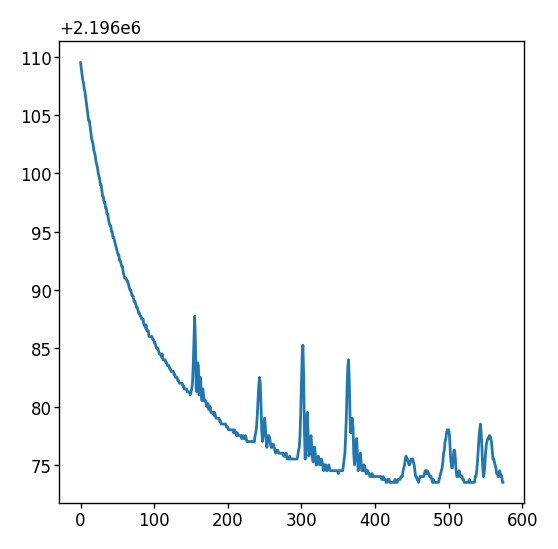

In [11]:
plt.plot(mdl['loss'][200:])

In [12]:
# df_copy = df.copy().astype('float32')

# # normalize to sum to 1
# df_copy['beh_age'] = mdl['bio_ages']
# df_copy = df_copy.sort_index(level=['sex', 'age', 'mouse'])

# for s, _df in df_copy.groupby('sex'):
#     _age = _df.index.get_level_values('age').sort_values()
#     _df = _df.sort_values(by='beh_age')
#     df_copy.loc[_df.index, 'beh_age_map'] = _age.to_numpy()

# df_copy = df_copy.set_index(['beh_age', 'beh_age_map'], append=True)

# df_copy.to_parquet(
#     "/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df/2024-06-11-male-female-long-v2-counts-df-beh-age.parquet"
# )

In [13]:
def make_dana_df(mdl):
    from scipy.spatial.distance import cdist

    _m_df = load_male_long_df(average_weeks=True, merge_size=True, merge_ages=True, df_path=DF_PATHS.usage_male).assign(sex=0)
    _m_df = _m_df.drop(columns=['quant_0.5'])
    _f_df = load_female_long_df(average_weeks=True, merge_size=True, merge_ages=True, df_path=DF_PATHS.usage_female).assign(sex=1)
    _f_df = _f_df.drop(columns=['quant_0.5'])

    df_copy = pd.concat([_m_df, _f_df])
    df_copy['beh_age'] = mdl['bio_ages']

    for s, _df in df_copy.groupby('sex'):
        _df = _df.copy()
        unique_ages = _df.index.get_level_values('age').unique().sort_values().values
        d = cdist(unique_ages[:, None], _df[['beh_age']])
        age_indices = np.argmin(d, axis=0)
        new_age_mapped = unique_ages[age_indices]
        _df = _df.droplevel(level='age').drop(columns=['beh_age', 'sex'])
        _df['age'] = new_age_mapped
        _df = _df.set_index('age', append=True)

        _levels = _df.index.names
        _levels = [_levels[-1]] + list(_levels[:-1])
        _df = _df.reorder_levels(_levels)

        if s == 0:
            # males
            _df.to_parquet('/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df/2024-07-30-longtogeny_v2_males_raw_usage_df_beh_age.parquet')
        else:
            # females
            _df.to_parquet('/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df/2024-07-30-longtogeny_v2_females_raw_usage_df_beh_age.parquet')


make_dana_df(mdl)

In [14]:
# to send to dana - BAD VERSION
# df_copy_age_remap = df_copy.copy()
# df_copy_age_remap.index = df_copy.droplevel('age').index.rename({'beh_age_map': 'age'})
# df_copy_age_remap = df_copy_age_remap / df_copy_age_remap.sum(1).to_numpy()[:, None]

# df_copy_age_remap.query("sex == 0").to_parquet(
#     "/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df/long_v2_males_raw_usage_df_beh_age.parquet"
# )
# df_copy_age_remap.query("sex == 1").to_parquet(
#     "/n/groups/datta/win/longtogeny/data/ontogeny/version_11-1/beh_age_df/long_v2_females_raw_usage_df_beh_age.parquet"
# )

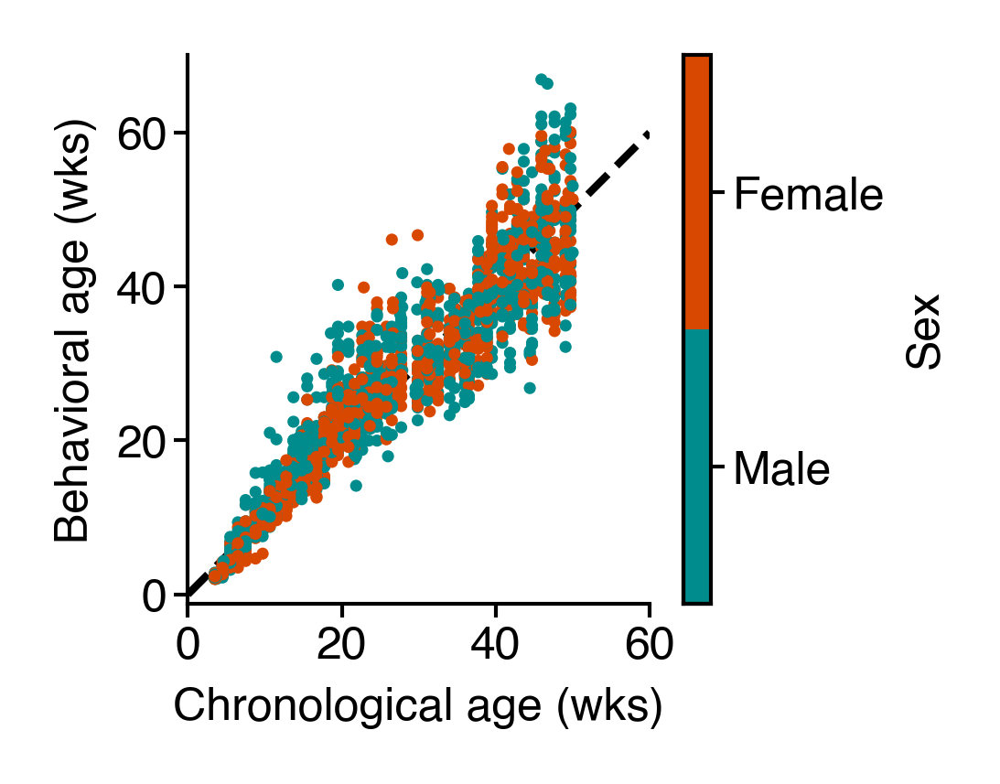

In [15]:
age_df = pd.DataFrame(
    dict(bio_ages=mdl["bio_ages"], true_ages=mdl["true_ages"], labels=np.argmax(features['sex'], axis=0)),
)

fig = make_sex_age_plot(age_df, 1.6, 1.3)
saver(fig, "long-v2-sex-chron-vs-beh-age-all-timepoints");

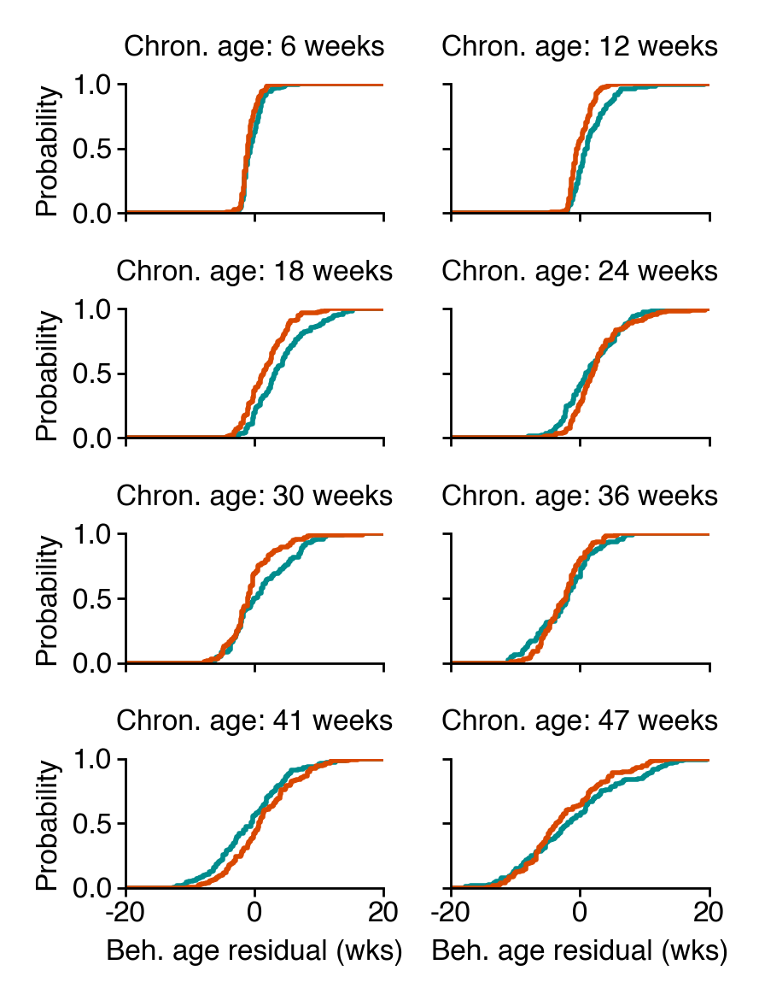

In [16]:
lims = 20
age_df['bin'] = pd.cut(age_df['true_ages'], 8, labels=False)
fig, ax = plt.subplots(4, 2, figsize=(2.2, 2.9), sharey=True, sharex=True)
for a, (_bin, _df) in zip(ax.flat, age_df.groupby("bin")):
    mean_age = _df["true_ages"].mean()
    _male_df = _df.query("labels == 0")
    _female_df = _df.query("labels == 1")
    sns.histplot(
        data=_male_df["bio_ages"] - _male_df['true_ages'],
        ax=a,
        color=COLORMAPS.ont_male(255),
        bins=np.linspace(-lims, lims, 200),
        fill=False,
        cumulative=True,
        element="step",
        stat='probability',
    )
    sns.histplot(
        data=_female_df["bio_ages"] - _female_df['true_ages'],
        ax=a,
        color=COLORMAPS.ont_female(255),
        bins=np.linspace(-lims, lims, 200),
        fill=False,
        cumulative=True,
        element="step",
        stat='probability',
    )
    a.set(title=f"Chron. age: {mean_age:0.0f} weeks", ylim=(0, 1))
for a in ax[-1]:
    a.set(xlabel="Beh. age residual (wks)", xlim=(-lims, lims))
sns.despine()
fig.tight_layout()
saver(fig, "male-female-difference-to-avg-chron-age");

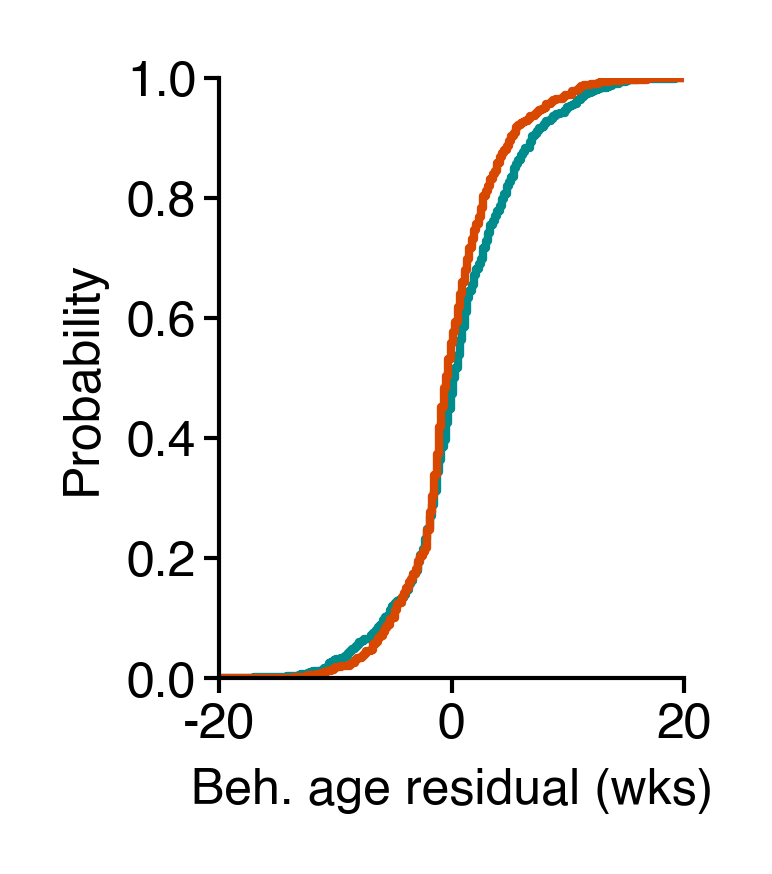

In [17]:
lims = 20
fig = figure(1, 1.3)
_male_df = age_df.query("labels == 0")
_female_df = age_df.query("labels == 1")
sns.histplot(
    data=_male_df["bio_ages"] - _male_df['true_ages'],
    color=COLORMAPS.ont_male(255),
    bins=np.linspace(-lims, lims, 200),
    fill=False,
    cumulative=True,
    element="step",
    stat='probability',
)
a = sns.histplot(
    data=_female_df["bio_ages"] - _female_df['true_ages'],
    color=COLORMAPS.ont_female(255),
    bins=np.linspace(-lims, lims, 200),
    fill=False,
    cumulative=True,
    element="step",
    stat='probability',
)
a.set(xlabel="Beh. age residual (wks)", xlim=(-lims, lims), ylim=(0, 1))
sns.despine()
saver(fig, "male-female-difference-to-avg-chron-age-all");

In [18]:
ks_result = ks_2samp(_male_df['bio_ages'] - _male_df['true_ages'], _female_df['bio_ages'] - _female_df['true_ages'])
ks_result

KstestResult(statistic=0.09590450310559007, pvalue=0.00042884224968666796, statistic_location=2.783615, statistic_sign=-1)

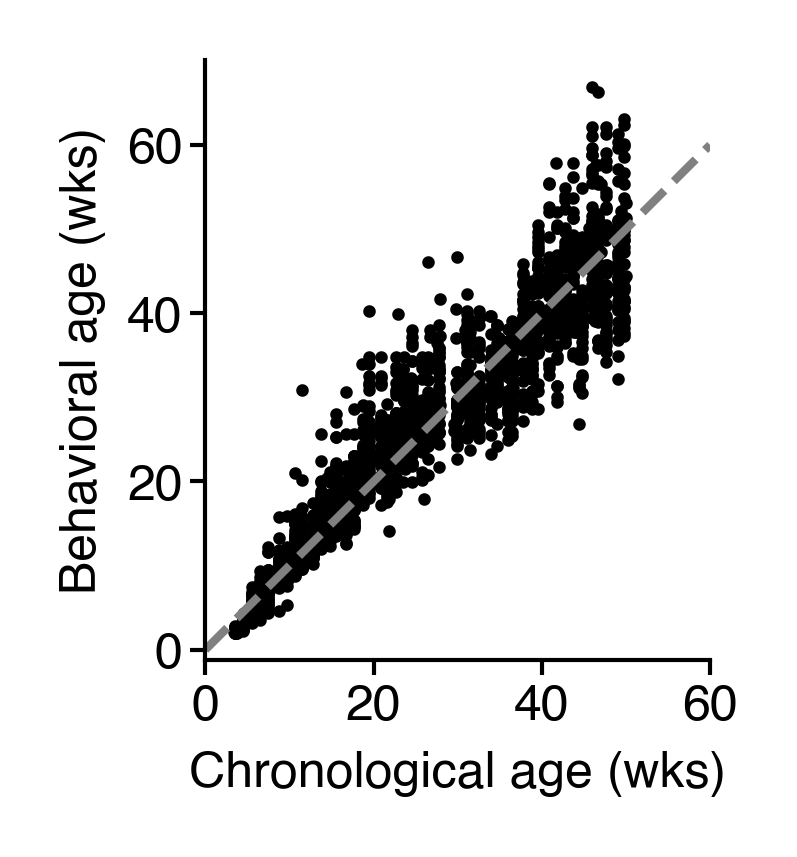

In [19]:
fig = figure(1.3, 1.3)
ax = fig.gca()
ax.scatter(mdl["true_ages"], mdl["bio_ages"], color="k", s=0.5)
ax.set(
    xlabel="Chronological age (wks)",
    ylabel="Behavioral age (wks)",
    aspect="equal",
    xlim=(0, 60),
)
add_identity(ax, color="gray", ls="--", zorder=1)
sns.despine()
saver(fig, "long-v2-bio-ages");

In [20]:
df_copy = df.copy().astype('float32')

# normalize to sum to 1
df_copy = df_copy / (df_copy.sum(1).to_numpy()[:, None])
df_copy['beh_age'] = mdl['bio_ages']
# df_copy['sex'] = np.argmax(sex_id, axis=0)
df_copy = df_copy.set_index('beh_age', append=True)

df_copy['age_bin'] = pd.cut(df_copy.index.get_level_values('age'), 30, labels=False)
df_copy['beh_age_bin'] = pd.cut(df_copy.index.get_level_values('beh_age'), 30, labels=False)
df_copy = df_copy.set_index(['beh_age_bin', 'age_bin'], append=True)

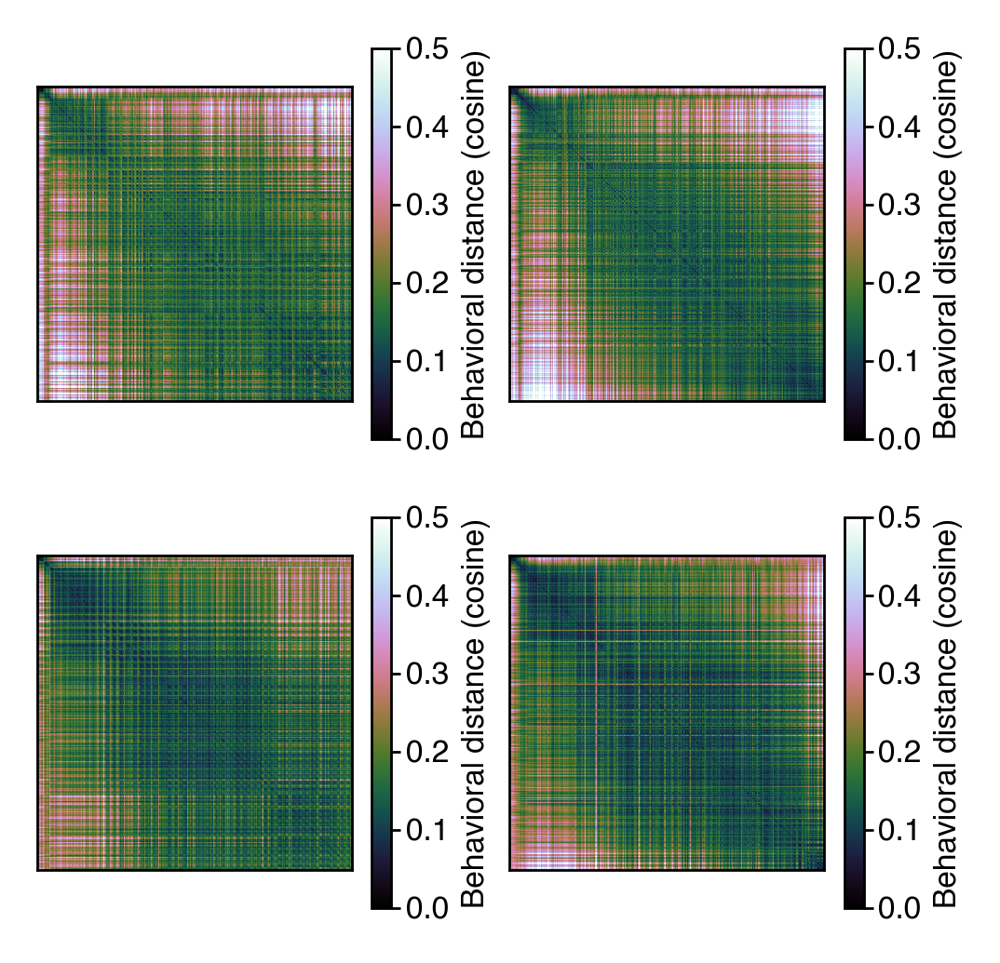

In [21]:
fig, ax = plt.subplots(2, 2, figsize=(3, 3))

sex_vmap = {
    0: 0.5,
    1: 0.5,
}

for (_sex, _sorting), a in zip(product([0, 1], ["age", "beh_age"]), ax.flat):
    d = pdist(df_copy.query('sex == @_sex').sort_index(level=_sorting), metric="cosine")
    d = squareform(d)

    im = a.imshow(d, cmap="cubehelix", vmax=sex_vmap[_sex], vmin=0)
    fig.colorbar(im, ax=a, label="Behavioral distance (cosine)")
    a.set(xticks=[], yticks=[])
saver(fig, 'long-v2-male-female-distance-matrix-pre-post-bambi-sorting-cosine');

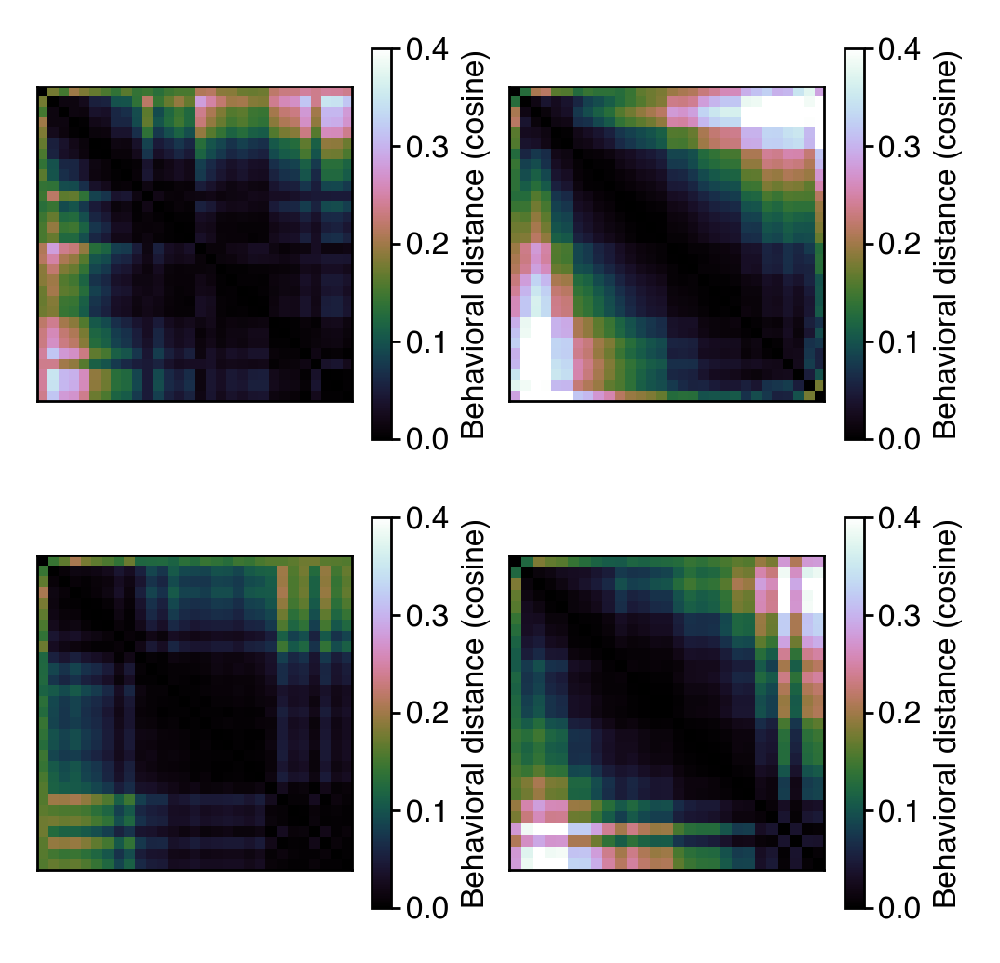

In [22]:
fig, ax = plt.subplots(2, 2, figsize=(3, 3))

sex_vmap = {
    0: 0.4,
    1: 0.4,
}

for (_sex, _sorting), a in zip(product([0, 1], ["age_bin", "beh_age_bin"]), ax.flat):
    d = pdist(df_copy.query('sex == @_sex').groupby(_sorting).mean(), metric="cosine")
    d = squareform(d)

    im = a.imshow(d, cmap="cubehelix", vmax=sex_vmap[_sex], vmin=0)
    fig.colorbar(im, ax=a, label="Behavioral distance (cosine)")
    a.set(xticks=[], yticks=[])
saver(fig, 'long-v2-male-female-averaged-distance-matrix-pre-post-bambi-sorting-cosine');

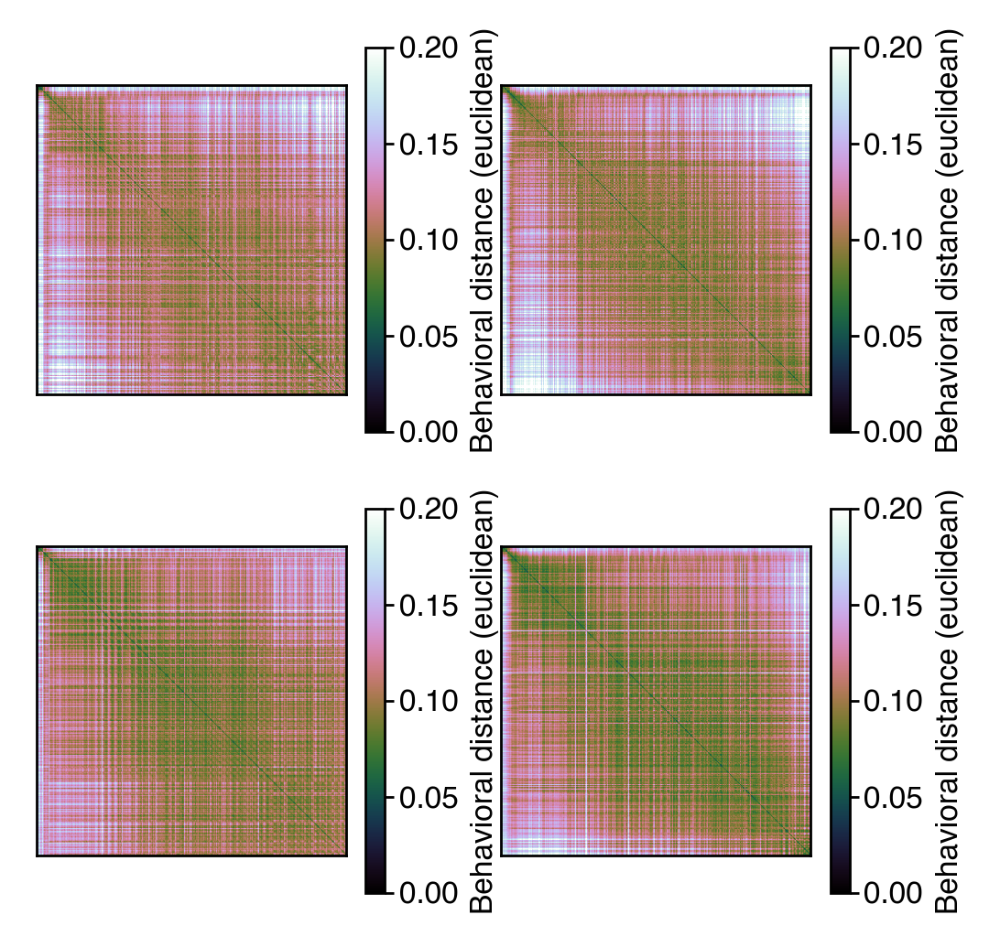

In [23]:
fig, ax = plt.subplots(2, 2, figsize=(3, 3))

sex_vmap = {
    0: 0.2,
    1: 0.2,
}

for (_sex, _sorting), a in zip(product([0, 1], ["age", "beh_age"]), ax.flat):
    d = pdist(df_copy.query('sex == @_sex').sort_index(level=_sorting), metric="euclidean")
    d = squareform(d)

    im = a.imshow(d, cmap="cubehelix", vmax=sex_vmap[_sex], vmin=0)
    fig.colorbar(im, ax=a, label="Behavioral distance (euclidean)")
    a.set(xticks=[], yticks=[])
# saver(fig, 'long-v2-male-female-distance-matrix-pre-post-bambi-sorting-euclidean');

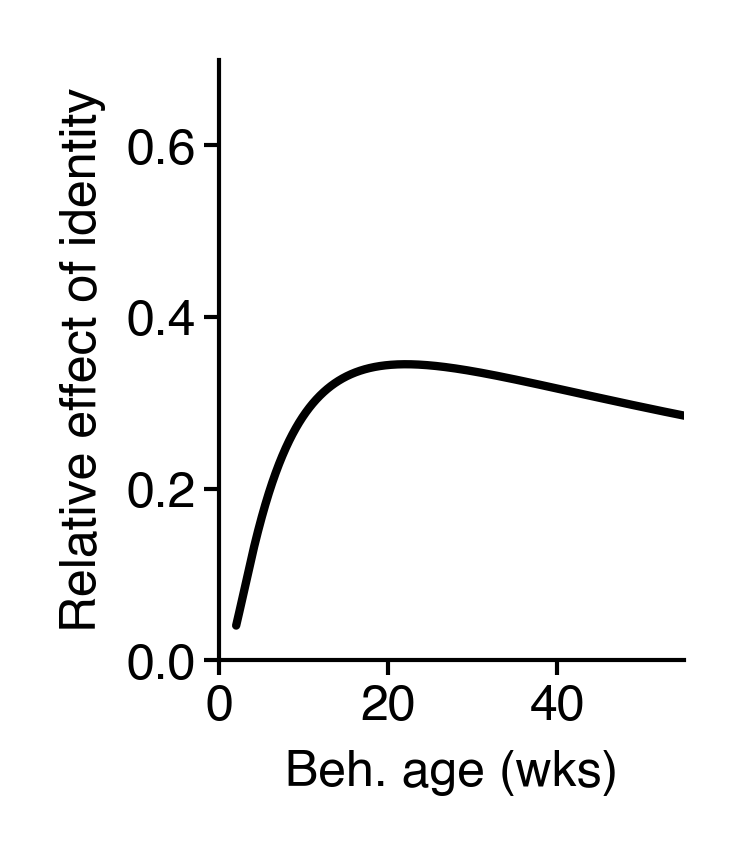

In [24]:
x = mdl['params']['development_weights']
dev = (x @ mdl['init_components'].bases['development']).squeeze()

comps = mdl['init_components']

# dev = np.exp(dev - dev.max())
dev = np.exp(dev)

fig = figure(1, 1.3)
ax = fig.gca()
ax.plot(comps.age_unnormalizer(comps.age_samples), dev, color='k')
plt.xlim(0, 55)
plt.ylim(0, 0.7)
plt.xlabel("Beh. age (wks)")
plt.ylabel("Relative effect of identity")
sns.despine()
saver(fig, "long-v2-effect-of-id");

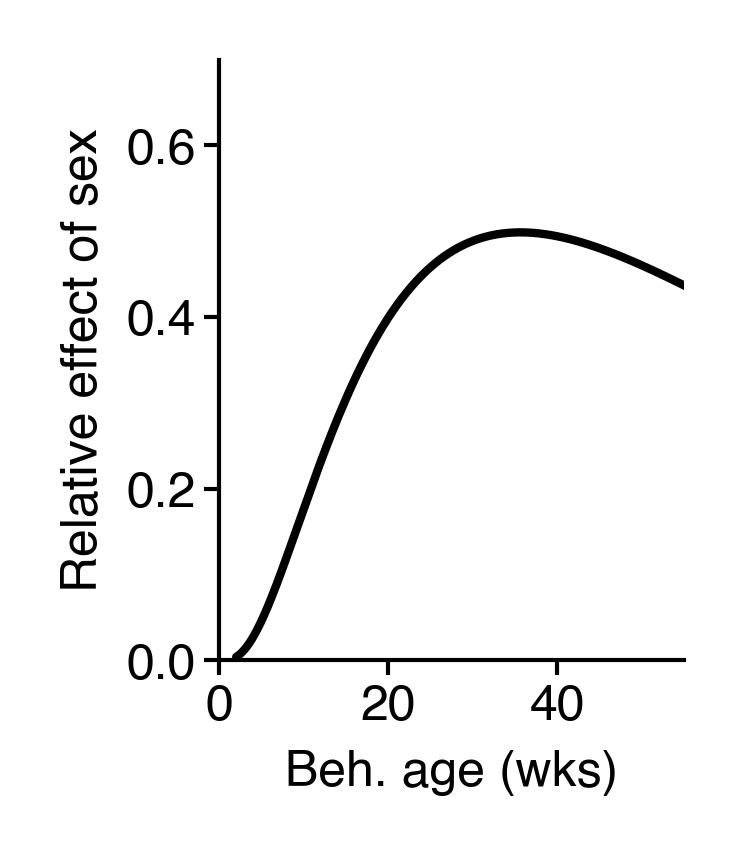

In [25]:
x = mdl['params']['sex_weights']
dev = (x @ mdl['init_components'].bases['sex']).squeeze()

comps = mdl['init_components']

# dev = np.exp(dev - dev.max())
dev = np.exp(dev)

fig = figure(1, 1.3)
ax = fig.gca()
ax.plot(comps.age_unnormalizer(comps.age_samples), dev, color='k')
plt.xlim(0, 55)
plt.ylim(0, 0.7)
plt.xlabel("Beh. age (wks)")
plt.ylabel("Relative effect of sex")
sns.despine()
saver(fig, "long-v2-effect-of-sex");

In [26]:
age_df = pd.DataFrame(
    dict(bio_ages=mdl["bio_ages"], true_ages=mdl["true_ages"], labels=np.argmax(features['mice'], axis=0),
         sex=np.argmax(features['sex'], axis=0)),
    index=df.index
).sort_values(by=['labels', 'true_ages'])
age_df['diff'] = age_df['bio_ages'] - age_df['true_ages']

age_df["smoothed_diff"] = age_df.sort_values(by='true_ages').groupby("mouse")["diff"].transform(
    lambda x: x.rolling(9, center=True, win_type="exponential", min_periods=1).mean(
        tau=2.25
    )
)

In [27]:
def make_id_plot(age_df, width, height, hue_order=None, include_lines=False, ax_kwargs={}):
    age_df = age_df.copy()
    # age_df['floored_age'] = ((age_df['true_ages'] * 7) // 14) * 2

    min_label = age_df['labels'].min()
    age_df['labels'] = age_df['labels'] - min_label
    boundaries = np.arange(age_df["labels"].max() + 2) - 0.5
    fig = figure(width, height)
    ax = fig.gca()
    if hue_order is None:
        pal = cc.glasbey[min_label: age_df["labels"].max() + 1 + min_label]
    else:
        pal = [cc.glasbey[hue+min_label] for hue in hue_order]
    if include_lines:
        ax = sns.lineplot(
            data=age_df,
            x="true_ages",
            y="bio_ages",
            hue="labels",
            palette=pal,
            hue_order=hue_order,
            legend=False,
            zorder=-1,
            lw=0.25, err_kws=dict(lw=0), ax=ax
        )
    if hue_order is not None:
        age_df = age_df[age_df['labels'].isin(hue_order)]
    im = ax.scatter(
        age_df["true_ages"],
        age_df["bio_ages"],
        c=age_df["labels"],
        cmap=cc.cm.glasbey,
        vmin=0 - min_label,
        vmax=256 - min_label,
        s=4,
        lw=0,
    )
    cb = fig.colorbar(
        mappable=im,
        boundaries=boundaries,
        ax=ax,
        label="Mouse ID",
    )
    cb.set_ticks(range(0, age_df['labels'].nunique() + 1, 3))
    add_identity(ax, c="k", ls="--", zorder=-2)
    ax.set(
        xlabel="Chronological age (wks)",
        ylabel="Behavioral age (wks)",
        aspect="equal",
        ylim=(0, 80),
        **ax_kwargs
    )
    sns.despine()
    return fig

In [28]:
male = age_df.query('sex==0').copy()
female = age_df.query('sex==1').copy()

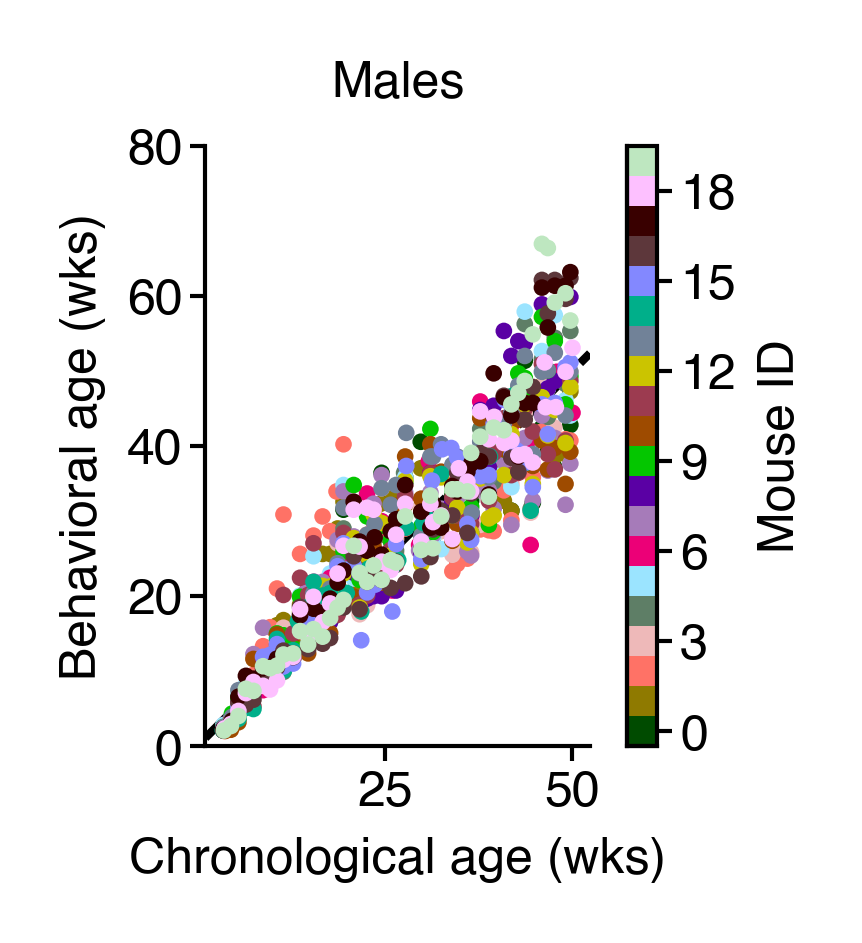

In [29]:
fig = make_id_plot(male, 1.6, 1.3, ax_kwargs=dict(title="Males"))
saver(fig, "long-v2-id-males-chron-vs-beh-age-all-timepoints");

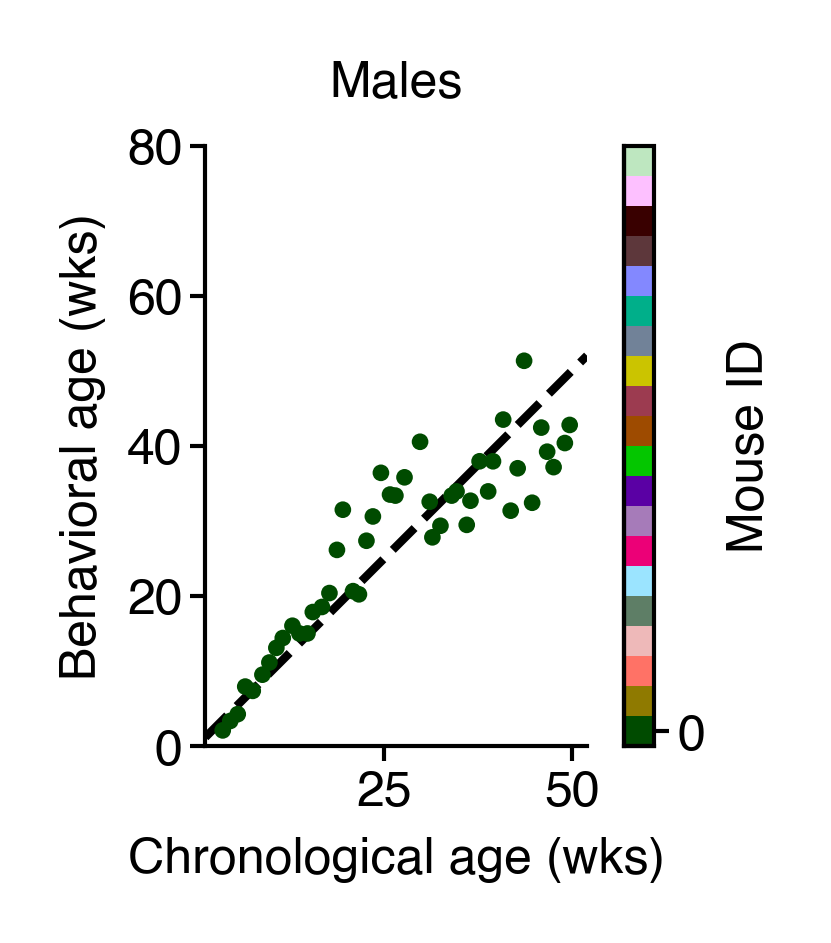

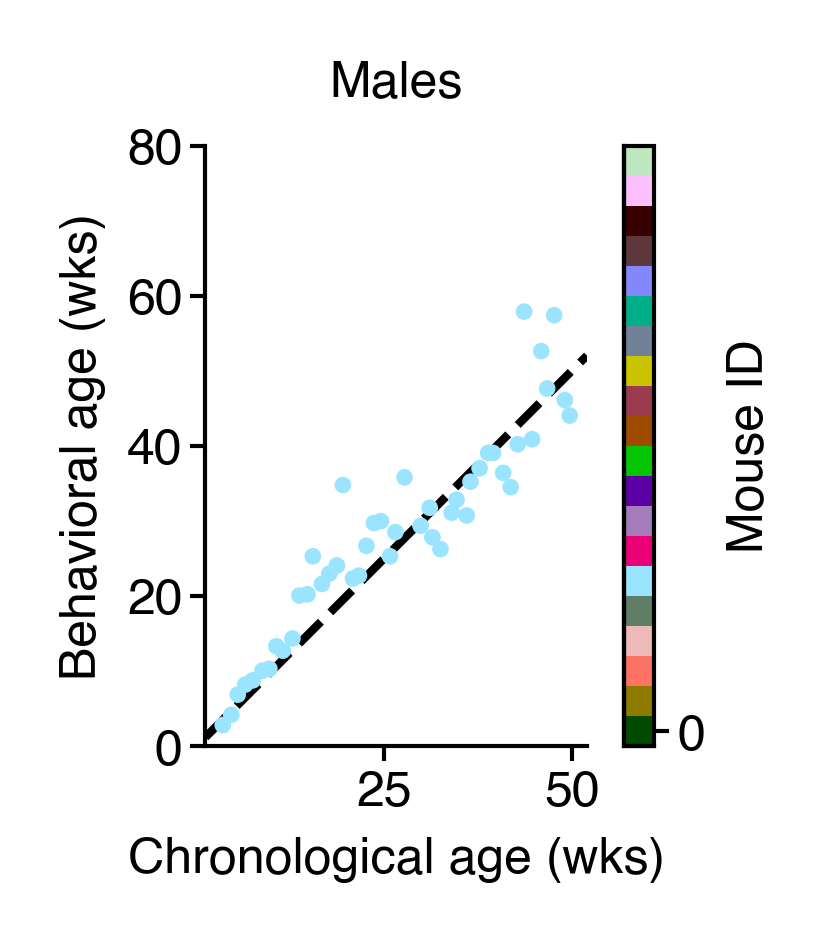

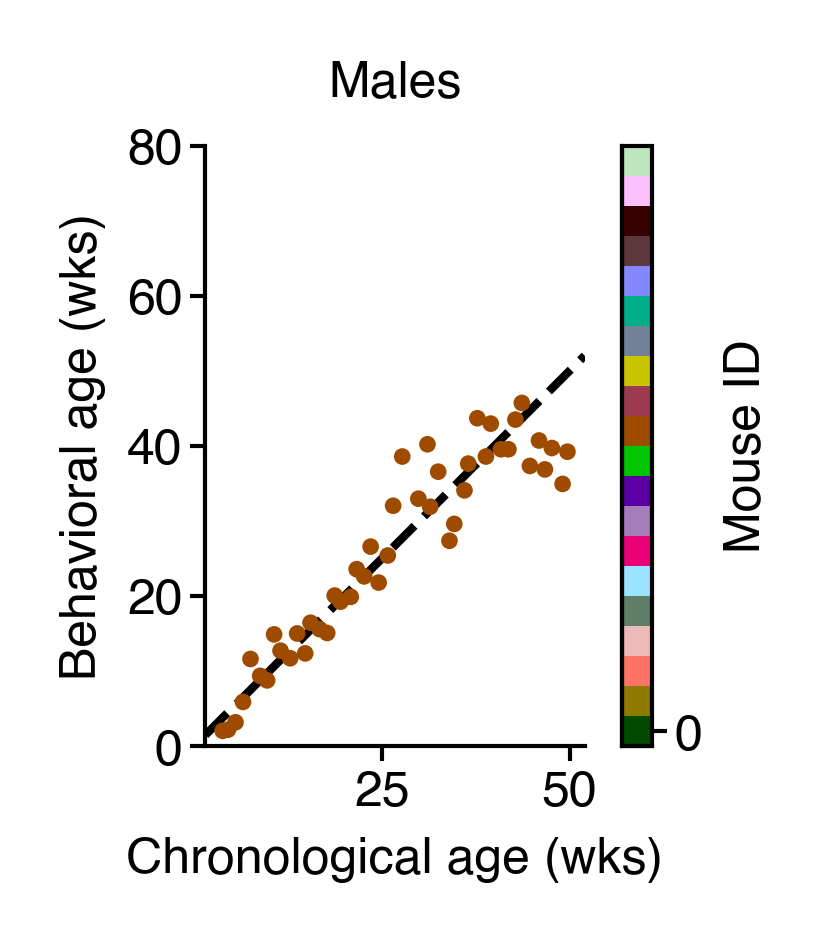

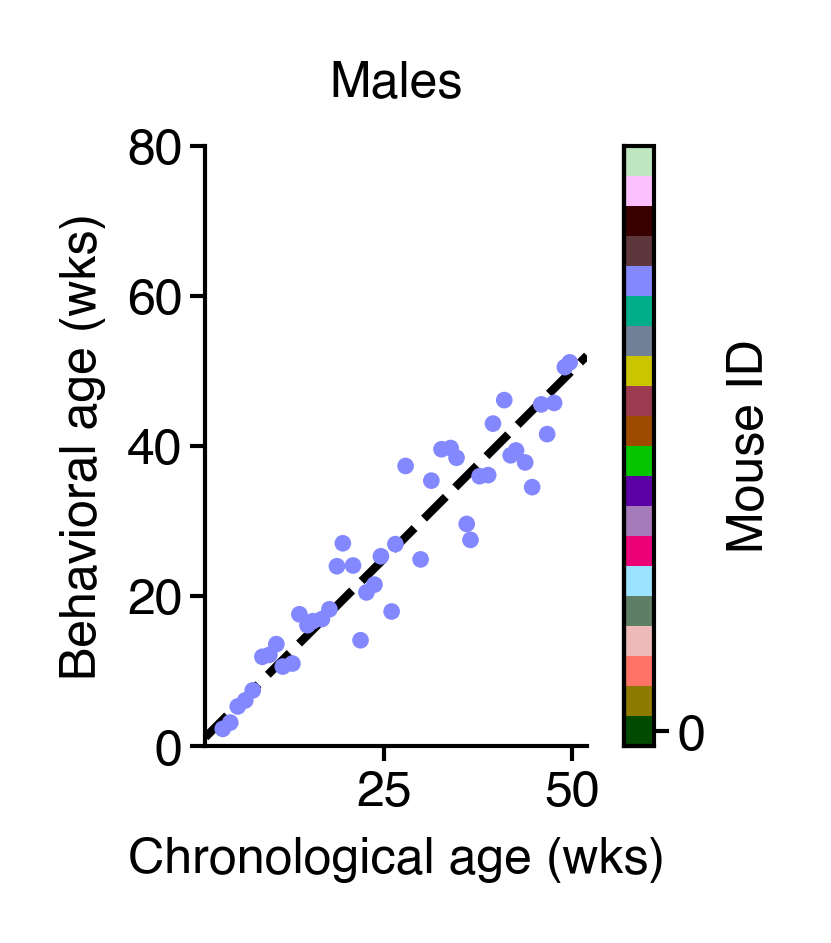

In [30]:
for i in range(0, 20, 5):
    fig = make_id_plot(male, 1.6, 1.3, ax_kwargs=dict(title="Males"), hue_order=[i])
    saver(fig, f"long-v2-id-male-{i}-chron-vs-beh-age-all-timepoints");

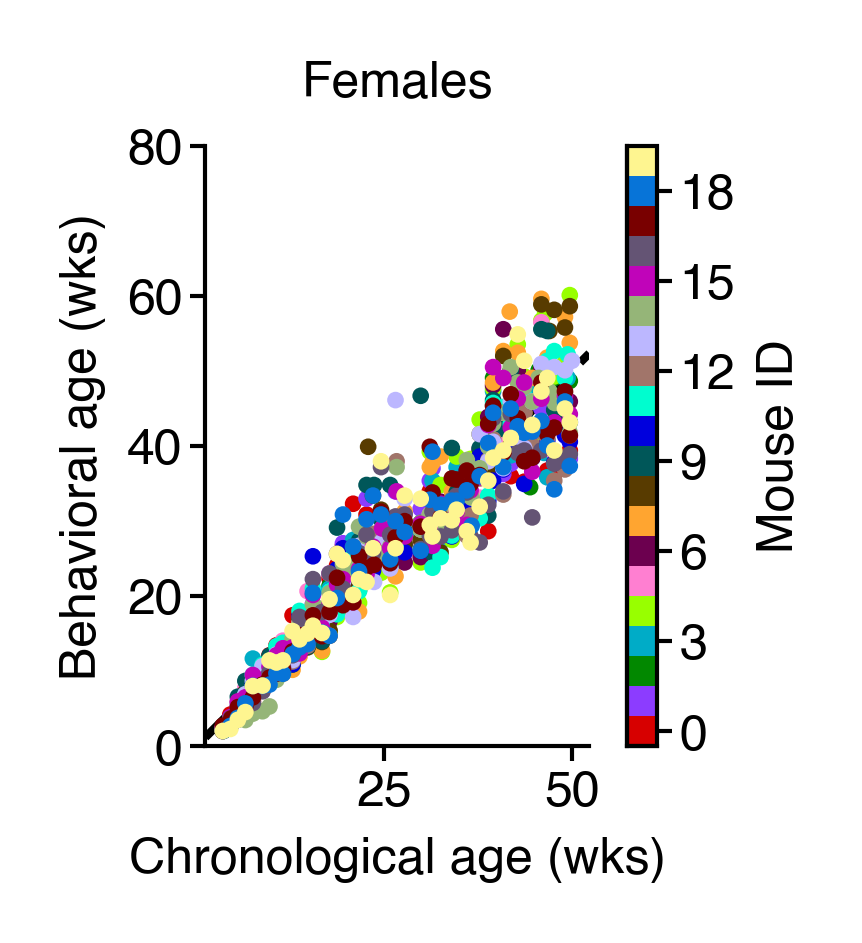

In [31]:
fig = make_id_plot(female, 1.6, 1.3, ax_kwargs=dict(title="Females"))
saver(fig, "long-v2-id-females-chron-vs-beh-age-all-timepoints");

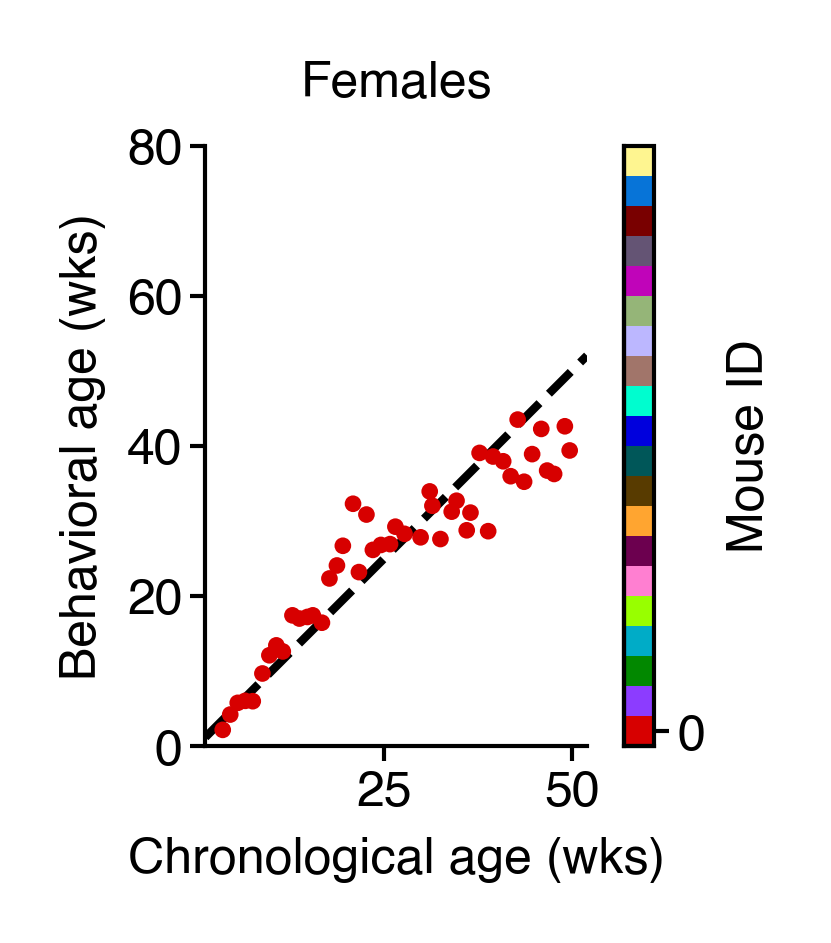

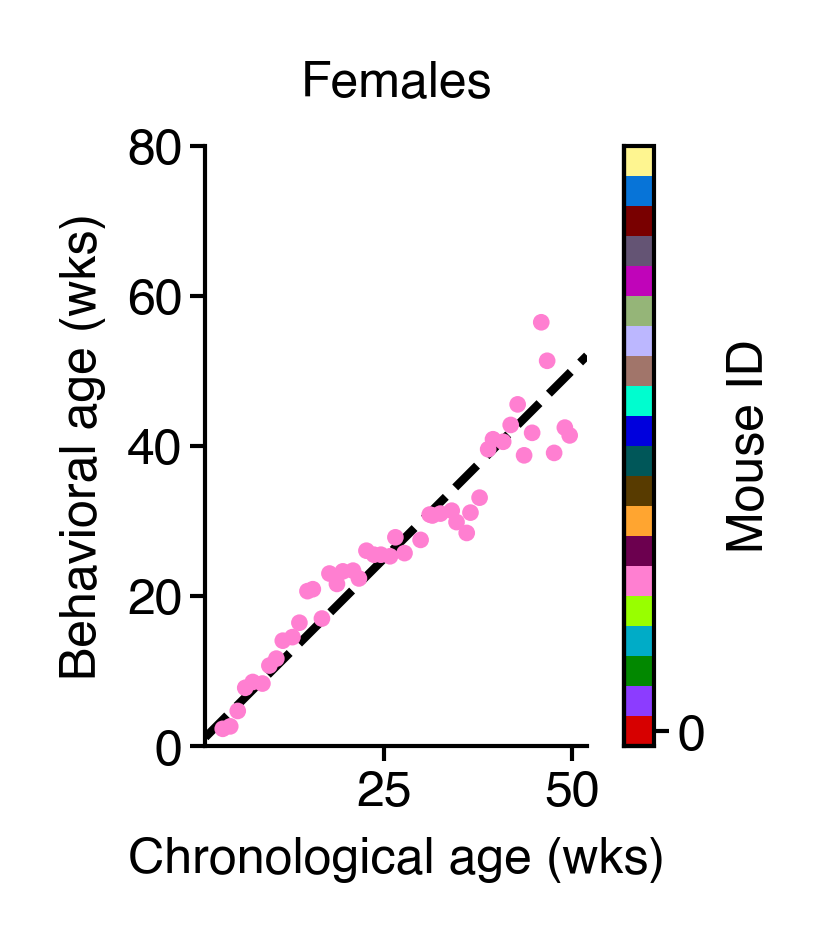

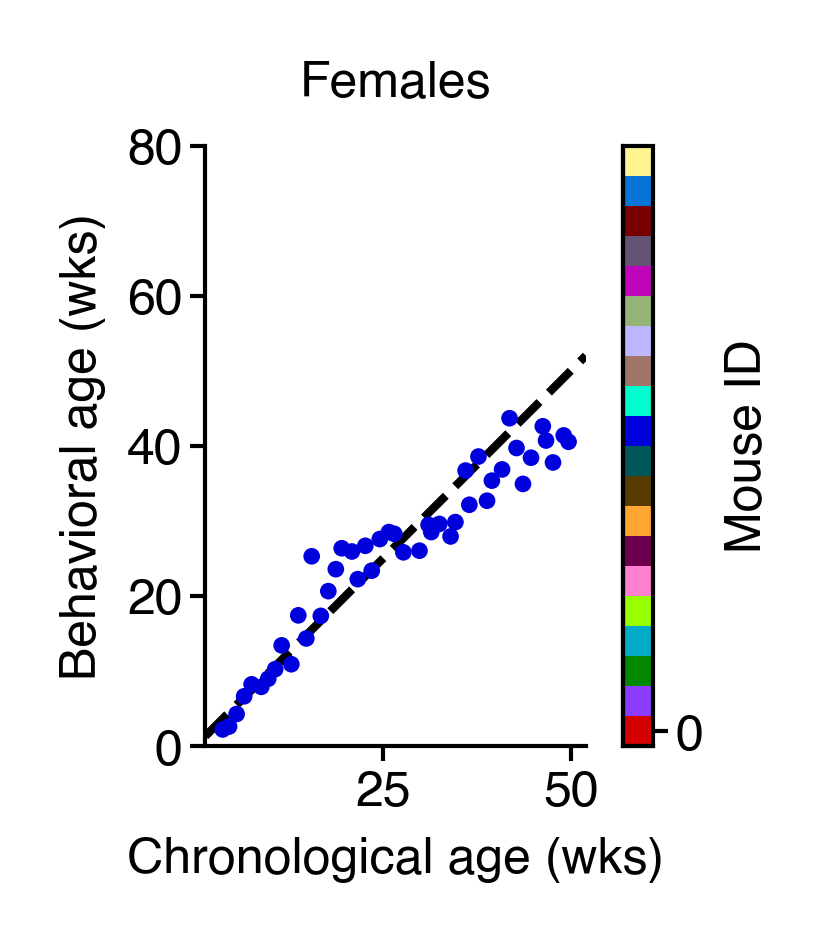

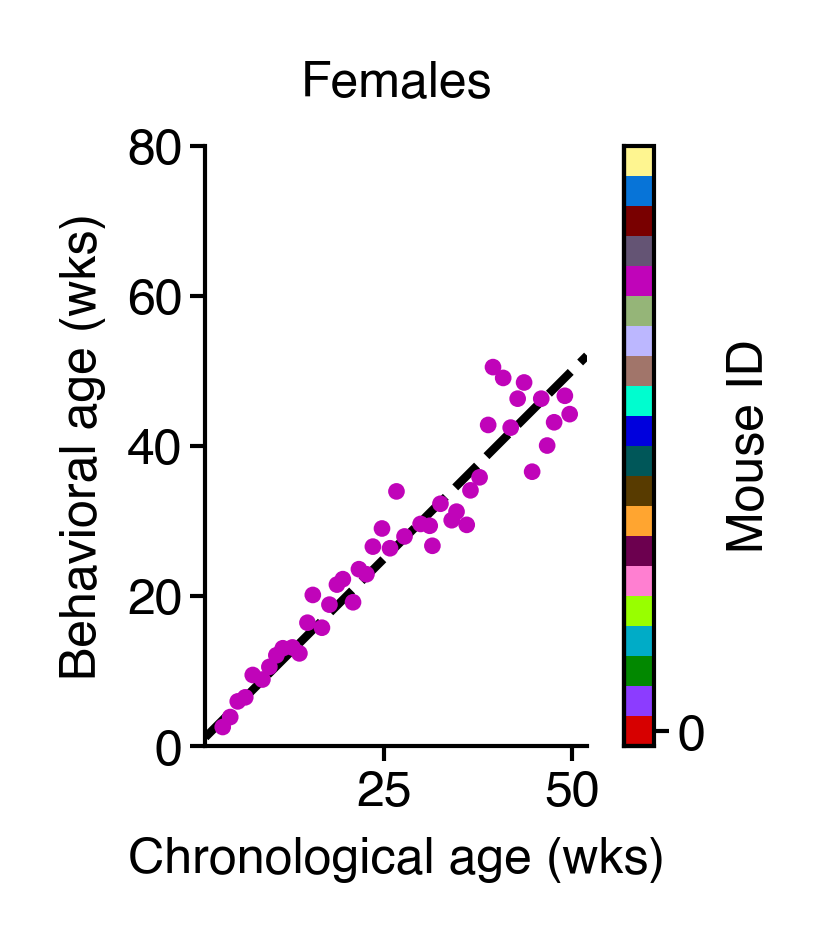

In [32]:
for i in range(0, 20, 5):
    fig = make_id_plot(female, 1.6, 1.3, ax_kwargs=dict(title="Females"), hue_order=[i])
    saver(fig, f"long-v2-id-female-{i}-chron-vs-beh-age-all-timepoints");

In [33]:
male["smoothed_bio_age"] = male.sort_values(by='true_ages').groupby("mouse")["bio_ages"].transform(
    lambda x: x.rolling(7, center=True, win_type="exponential", min_periods=1).mean(
        tau=1.3
    )
)
female["smoothed_bio_age"] = female.sort_values(by='true_ages').groupby("mouse")["bio_ages"].transform(
    lambda x: x.rolling(7, center=True, win_type="exponential", min_periods=1).mean(
        tau=1.3
    )
)

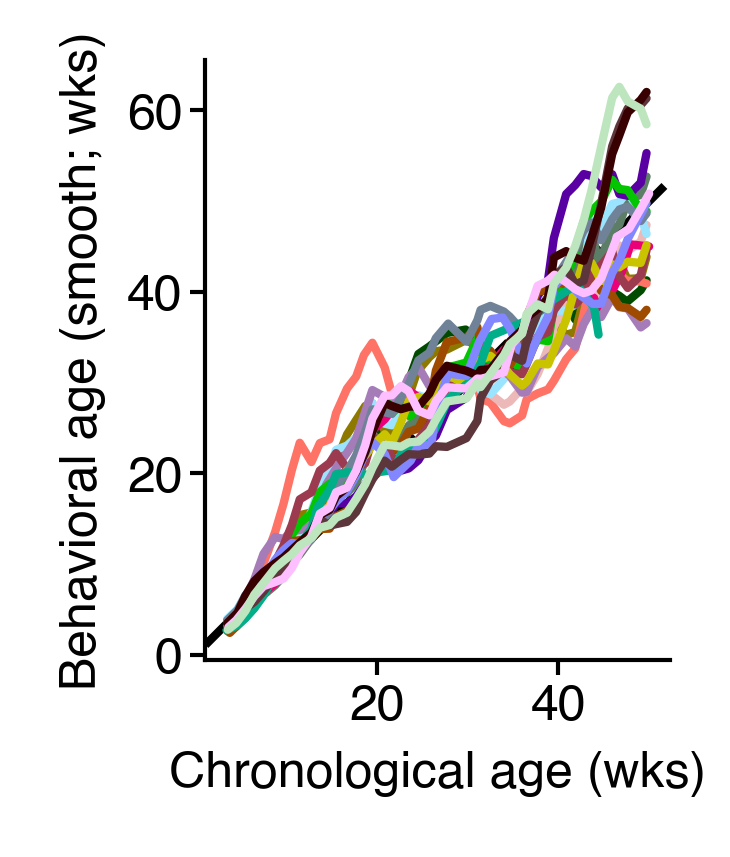

In [34]:
fig = figure(1.5, 1.3)
ax = sns.lineplot(
    data=male,
    x="true_ages",
    y="smoothed_bio_age",
    hue="labels",
    palette=cc.glasbey[20:40],
    legend=False,
    # hue_order=[idx[0], idx[1], idx[-2], idx[-1]]
)
ax.set(
    aspect="equal",
    xlabel="Chronological age (wks)",
    ylabel="Behavioral age (smooth; wks)",
)
add_identity(ax, c="k", ls="--", zorder=-1)
sns.despine()
saver(fig, "smoothed-male-bio-age-for-individuals");

In [35]:
x = male.reset_index(level='age')
x['diff'] = x['bio_ages'] - x['age']
x["smoothed_diff"] = x.sort_values(by='true_ages').groupby("mouse")["diff"].transform(
    lambda x: x.rolling(9, center=True, win_type="exponential", min_periods=1).mean(
        tau=2.25
    )
)
x['diff_smooth'] = x['diff'].rolling(11, center=True, min_periods=1).mean()

# mouse_residuals = x.groupby('labels')['diff_smooth'].median()
mouse_residuals = x.query('age > 25').groupby('labels')['smoothed_diff'].mean()

## Four male examples

In [36]:
idx = mouse_residuals.sort_values().index
hue_order = idx[np.linspace(0, len(idx) - 1, 5, dtype=int)]

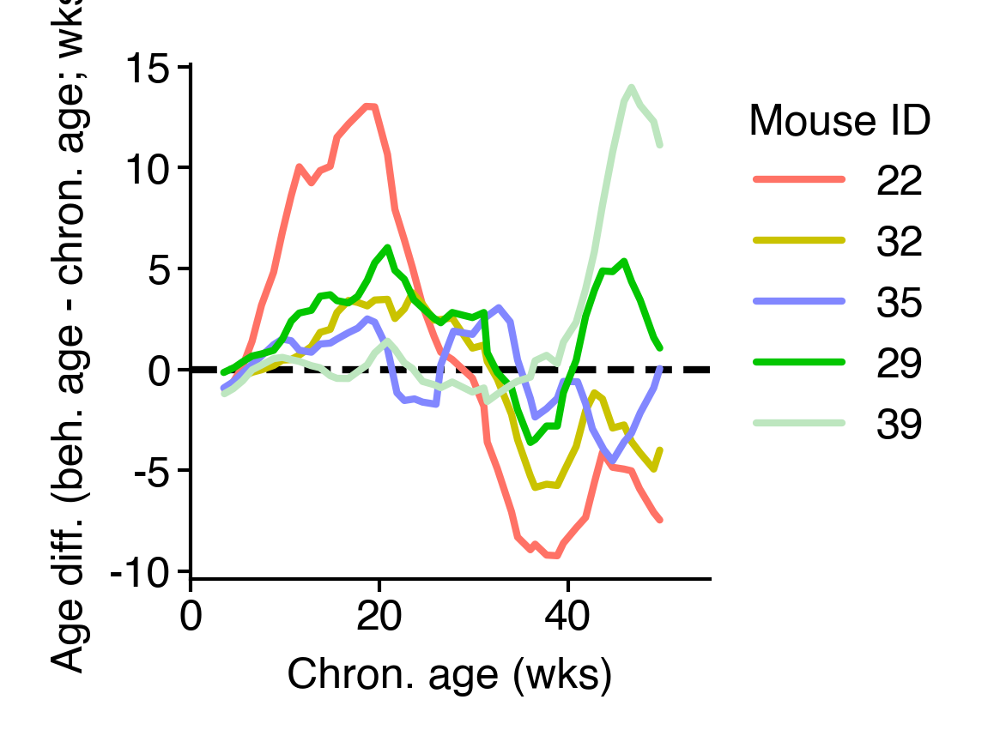

In [37]:
colors = [cc.glasbey[i] for i in hue_order]

fig = figure(1.3, 1.3)

ax = sns.lineplot(
    data=x,
    x="true_ages",
    y="smoothed_diff",
    hue="labels",
    palette=colors,
    legend=True,
    hue_order=hue_order,
)
ax.axhline(0, color='k', ls='--', zorder=-1)
ax.set(xlabel="Chron. age (wks)", ylabel="Age diff. (beh. age - chron. age; wks)", xlim=(0, 55))

legend(ax, title="Mouse ID")
sns.despine()
saver(fig, "smoothed-male-bio-age-5-examples-for-individuals");

## Two male examples

In [38]:
idx = mouse_residuals.sort_values().index

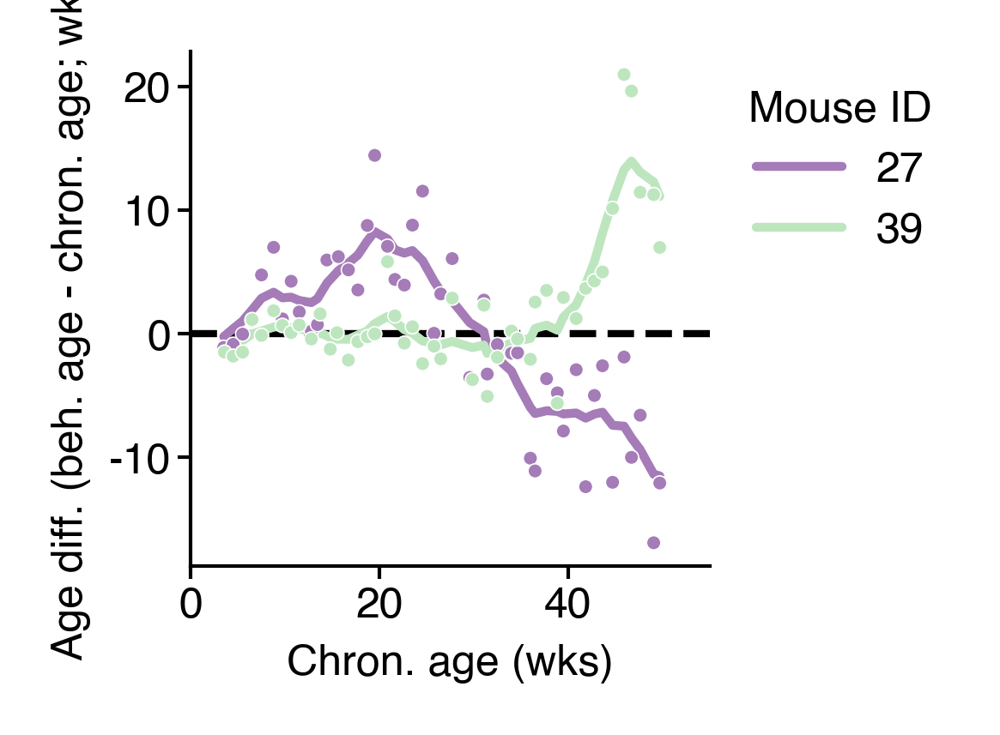

In [39]:
# choose 31 instead of 22
hue_order = idx[[1, -1]]
colors = [cc.glasbey[i] for i in hue_order]

fig = figure(1.3, 1.3)
ax = sns.scatterplot(
    data=x.query("labels in @hue_order"),
    x="true_ages",
    y="diff",
    hue="labels",
    palette=colors,
    legend=False,
    linewidths=0.2,
    s=4,
    hue_order=hue_order,
    zorder=2,
)

ax = sns.lineplot(
    data=x,
    x="true_ages",
    y="smoothed_diff",
    hue="labels",
    palette=colors,
    legend=True,
    hue_order=hue_order,
    lw=1.25,
    zorder=1,
)
ax.axhline(0, color='k', ls='--', zorder=-1)

ax.set(xlabel="Chron. age (wks)", ylabel="Age diff. (beh. age - chron. age; wks)", xlim=(0, 55))
legend(ax, title="Mouse ID")
sns.despine()
saver(fig, "smoothed-male-bio-age-examples-for-individuals");

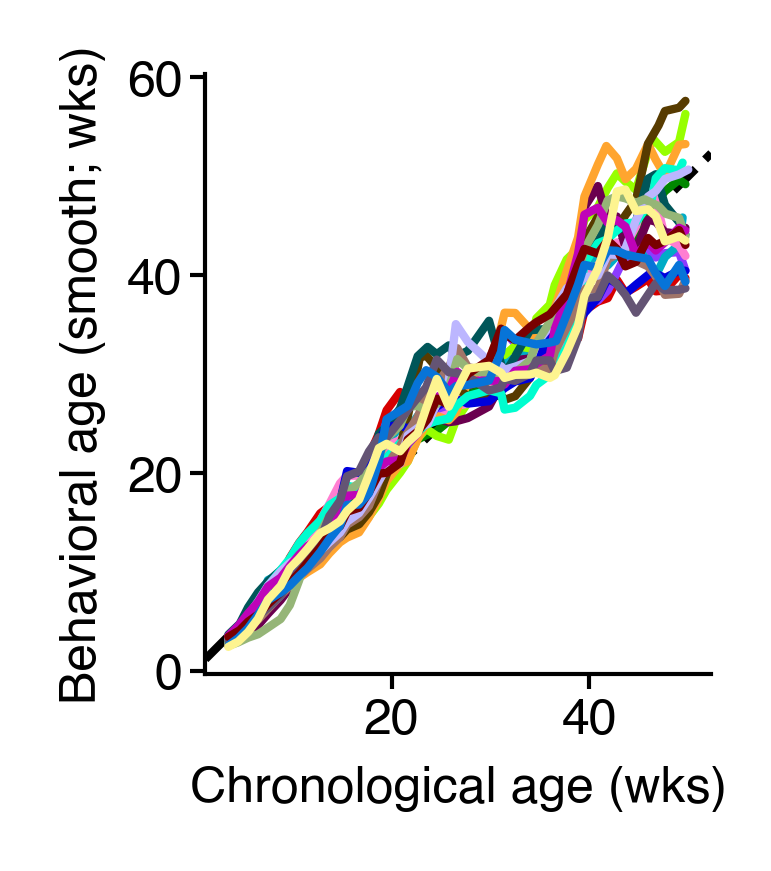

In [40]:
fig = figure(1.5, 1.3)
ax = sns.lineplot(
    data=female,
    x="true_ages",
    y="smoothed_bio_age",
    hue="labels",
    palette=cc.glasbey[:20],
    legend=False,
)
ax.set(
    aspect="equal",
    xlabel="Chronological age (wks)",
    ylabel="Behavioral age (smooth; wks)",
)
add_identity(ax, c="k", ls="--", zorder=-1)
sns.despine()
saver(fig, "smoothed-female-bio-age-for-individuals");

In [41]:
x = female.reset_index(level='age')
x['diff'] = x['bio_ages'] - x['age']
x["smoothed_diff"] = x.sort_values(by='true_ages').groupby("mouse")["diff"].transform(
    lambda x: x.rolling(9, center=True, win_type="exponential", min_periods=1).mean(
        tau=2.25
    )
)
x['diff_smooth'] = x['diff'].rolling(11, center=True, min_periods=1).mean()

# mouse_residuals = x.groupby('labels')['diff_smooth'].median()
mouse_residuals = x.query('age > 25').groupby('labels')['smoothed_diff'].mean()

## Four female examples

In [42]:
idx = mouse_residuals.sort_values().index
hue_order = idx[np.linspace(0, len(idx) - 1, 5, dtype=int)]

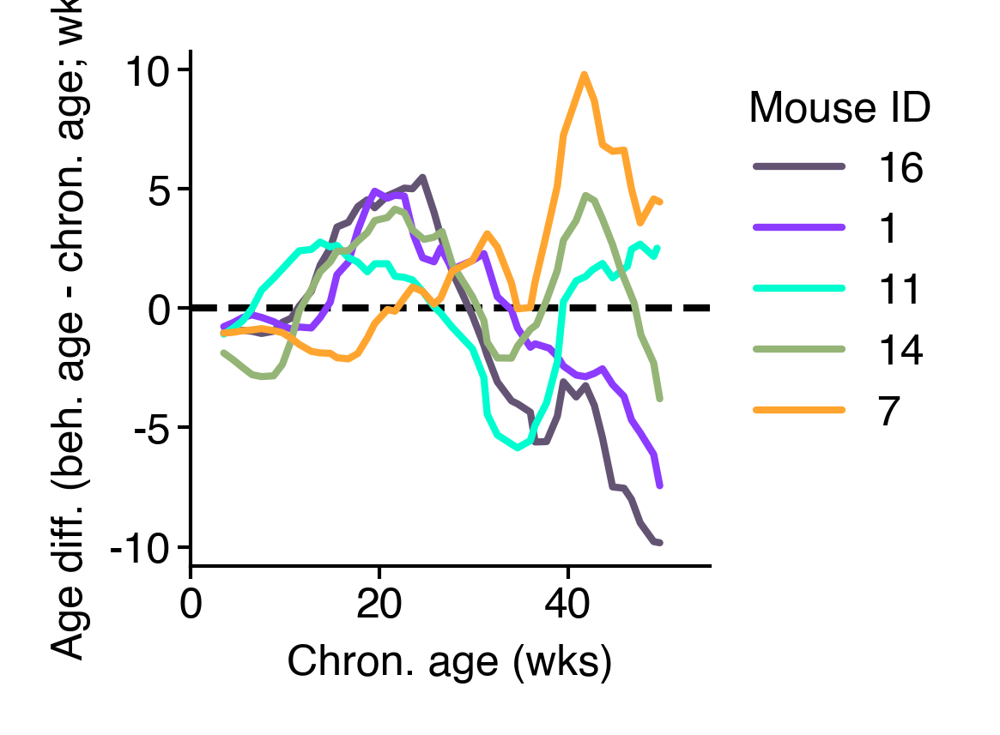

In [43]:
colors = [cc.glasbey[i] for i in hue_order]

fig = figure(1.3, 1.3)

ax = sns.lineplot(
    data=x,
    x="true_ages",
    y="smoothed_diff",
    hue="labels",
    palette=colors,
    legend=True,
    hue_order=hue_order,
)
ax.axhline(0, color='k', ls='--', zorder=-1)
ax.set(xlabel="Chron. age (wks)", ylabel="Age diff. (beh. age - chron. age; wks)", xlim=(0, 55))

legend(ax, title="Mouse ID")
sns.despine()
saver(fig, "smoothed-female-bio-age-5-examples-for-individuals");

## Two female examples

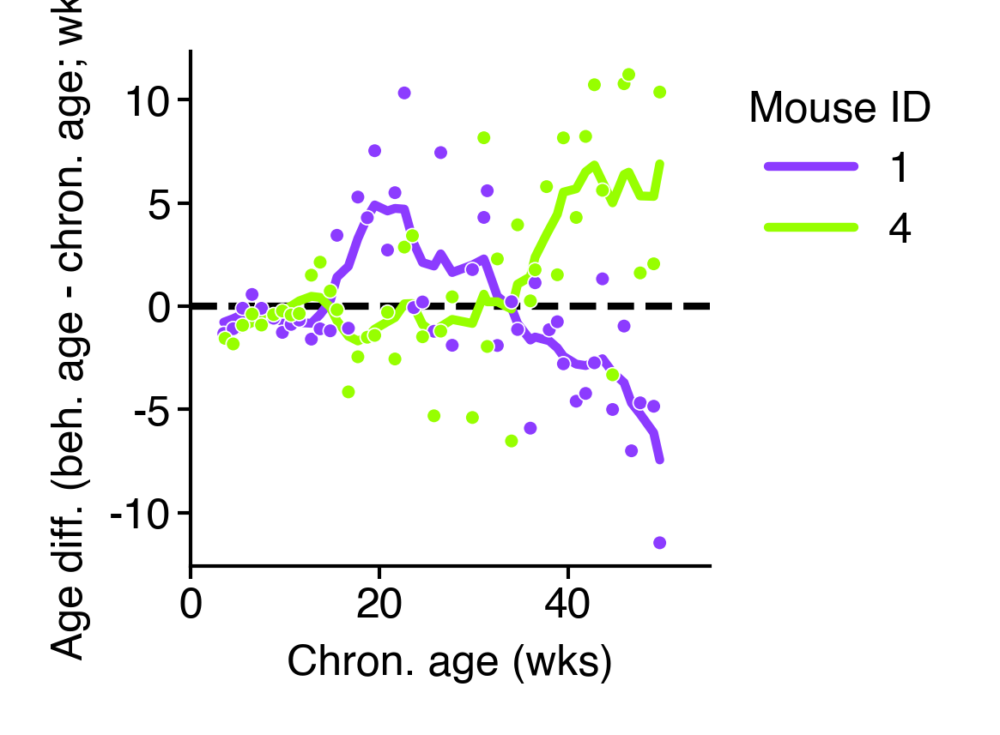

In [44]:
idx = mouse_residuals.sort_values().index
hue_order = idx[[4, -2]]
colors = [cc.glasbey[i] for i in hue_order]

fig = figure(1.3, 1.3)
ax = sns.scatterplot(
    data=x.query("labels in @hue_order"),
    x="true_ages",
    y="diff",
    hue="labels",
    palette=colors,
    legend=False,
    linewidths=0.2,
    s=4,
    hue_order=hue_order,
    zorder=2,
)

ax = sns.lineplot(
    data=x,
    x="true_ages",
    y="smoothed_diff",
    hue="labels",
    palette=colors,
    legend=True,
    hue_order=hue_order,
    lw=1.25,
    zorder=1,
)
ax.axhline(0, color='k', ls='--', zorder=-1)

ax.set(xlabel="Chron. age (wks)", ylabel="Age diff. (beh. age - chron. age; wks)", xlim=(0, 55))
legend(ax, title="Mouse ID")
sns.despine()
saver(fig, "smoothed-female-bio-age-examples-for-individuals");

## K-means cluster aging trajectories

In [45]:
from collections import defaultdict
from sklearn.cluster import k_means
from sklearn.metrics import silhouette_score

In [46]:
age_df['trunc_age'] = (age_df['true_ages'] * 7) // 7
tbl = age_df.pivot_table(index='trunc_age', columns='mouse', values='smoothed_diff').interpolate().iloc[:-1]

In [47]:
ssc = defaultdict(list)
ttbl = tbl.T
for seed in range(50):
    for i in range(2, 7):
        centers, labels, _ = k_means(ttbl, i, random_state=seed)
        ssc[i].append(silhouette_score(ttbl, labels))


In [48]:
ssc = pd.DataFrame(ssc)

<Axes: xlabel='variable', ylabel='value'>

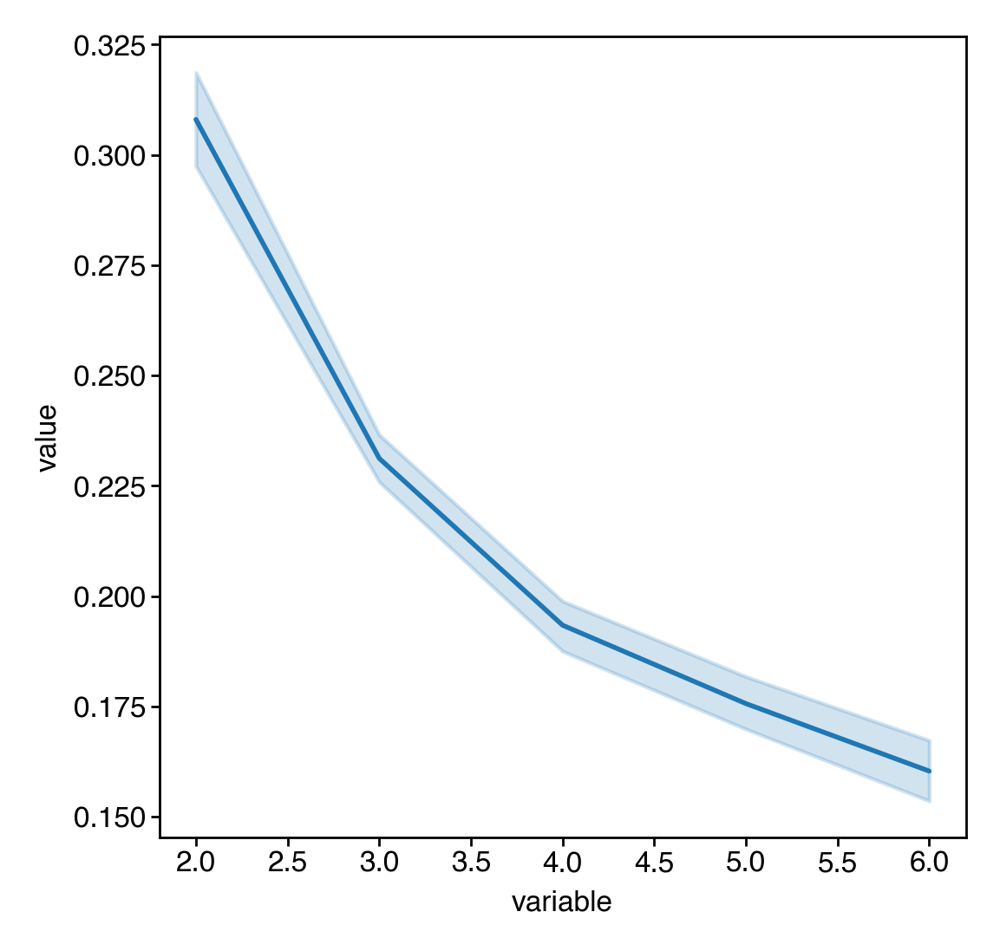

In [49]:
sns.lineplot(data=ssc.melt(), x='variable', y='value')

<Axes: xlabel='trunc_age'>

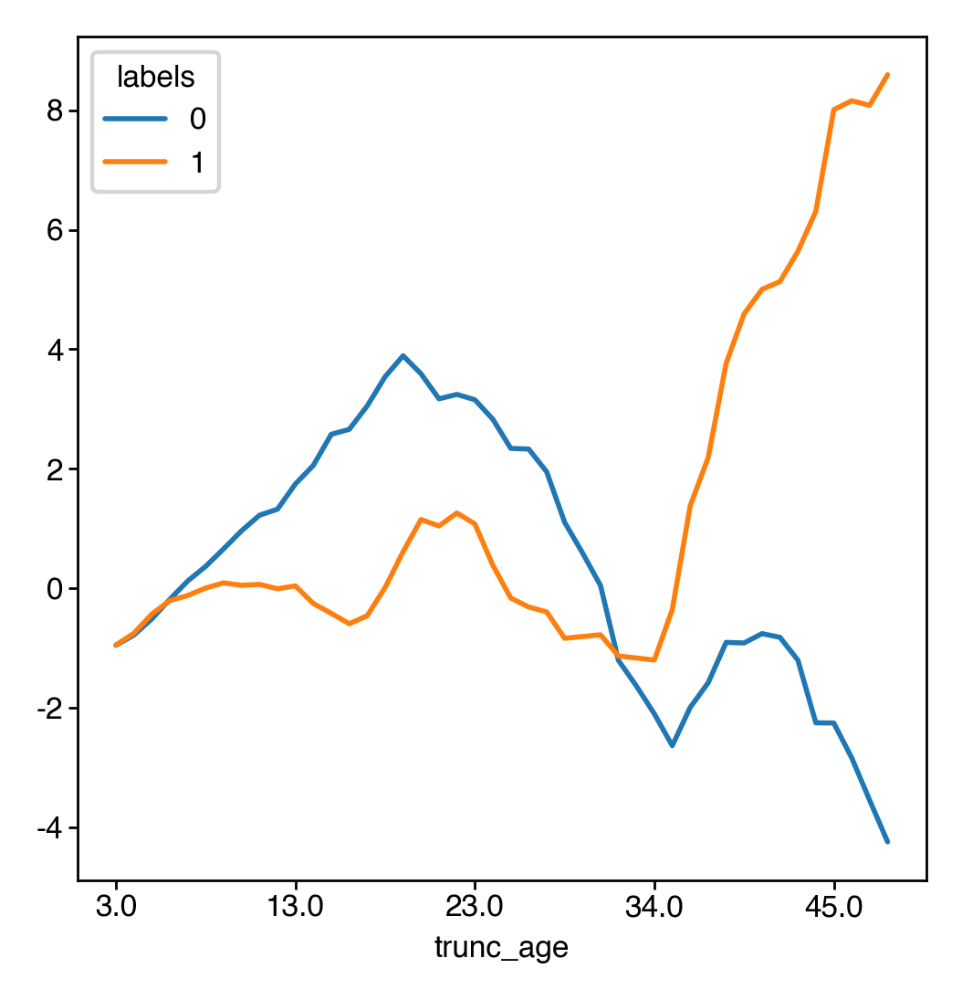

In [50]:
centers, labels, _ = k_means(tbl.T, 2, random_state=4)
ttbl = tbl.T
ttbl['labels'] = labels
_x = ttbl.groupby('labels').mean()
_x.T.plot()

## Autocorrelation

In [51]:
from sklearn.cross_decomposition import PLSRegression
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import make_pipeline

In [52]:
pipeline = make_pipeline(
    StandardScaler(),
    PLSRegression(n_components=7),
)
preds = pipeline.fit(df, df.index.get_level_values('age')).predict(df)
lr_preds = pd.Series(preds, index=df.index)

In [53]:
age_df['diff'] = age_df['bio_ages'] - age_df['true_ages']

autocorrs = {}
for mouse, _df in age_df.groupby('mouse'):
    _df = _df.sort_index(level='age')
    ba_ac = [_df['bio_ages'].autocorr(t) for t in range(23)]
    autocorrs[mouse] = ba_ac

lr_autocorrs = {}
for mouse, _df in lr_preds.groupby('mouse'):
    _df = _df.sort_index(level='age')
    ba_ac = [_df.autocorr(t) for t in range(23)]
    lr_autocorrs[mouse] = ba_ac

In [54]:
lr_autocorrs_df = pd.DataFrame(lr_autocorrs).reset_index().melt(var_name='mouse', value_name='autocorr', id_vars=['index'])
autocorrs_df = pd.DataFrame(autocorrs).reset_index().melt(var_name='mouse', value_name='autocorr', id_vars=['index'])

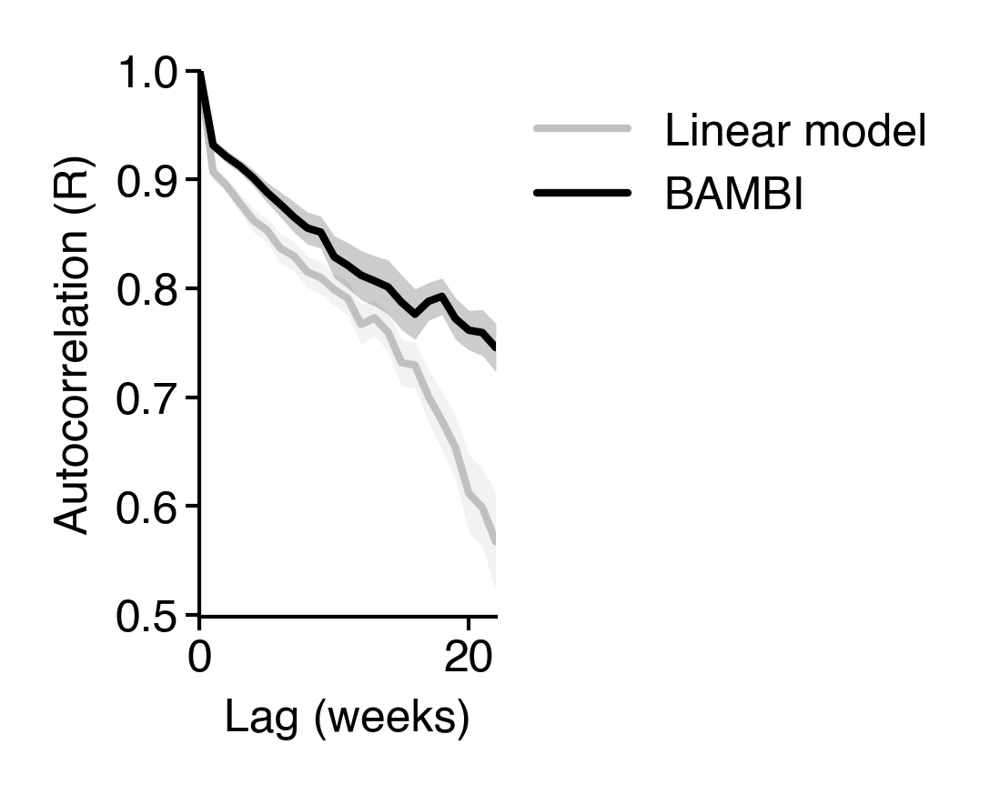

In [55]:
fig = figure(0.7, 1.3)
ax = sns.lineplot(data=lr_autocorrs_df, x='index', y='autocorr', errorbar=('se', 1), err_kws=dict(lw=0), color='silver', label="Linear model")
ax = sns.lineplot(data=autocorrs_df, x='index', y='autocorr', errorbar=('se', 1), err_kws=dict(lw=0), color='k', label='BAMBI')
legend(ax)
ax.set(ylim=(None, 1), xlim=(0, 22), xlabel="Lag (weeks)", ylabel="Autocorrelation (R)")
sns.despine()
saver(fig, "autocorrelation");

## Residual summary

In [56]:
resid_df = age_df.assign(residual=age_df['bio_ages'] - age_df['true_ages'])

In [57]:
old_resid = resid_df.sort_index(level='age').groupby('mouse').last()

In [58]:
old_resid['true_ages'].mean()

49.58929

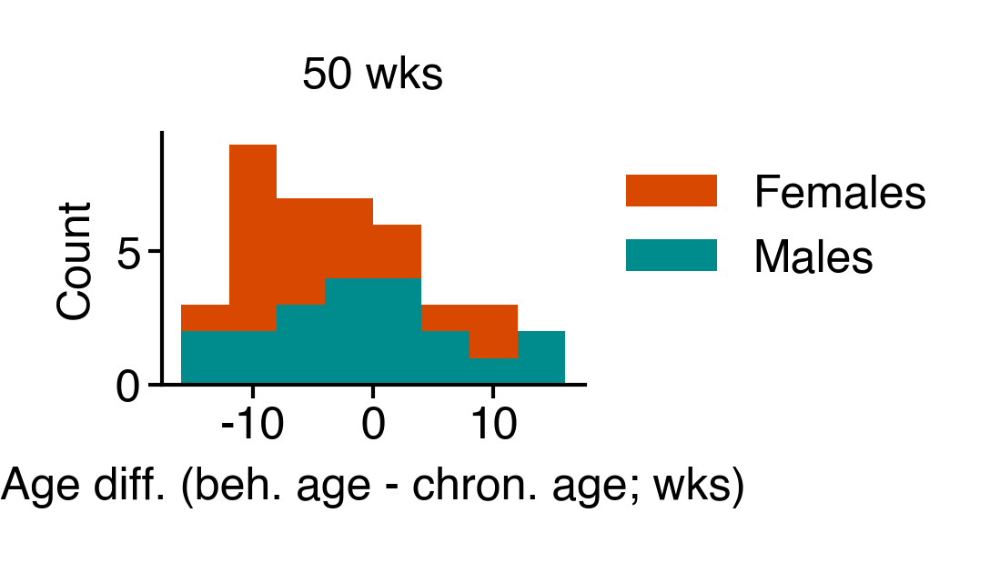

In [59]:
fig = figure(1, 0.6)
bins = np.linspace(-16, 16, 9)
ax = sns.histplot(data=old_resid, x='residual', bins=bins, element='step', color=COLORMAPS.ont_female(255), label="Females", lw=0, alpha=1)
sns.histplot(data=old_resid.query('sex == 0'), x='residual', bins=bins, element='step', color=COLORMAPS.ont_male(255), label="Males", lw=0, alpha=1, ax=ax)
ax.set(xlabel="Age diff. (beh. age - chron. age; wks)", title="50 wks")
legend(ax)
sns.despine()
saver(fig, "old-age-residual-histogram");

In [60]:
_x = resid_df[resid_df['true_ages'].between(24.5, 25.5)].drop_duplicates(subset='labels')

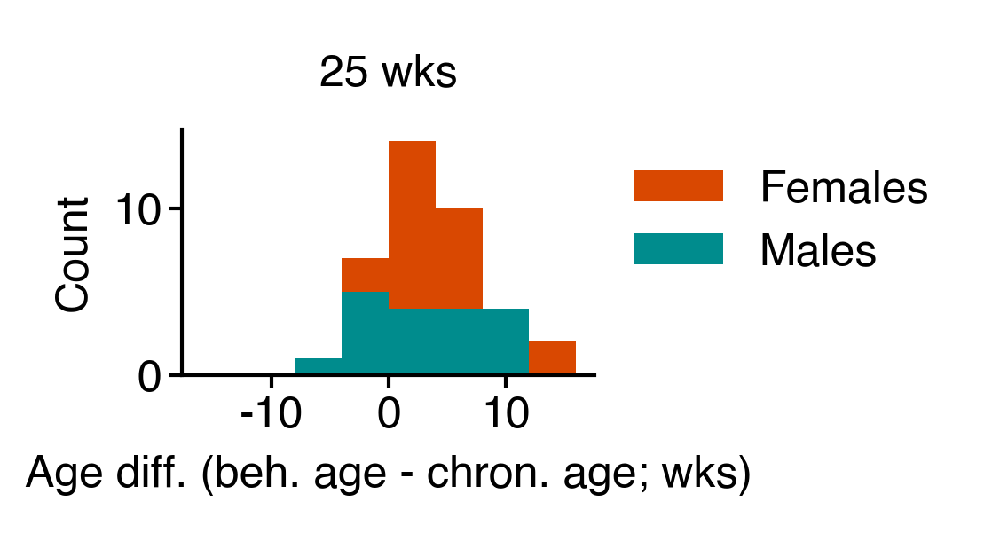

In [61]:
fig = figure(1, 0.6)
bins = np.linspace(-16, 16, 9)
ax = sns.histplot(data=_x, x='residual', bins=bins, element='step', color=COLORMAPS.ont_female(255), label="Females", lw=0, alpha=1)
sns.histplot(data=_x.query('sex == 0'), x='residual', bins=bins, element='step', color=COLORMAPS.ont_male(255), label="Males", lw=0, alpha=1, ax=ax)
ax.set(xlabel="Age diff. (beh. age - chron. age; wks)", title="25 wks")
legend(ax)
sns.despine()
saver(fig, "mid-age-residual-histogram");

## Get individual biases

In [62]:
biases = [np.array(raise_dim(p, axis=1)) for p in mdl['params']['individual_biases']]
male_biases = biases[0][sort_idx]
female_biases = biases[1][sort_idx]

In [63]:
sex_biases = np.array(raise_dim(mdl['params']['sex_biases'], axis=1))[sort_idx]
male_sex_biases = sex_biases[:, 0]
female_sex_biases = sex_biases[:, 1]

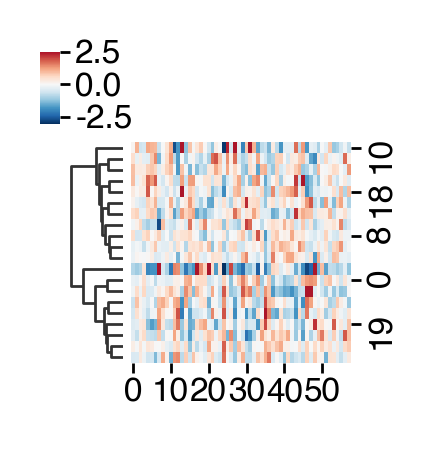

In [64]:
g = sns.clustermap(male_biases.T, cmap='RdBu_r', col_cluster=False, center=0, vmax=2.5, metric='euclidean', method='ward', figsize=(1, 1))
row_order = g.dendrogram_row.dendrogram['leaves']

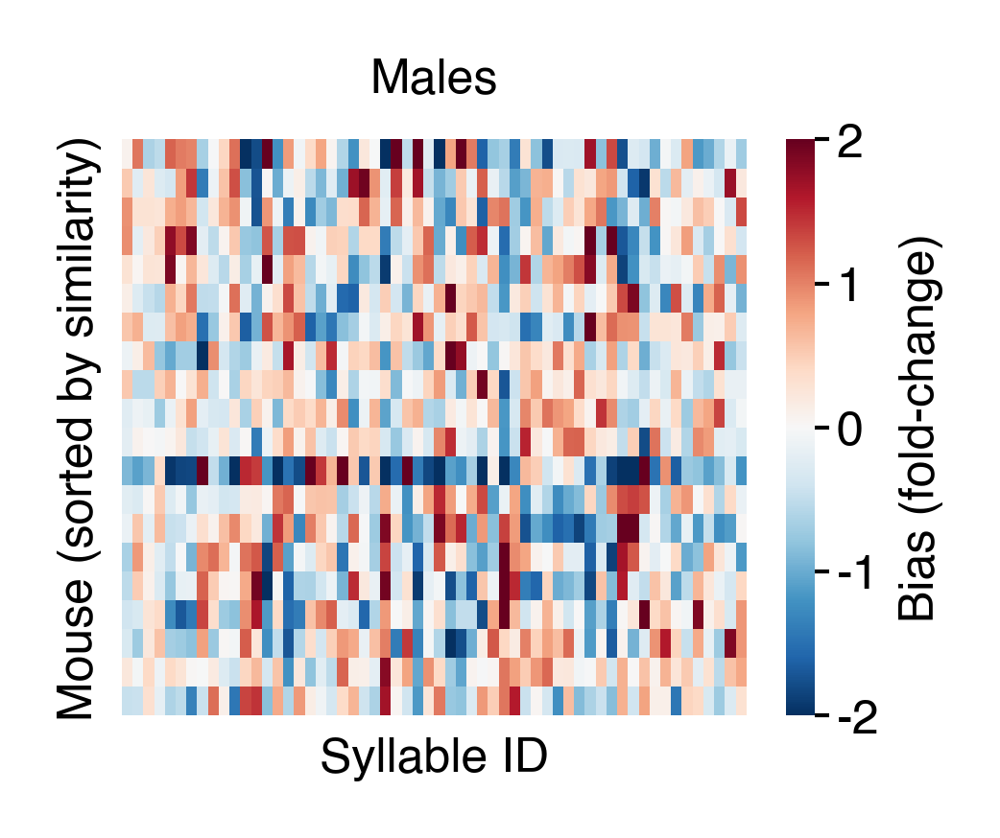

In [65]:
fig = figure(1.75, 1.3)
ax = sns.heatmap(
    male_biases.T[row_order],
    cmap="RdBu_r",
    center=0,
    vmax=2,
    vmin=-2,
    cbar_kws=dict(label="Bias (fold-change)"),
)
ax.set(
    yticks=[],
    ylabel="Mouse (sorted by similarity)",
    xlabel="Syllable ID",
    xticks=[],
    title="Males",
)
saver(fig, "long-v2-males-bias-sorted");

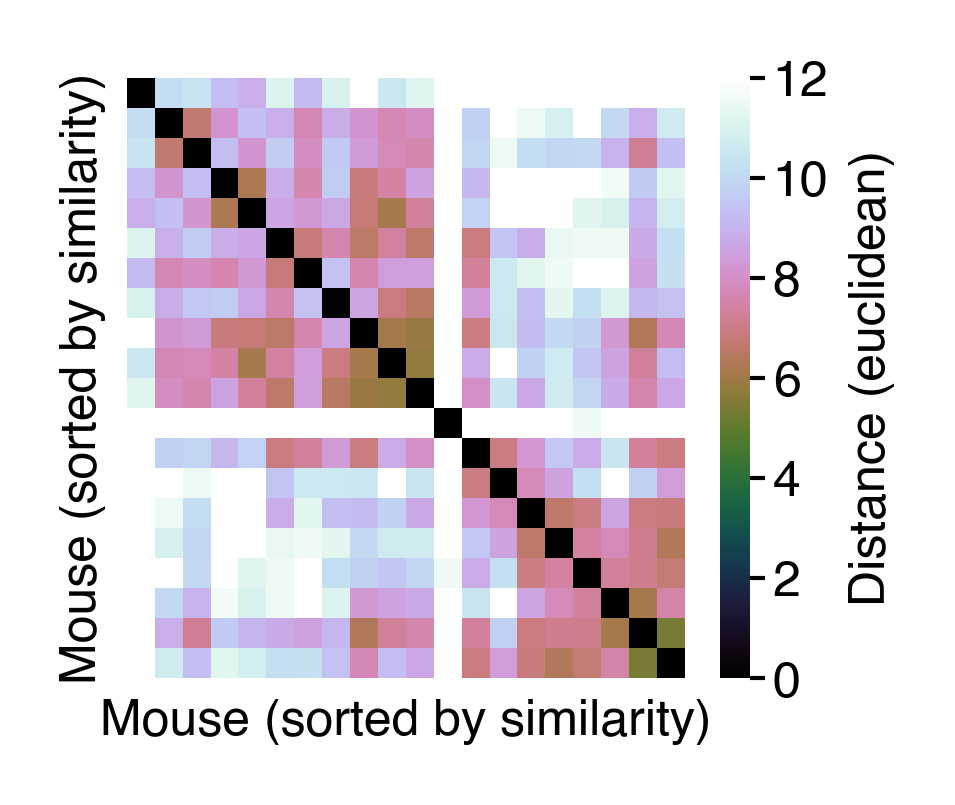

In [66]:
male_bias_dist = squareform(pdist(male_biases.T[row_order], metric='euclidean'))
fig = figure(1.5, 1.3)
ax = sns.heatmap(male_bias_dist, cmap='cubehelix', vmax=12, cbar_kws=dict(label="Distance (euclidean)"))
ax.set(xticks=[], xlabel="Mouse (sorted by similarity)", yticks=[], ylabel="Mouse (sorted by similarity)")
saver(fig, "male-bias-euc-dist-matrix");

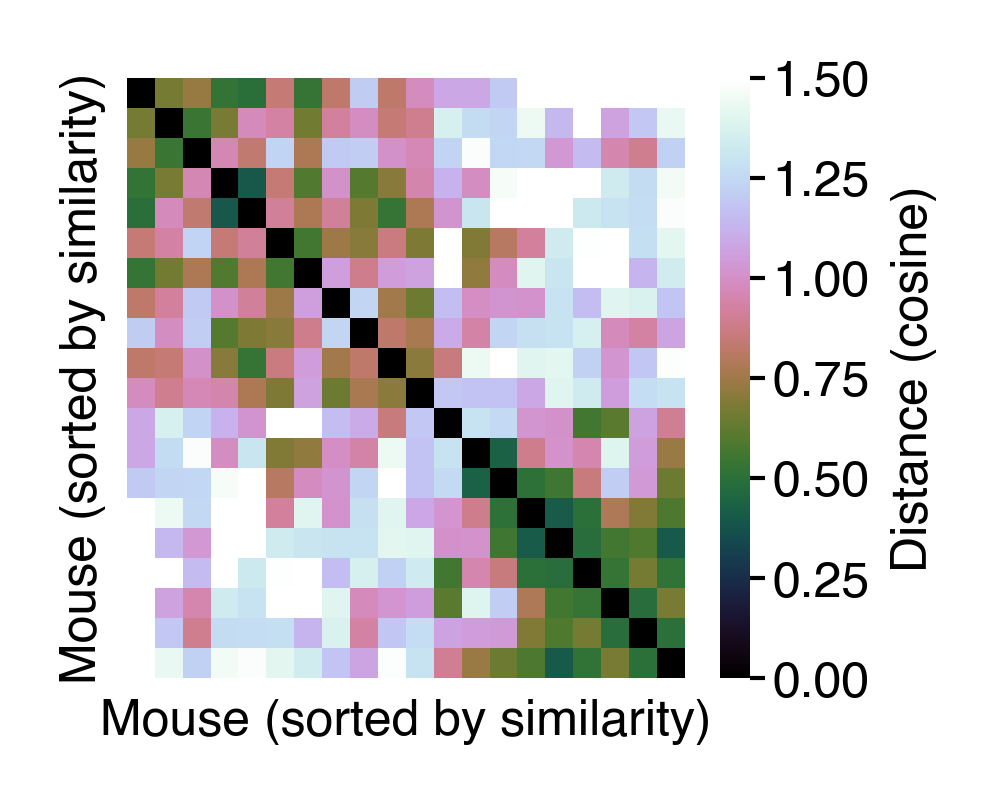

In [67]:
male_bias_dist = squareform(pdist(male_biases.T[row_order], metric='cosine'))
fig = figure(1.5, 1.3)
ax = sns.heatmap(male_bias_dist, cmap='cubehelix', vmax=1.5, cbar_kws=dict(label="Distance (cosine)"))
ax.set(xticks=[], xlabel="Mouse (sorted by similarity)", yticks=[], ylabel="Mouse (sorted by similarity)")
saver(fig, "male-bias-cos-dist-matrix");

In [68]:
# get similar and dissimilar mouse examples
male_similar = [3, 4]
male_similar = [mouse_cat[row_order[i] + 20] for i in male_similar]
male_dissimilar = mouse_cat[row_order[14] + 20]

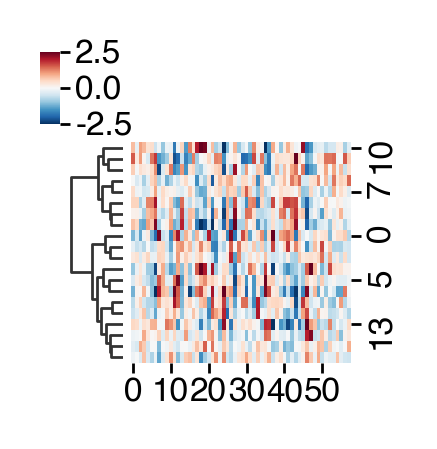

In [69]:
g = sns.clustermap(female_biases.T, cmap='RdBu_r', col_cluster=False, center=0, vmin=-2.5, vmax=2.5, metric='euclidean', method='ward', figsize=(1, 1))
row_order = g.dendrogram_row.dendrogram['leaves']

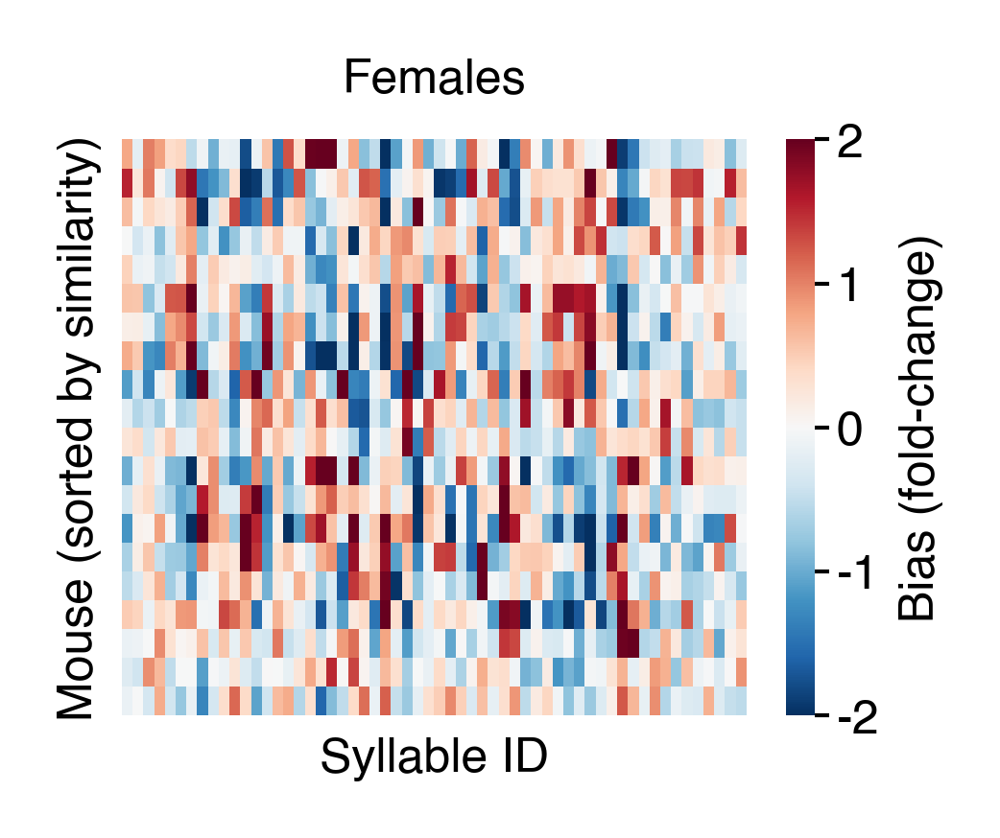

In [70]:
fig = figure(1.75, 1.3)
ax = sns.heatmap(female_biases.T[row_order], cmap='RdBu_r', center=0, vmax=2, vmin=-2, cbar_kws=dict(label="Bias (fold-change)"))
ax.set(yticks=[], ylabel="Mouse (sorted by similarity)", xlabel="Syllable ID", xticks=[], title="Females")
saver(fig, "long-v2-females-bias-sorted");

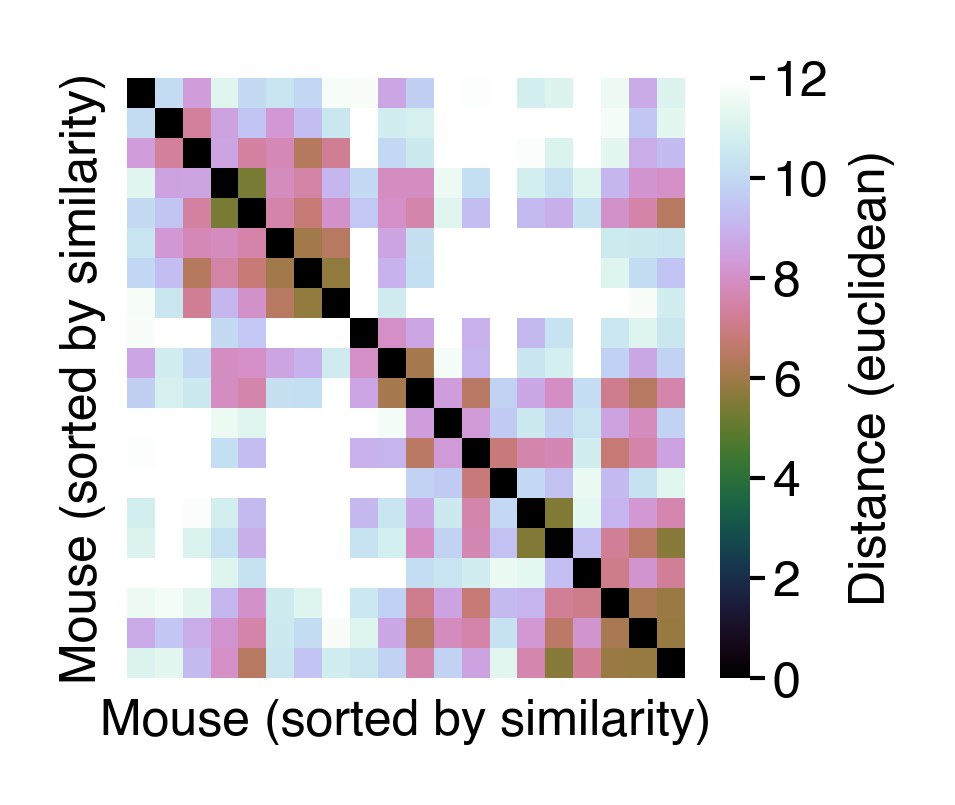

In [71]:
female_bias_dist = squareform(pdist(female_biases.T[row_order], metric='euclidean'))
fig = figure(1.5, 1.3)
ax = sns.heatmap(female_bias_dist, cmap='cubehelix', vmax=12, cbar_kws=dict(label="Distance (euclidean)"))
ax.set(xticks=[], xlabel="Mouse (sorted by similarity)", yticks=[], ylabel="Mouse (sorted by similarity)")
saver(fig, "female-bias-euc-dist-matrix");

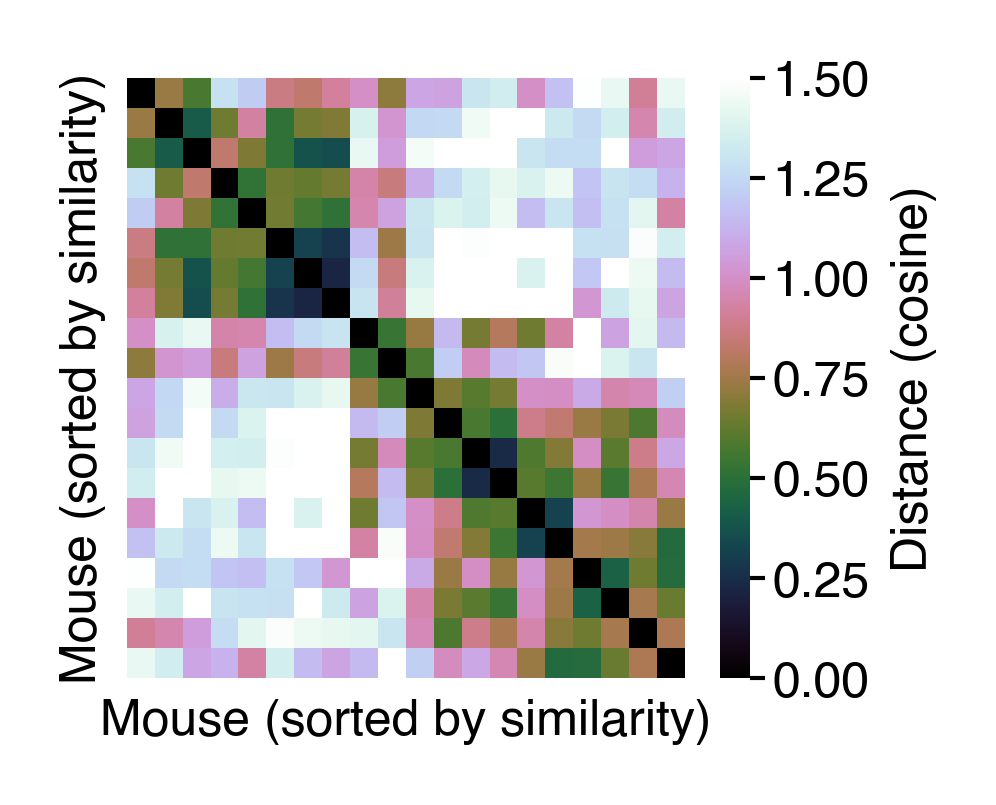

In [72]:
female_bias_dist = squareform(pdist(female_biases.T[row_order], metric='cosine'))
fig = figure(1.5, 1.3)
ax = sns.heatmap(female_bias_dist, cmap='cubehelix', vmax=1.5, cbar_kws=dict(label="Distance (cosine)"))
ax.set(xticks=[], xlabel="Mouse (sorted by similarity)", yticks=[], ylabel="Mouse (sorted by similarity)")
saver(fig, "female-bias-cos-dist-matrix");

In [73]:
# get similar and dissimilar mouse examples
# female_similar = [2, 3]
female_similar = [8, 9]
female_similar = [mouse_cat[row_order[i]] for i in female_similar]
female_dissimilar = mouse_cat[row_order[19]]

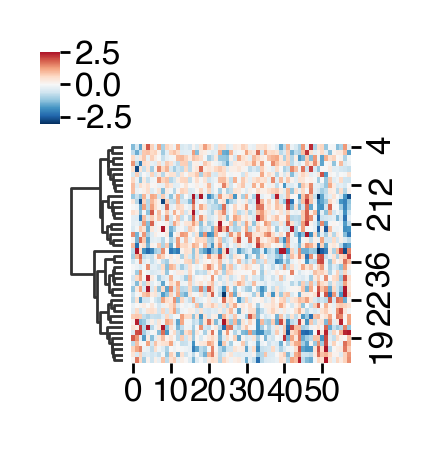

In [74]:
_biases = np.concatenate(biases, axis=1)
g = sns.clustermap(_biases.T, cmap='RdBu_r', col_cluster=False, center=0, vmax=2.5, metric='euclidean', method='ward', figsize=(1, 1))
row_order = g.dendrogram_row.dendrogram['leaves']

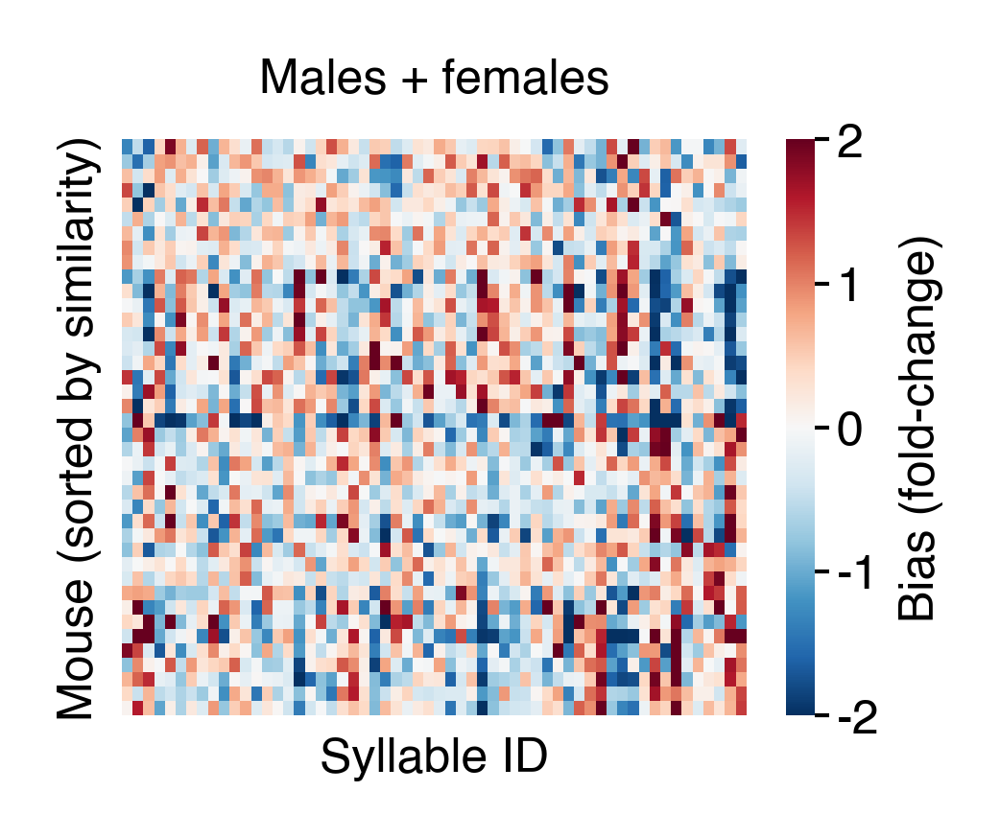

In [75]:
fig = figure(1.75, 1.3)
ax = sns.heatmap(
    _biases.T[row_order],
    cmap="RdBu_r",
    center=0,
    vmax=2,
    vmin=-2,
    cbar_kws=dict(label="Bias (fold-change)"),
)
ax.set(
    yticks=[],
    ylabel="Mouse (sorted by similarity)",
    xlabel="Syllable ID",
    xticks=[],
    title="Males + females",
)
saver(fig, "long-v2-males-females-bias-sorted");

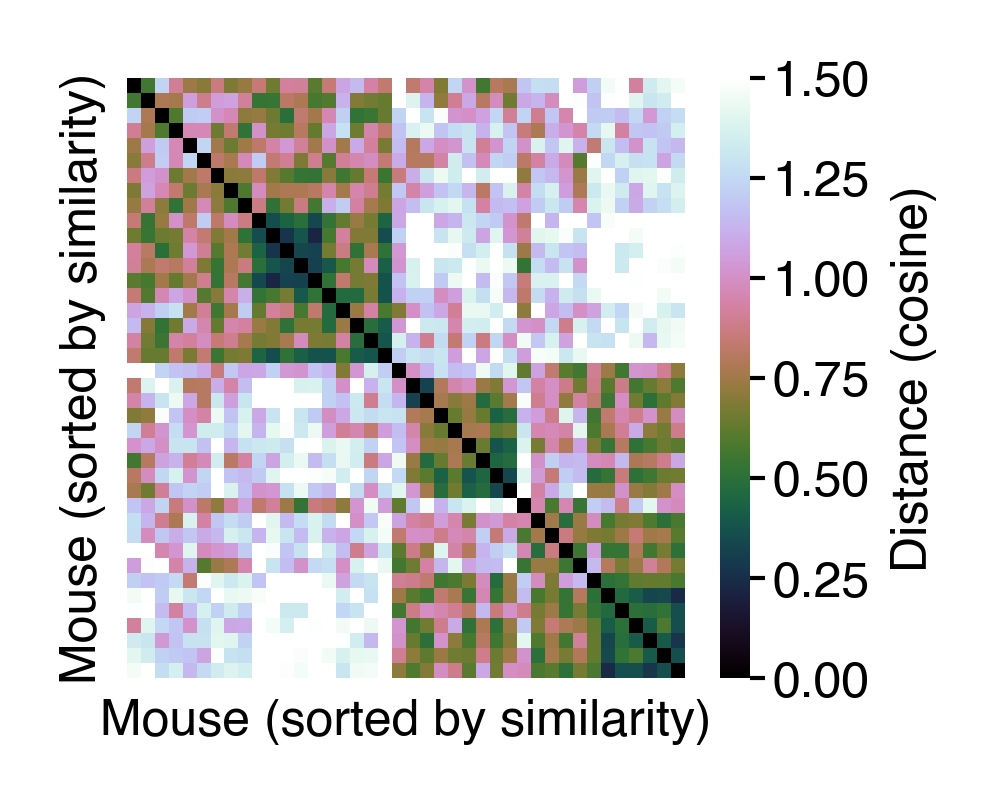

In [76]:
bias_dist = squareform(pdist(_biases.T[row_order], metric='cosine'))
fig = figure(1.5, 1.3)
ax = sns.heatmap(bias_dist, cmap='cubehelix', vmax=1.5, cbar_kws=dict(label="Distance (cosine)"))
ax.set(xticks=[], xlabel="Mouse (sorted by similarity)", yticks=[], ylabel="Mouse (sorted by similarity)")
saver(fig, "male-female-bias-cos-dist-matrix");

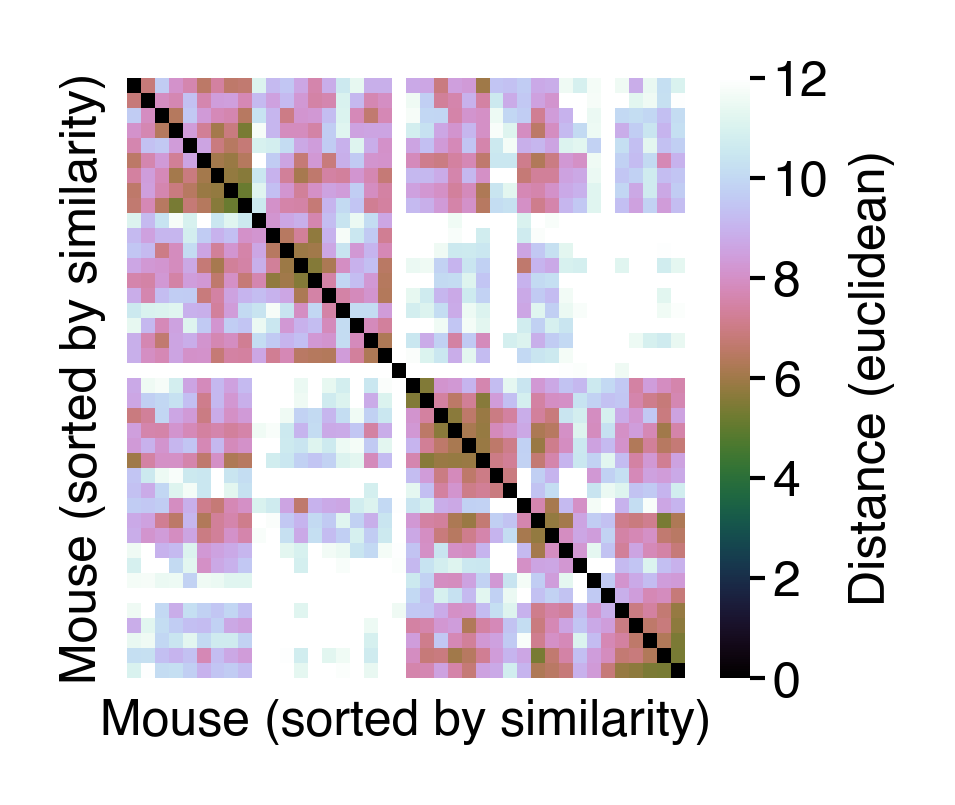

In [77]:
bias_dist = squareform(pdist(_biases.T[row_order], metric='euclidean'))
fig = figure(1.5, 1.3)
ax = sns.heatmap(bias_dist, cmap='cubehelix', vmax=12, cbar_kws=dict(label="Distance (euclidean)"))
ax.set(xticks=[], xlabel="Mouse (sorted by similarity)", yticks=[], ylabel="Mouse (sorted by similarity)")
saver(fig, "male-female-bias-euc-dist-matrix");

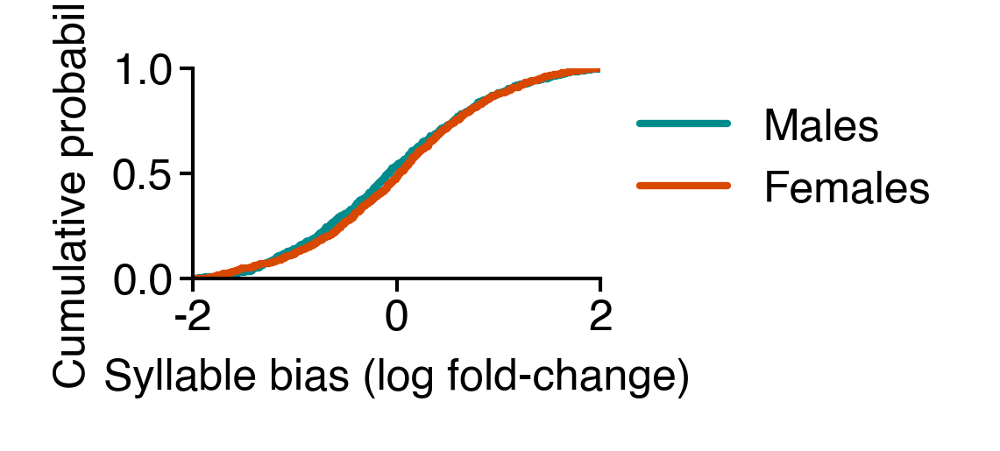

In [78]:
fig = figure(1, 0.4 * 1.3)
sns.histplot(
    (male_biases + male_sex_biases[:, None]).flatten(),
    color=COLORMAPS.ont_male(255),
    cumulative=True,
    bins=np.linspace(-2, 2, 200),
    stat="probability",
    element="step",
    fill=False,
    label="Males",
)
ax = sns.histplot(
    (female_biases + female_sex_biases[:, None]).flatten(),
    color=COLORMAPS.ont_female(255),
    cumulative=True,
    bins=np.linspace(-2, 2, 200),
    stat="probability",
    element="step",
    fill=False,
    label="Females",
)
ax.set(
    ylabel="Cumulative probability",
    xlabel="Syllable bias (log fold-change)",
    ylim=(0, 1),
    xlim=(-2, 2),
    xticks=[-2, 0, 2],
)
sns.despine()
legend()
saver(fig, "male-female-syllable-plus-sex-bias-distribution");

## PCA on model predictions

In [79]:
import umap

In [80]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import ParameterGrid, ParameterSampler
from mpl_toolkits.mplot3d import Axes3D

In [81]:
from scipy.spatial.distance import jensenshannon

In [82]:
umap_saver = save_factory(PLOT_CONFIG.save_path / "long-v2-umap-options", tight_layout=False)

In [83]:
def robust_min_max(data):
    return (data - np.quantile(data, 0.01, axis=0, keepdims=True)) / (
        np.quantile(data, 0.99, axis=0, keepdims=True)
        - np.quantile(data, 0.01, axis=0, keepdims=True)
    )

In [84]:
# NOTE: I can only do this because I concatenate males and then females
_sex = np.argmax(features["sex"], axis=0)
mm_preds = np.concatenate(
    [
        robust_min_max(mdl["predicted_counts"][_sex == 0]),
        robust_min_max(mdl["predicted_counts"][_sex == 1]),
    ]
)
mm_counts = np.concatenate(
    [robust_min_max(mdl["counts"][_sex == 0]), robust_min_max(mdl["counts"][_sex == 1])]
)

In [85]:
def make_pca(preds, counts, n_components, mdl_type="pca", **umap_params):
    if mdl_type == "pca":
        scores = PCA(n_components).fit_transform(preds)
        scores2 = PCA(n_components).fit_transform(counts)
    elif mdl_type == "umap":
        if n_components > 2:
            print(f"Warning: {n_components=} when using UMAP - setting to 2")
            n_components = 2
        # _umap = umap.UMAP(n_components=n_components, n_neighbors=80, random_state=0, min_dist=0.2, spread=0.9, metric=jensenshannon)
        _umap = umap.UMAP(**umap_params, n_components=n_components, n_jobs=1, low_memory=False)
        # fit to raw data
        scores2 = _umap.fit_transform(counts)
        # apply to predictions
        scores = _umap.transform(preds)
        # scores = _umap.fit_transform(preds)

    scores_df = pd.DataFrame(scores, index=df.index, columns=range(n_components))
    scores_df2 = pd.DataFrame(scores2, index=df.index, columns=range(n_components))

    for feat, _df in zip(("predicted", "observed"), (scores_df, scores_df2)):
        _df.columns = pd.MultiIndex.from_product([[feat]] + [range(n_components)])

    scores_df = scores_df.join(scores_df2)
    scores_df['mouse_id'] = np.argmax(features['mice'], axis=0)
    scores_df['bio_age'] = mdl['bio_ages']

    return scores_df.set_index('bio_age', append=True)


def plot_pca(scores_df, score_type='predicted', age_type='age'):
    _ages = scores_df.index.get_level_values(age_type)
    norm = plt.Normalize(vmin=_ages.min(), vmax=_ages.max())

    fig = figure(1.5, 1.5)
    for s, _df in scores_df.groupby('sex'):
        _age = _df.index.get_level_values(age_type)
        cmap = COLORMAPS.ont_female if bool(s) else COLORMAPS.ont_male
        plt.scatter(_df[(score_type, 0)], _df[(score_type, 1)], c=cmap(norm(_age)), s=4, lw=0)
    sns.despine()
    return fig


def plot_pca_with_inds(scores_df, score_type='predicted', age_type='age', cmap_type='temp', mdl_type="pca"):
    _ages = scores_df.index.get_level_values(age_type)

    fig, ax = plt.subplots(1, 2, sharex=True, sharey=True, figsize=(2.7, 1.3))
    for (s, mouse), _df in scores_df.groupby(["sex", "mouse_id"]):
        _age = _df.index.get_level_values(age_type)
        if 'temp' in cmap_type:
            cmap = cc.glasbey_warm if bool(s) else cc.glasbey_cool
        elif 'og' in cmap_type:
            cmap = cc.glasbey[:20] if bool(s) else cc.glasbey[20:40]
            mouse = mouse if bool(s) else mouse - 20
        cmap = sns.blend_palette(["w", cmap[mouse]], as_cmap=True)
        ax[s].scatter(
            _df[(score_type, 0)],
            _df[(score_type, 1)],
            c=_age,
            cmap=cmap,
            s=2.5,
            alpha=1,
            vmin=-10,
            vmax=pd.Series(_ages).quantile(0.9),
            lw=0.05,
            edgecolor='k',
        )
        if mdl_type == "pca":
            ax[s].set(xticks=[], yticks=[], xlabel="PC 1", ylabel="PC 2")
        elif mdl_type == "umap":
            ax[s].set(xticks=[], yticks=[], xlabel="Dim 1", ylabel="Dim 2")
    sns.despine()
    return fig, ax

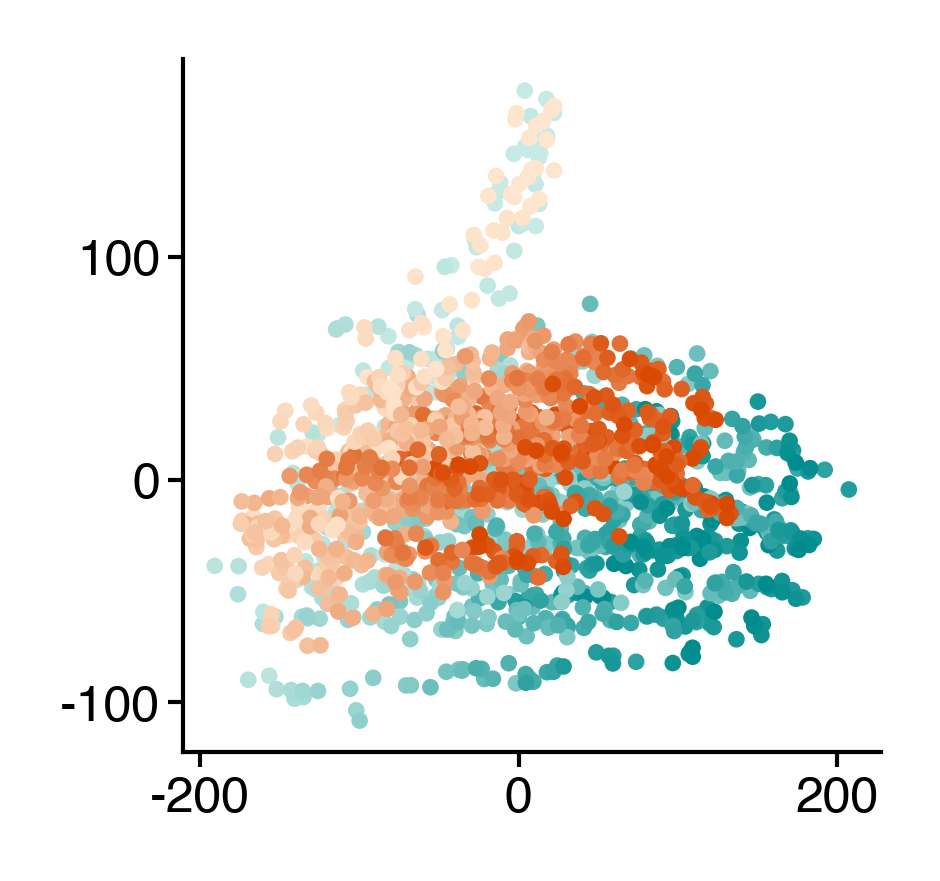

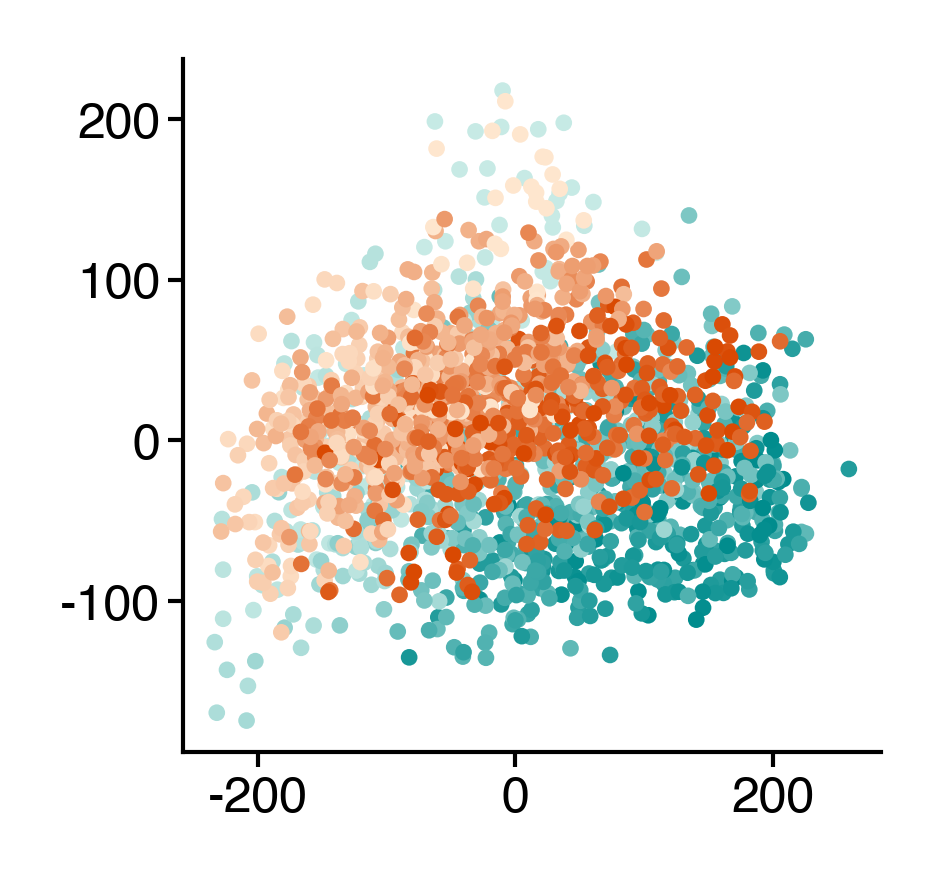

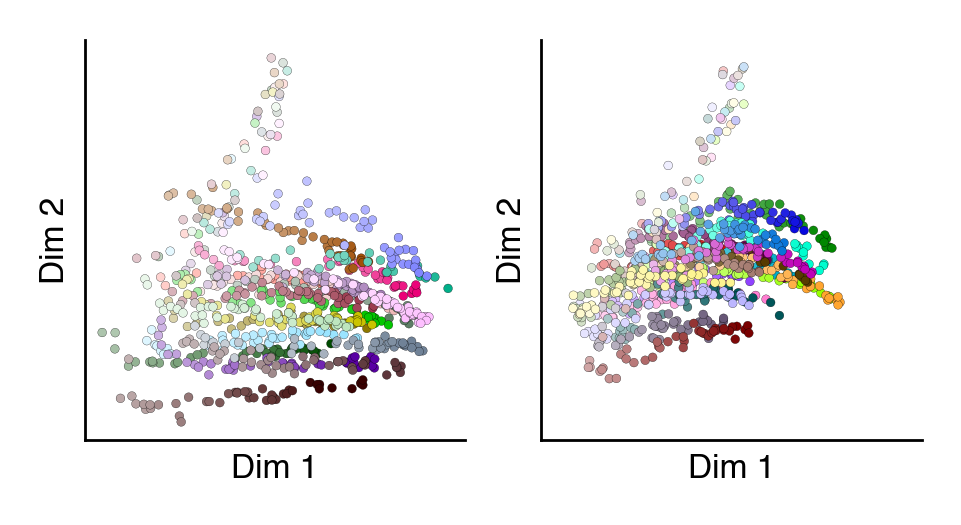

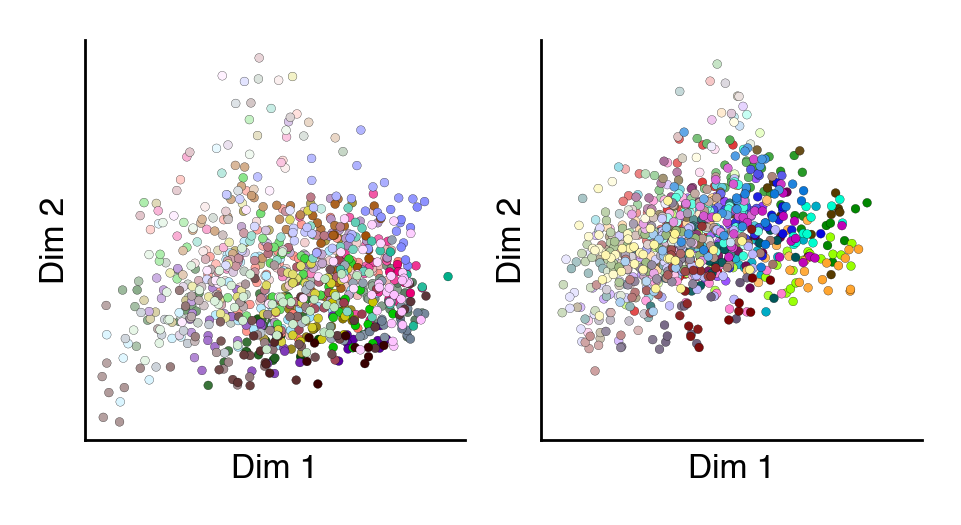

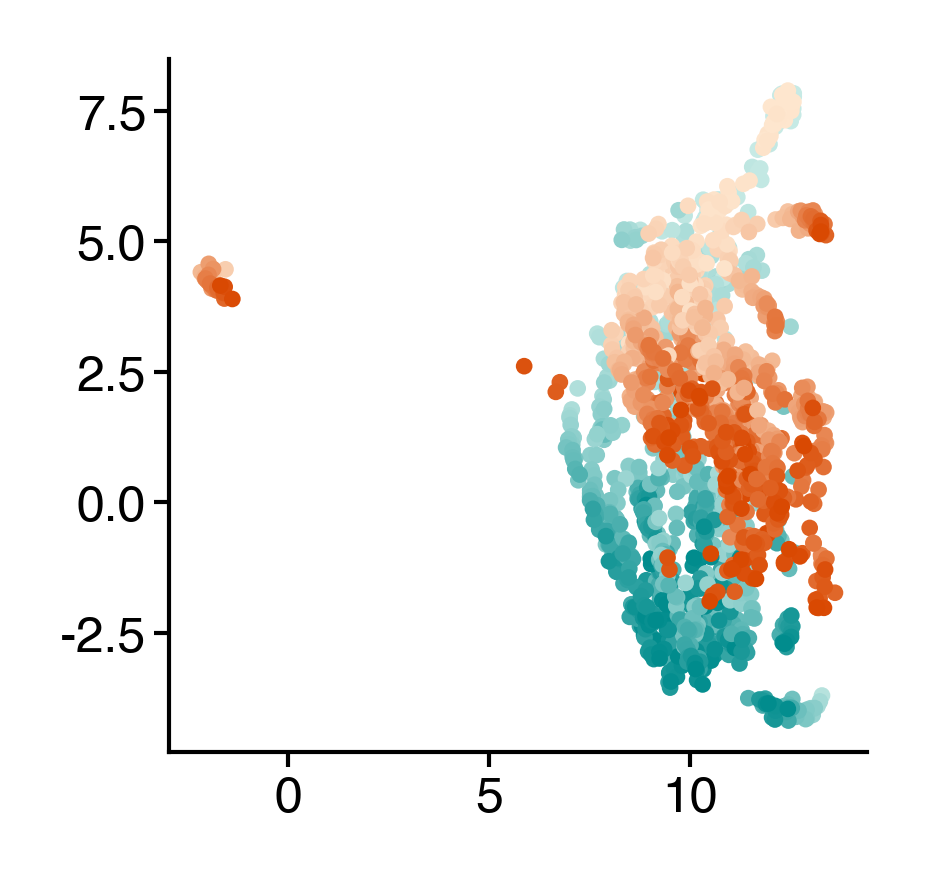

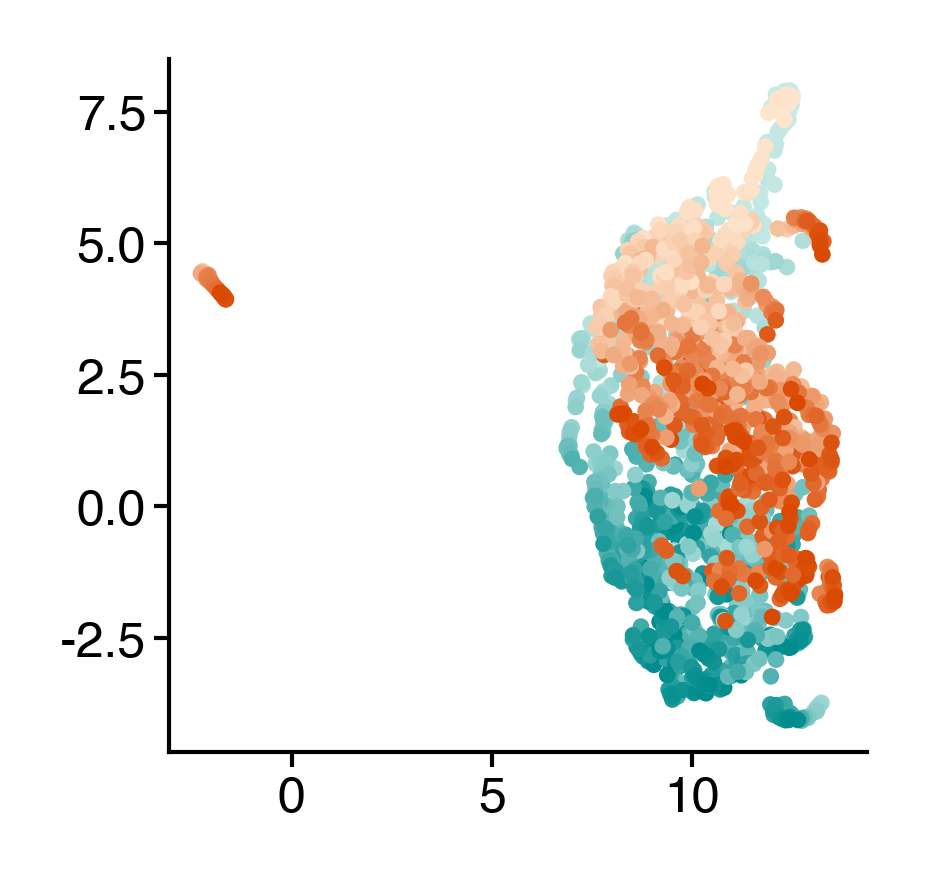

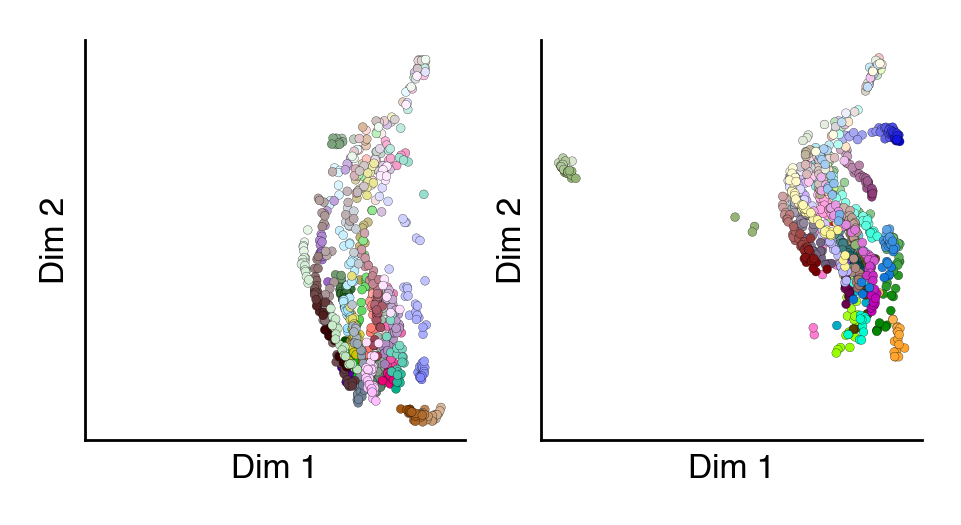

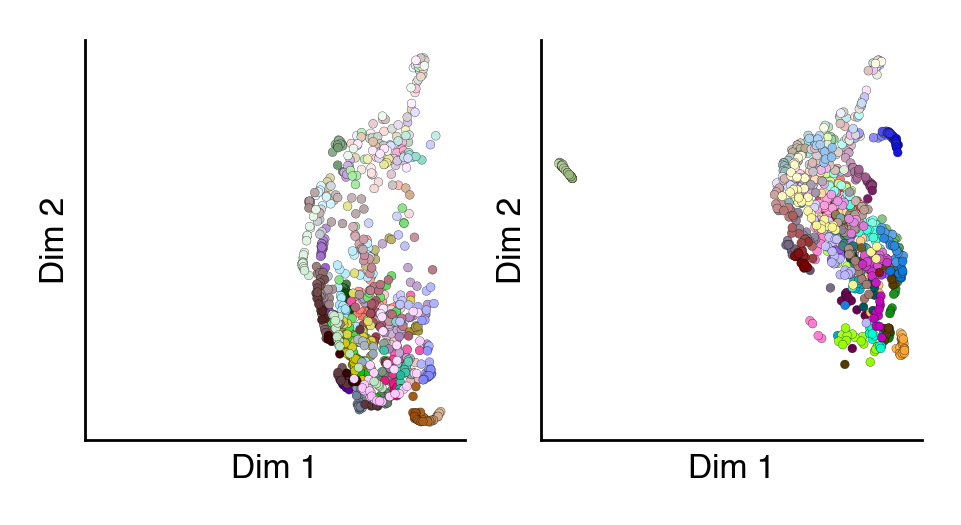

In [86]:
for mdl_type in ("pca", "umap"):
    scores_df = make_pca(mdl['predicted_counts'], mdl['counts'], 3, mdl_type=mdl_type, min_dist=0.2, metric='euclidean', n_neighbors=30,)

    fig = plot_pca(scores_df, 'predicted', 'age')
    fig = plot_pca(scores_df, 'observed', 'age')

    fig, ax = plot_pca_with_inds(scores_df, "predicted", "bio_age", "og", mdl_type='umap')
    saver(fig, f"model-based-{mdl_type}-colored-by-individuals-og-coloring");

    fig, ax = plot_pca_with_inds(scores_df, "observed", "bio_age", 'og', mdl_type='umap')
    saver(fig, f"og-{mdl_type}-colored-by-individuals-og-coloring");

## Relative contributions

### New version

In [87]:
mdl_params = mdl['params']
mdl_components = mdl['init_components']
indiv_bias_scale = np.exp(mdl_params['development_weights'] @ mdl_components.bases['development'])
sex_bias_scale = np.exp(mdl_params['sex_weights'] @ mdl_components.bases['sex'])
list(mdl_params)

['bio_basis_weights',
 'development_weights',
 'individual_biases',
 'sex_biases',
 'sex_weights',
 'size_slope']

### Size

In [88]:
size_effect = np.abs(mdl_params['size_slope'].squeeze())

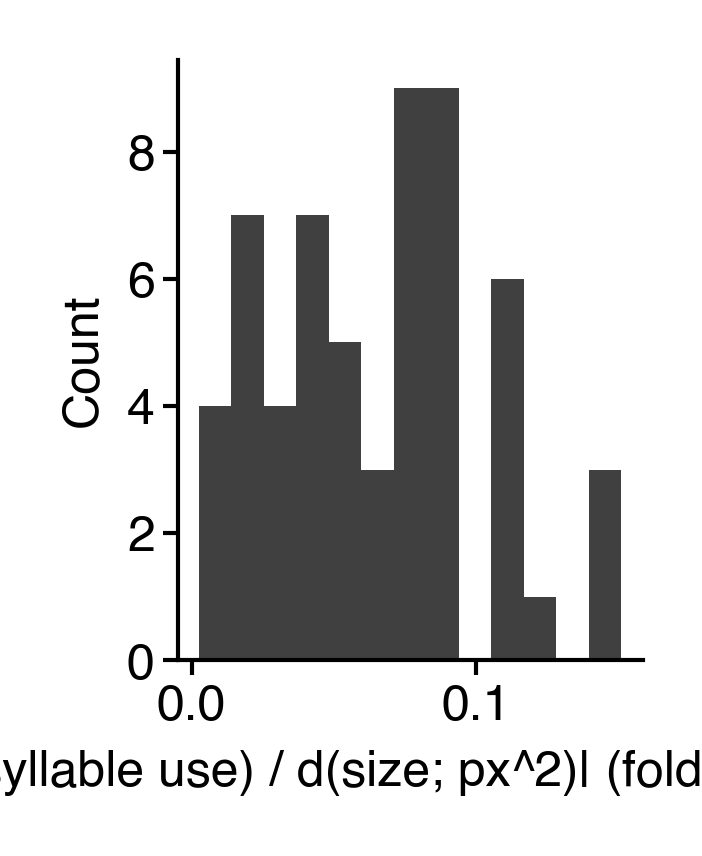

In [89]:
# size plot - histogram of slopes across syllables
fig = figure(1, 1.3)

ax = sns.histplot(size_effect, bins=13, element='step', fill=True, linewidth=0, color="k")
ax.set(xlabel="|d(syllable use) / d(size; px^2)| (fold-change)")
sns.despine()
saver(fig, "size-deriv-histogram");

### Age

In [90]:
splines = mdl_params['bio_basis_weights'] @ mdl_components.bases['bio']

bio_deriv = np.diff(splines, axis=1)

true_age = mdl_components.age_unnormalizer(mdl_components.age_samples)
age_diff = np.diff(true_age)

bio_deriv_norm = bio_deriv / age_diff[None]

In [91]:
deriv_df = pd.DataFrame(bio_deriv_norm.T, columns=pd.Index(df.columns, name="syllable"), index=pd.Index(true_age[:-1], name="age")).abs()
melt_deriv_df = deriv_df.reset_index().melt(id_vars='age').query('age < 100 & age > 4')

/tmp/ipykernel_62888/4138081134.py:2: UserWarning: 
The palette list has fewer values (1) than needed (58) and will cycle, which may produce an uninterpretable plot.
  ax = sns.lineplot(


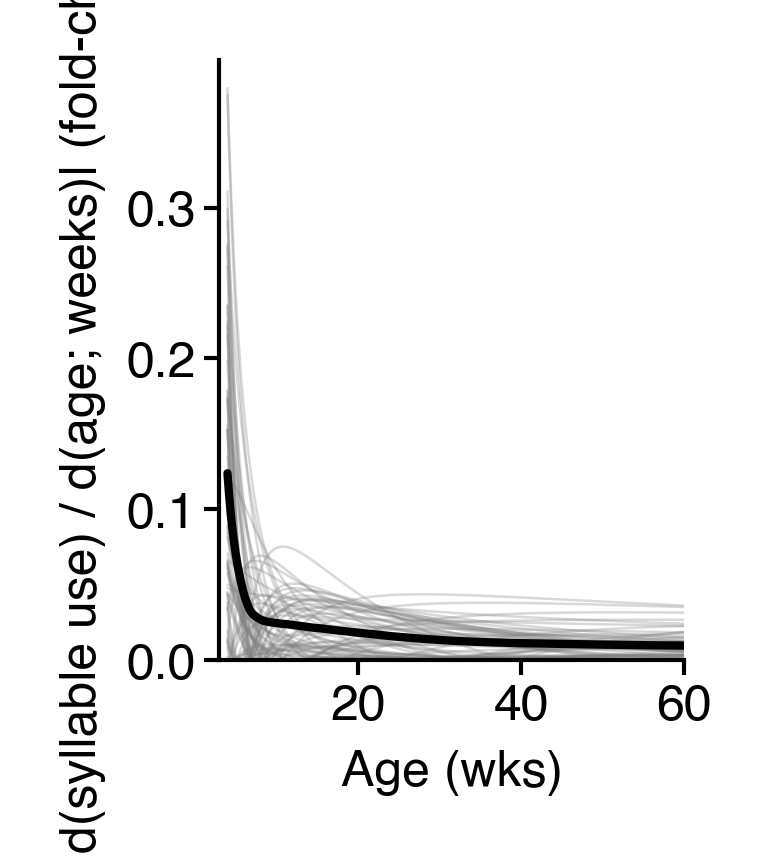

In [92]:
fig = figure(1, 1.3)
ax = sns.lineplot(
    data=melt_deriv_df,
    x="age",
    y="value",
    hue="syllable",
    errorbar=None,
    err_kws=dict(lw=0),
    palette=["gray"],
    legend=False,
    linewidth=0.3,
    alpha=0.3,
)
ax = sns.lineplot(
    data=melt_deriv_df,
    x="age",
    y="value",
    errorbar=None,
    err_kws=dict(lw=0),
    color='k',
    legend=False,
    linewidth=1,
    alpha=1,
    ax=ax
)
ax.set(
    xlabel="Age (wks)",
    ylabel="|d(syllable use) / d(age; weeks)| (fold-change)",
    xlim=(3, 60),
    ylim=(0, None),
)
sns.despine()
saver(fig, "age-deriv-lineplot");

### Sex

In [93]:
sex_bias = np.array(raise_dim(mdl_params['sex_biases'], axis=1))
sex_bias_effect = np.mean(np.abs(sex_bias), axis=1).squeeze()
sex_bias_effect_w_scaling = (sex_bias_scale * sex_bias_effect[:, None])

In [94]:
sex_deriv_df = pd.DataFrame(
    sex_bias_effect_w_scaling.T,
    columns=pd.Index(df.columns, name="syllable"),
    index=pd.Index(true_age, name="age"),
).abs()
melt_sex_deriv_df = (
    sex_deriv_df.reset_index().melt(id_vars="age").query("age < 60 & age > 4")
)

/tmp/ipykernel_62888/1444347103.py:2: UserWarning: 
The palette list has fewer values (1) than needed (58) and will cycle, which may produce an uninterpretable plot.
  ax = sns.lineplot(


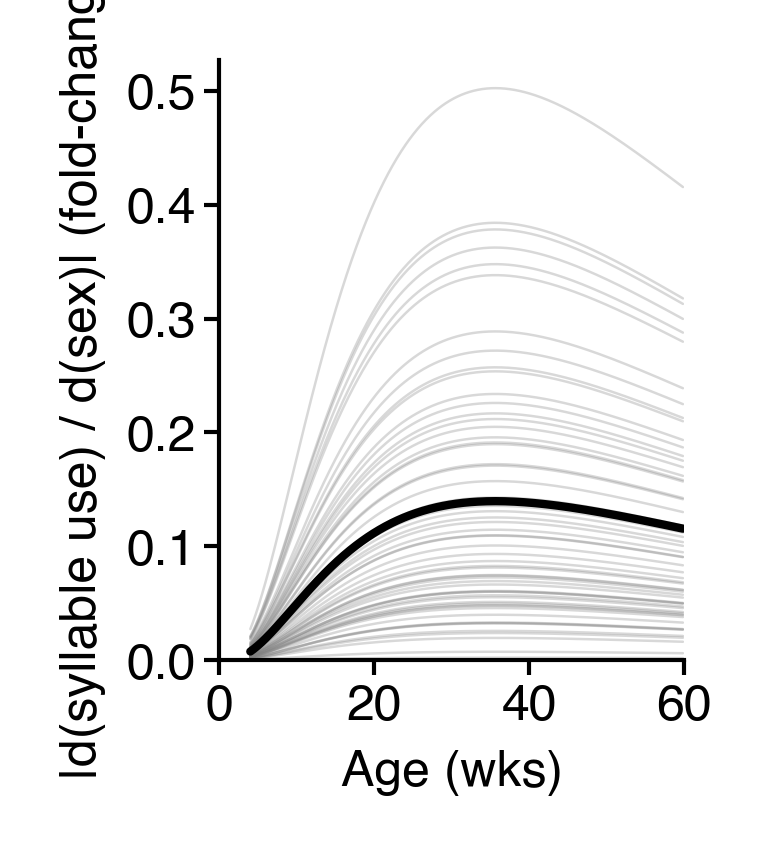

In [95]:
fig = figure(1, 1.3)
ax = sns.lineplot(
    data=melt_sex_deriv_df,
    x="age",
    y="value",
    hue="syllable",
    errorbar=None,
    err_kws=dict(lw=0),
    palette=["gray"],
    legend=False,
    linewidth=0.3,
    alpha=0.3,
)
ax = sns.lineplot(
    data=melt_sex_deriv_df,
    x="age",
    y="value",
    errorbar=None,
    err_kws=dict(lw=0),
    color='k',
    legend=False,
    linewidth=1,
    alpha=1,
    ax=ax,
)
ax.set(
    xlabel="Age (wks)",
    ylabel="|d(syllable use) / d(sex)| (fold-change)",
    xlim=(0, 60),
    ylim=(0, None),
)
sns.despine()
saver(fig, "sex-deriv-lineplot");

### Individuality

In [96]:
from scipy.spatial.distance import pdist

In [97]:
indiv_bias = np.concatenate([raise_dim(x, axis=1) for x in mdl_params['individual_biases']], axis=1)
# indiv_bias_effect = np.array([np.mean(pdist(indiv_bias[[i]].T)) for i in range(len(indiv_bias))])
indiv_bias_effect = np.mean(np.abs(indiv_bias), axis=1)
indiv_bias_effect_w_scaling = (indiv_bias_scale * indiv_bias_effect[:, None])

In [98]:
indiv_deriv_df = pd.DataFrame(
    indiv_bias_effect_w_scaling.T,
    columns=pd.Index(df.columns, name="syllable"),
    index=pd.Index(true_age, name="age"),
).abs()
melt_indiv_deriv_df = (
    indiv_deriv_df.reset_index().melt(id_vars="age").query("age < 60 & age > 4")
)

/tmp/ipykernel_62888/2559324216.py:2: UserWarning: 
The palette list has fewer values (1) than needed (58) and will cycle, which may produce an uninterpretable plot.
  ax = sns.lineplot(


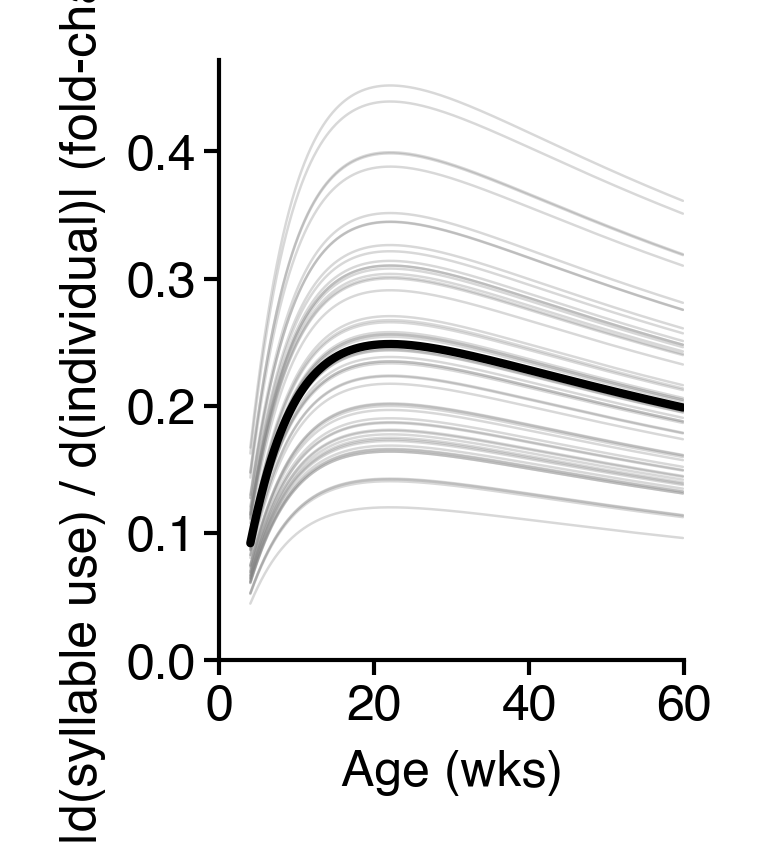

In [99]:
fig = figure(1, 1.3)
ax = sns.lineplot(
    data=melt_indiv_deriv_df,
    x="age",
    y="value",
    hue="syllable",
    errorbar=None,
    err_kws=dict(lw=0),
    palette=["gray"],
    legend=False,
    linewidth=0.3,
    alpha=0.3,
)
ax = sns.lineplot(
    data=melt_indiv_deriv_df,
    x="age",
    y="value",
    errorbar=None,
    err_kws=dict(lw=0),
    color='k',
    legend=False,
    linewidth=1,
    alpha=1,
    ax=ax,
)
ax.set(
    xlabel="Age (wks)",
    ylabel="|d(syllable use) / d(individual)| (fold-change)",
    xlim=(0, 60),
    ylim=(0, None),
)
sns.despine()
saver(fig, "indiv-deriv-lineplot");

### Rank-order each syllable + effect

In [100]:
sex_rank = np.argsort(np.argsort(sex_deriv_df.mean().values))
indiv_rank = np.argsort(np.argsort(indiv_deriv_df.mean().values))
size_rank = np.argsort(np.argsort(size_effect))
age_rank = np.argsort(np.argsort(deriv_df.mean().values))

In [101]:
rank_df = pd.DataFrame(dict(sex=sex_rank, size=size_rank, age=age_rank, individuality=indiv_rank), index=pd.Index(range(len(sex_rank)), name="syll_idx"))

In [102]:
melt_rank_df = rank_df.reset_index().melt(id_vars='syll_idx')

In [103]:
age_rank_map = rank_df['age']

In [104]:
melt_rank_df['age_rank_map'] = melt_rank_df['syll_idx'].map(age_rank_map)

/tmp/ipykernel_62888/4127790683.py:3: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set(ylabel="Syllable rank", xlabel="Factor", xticklabels=["Age", "Sex", "Size", "Individuality"])


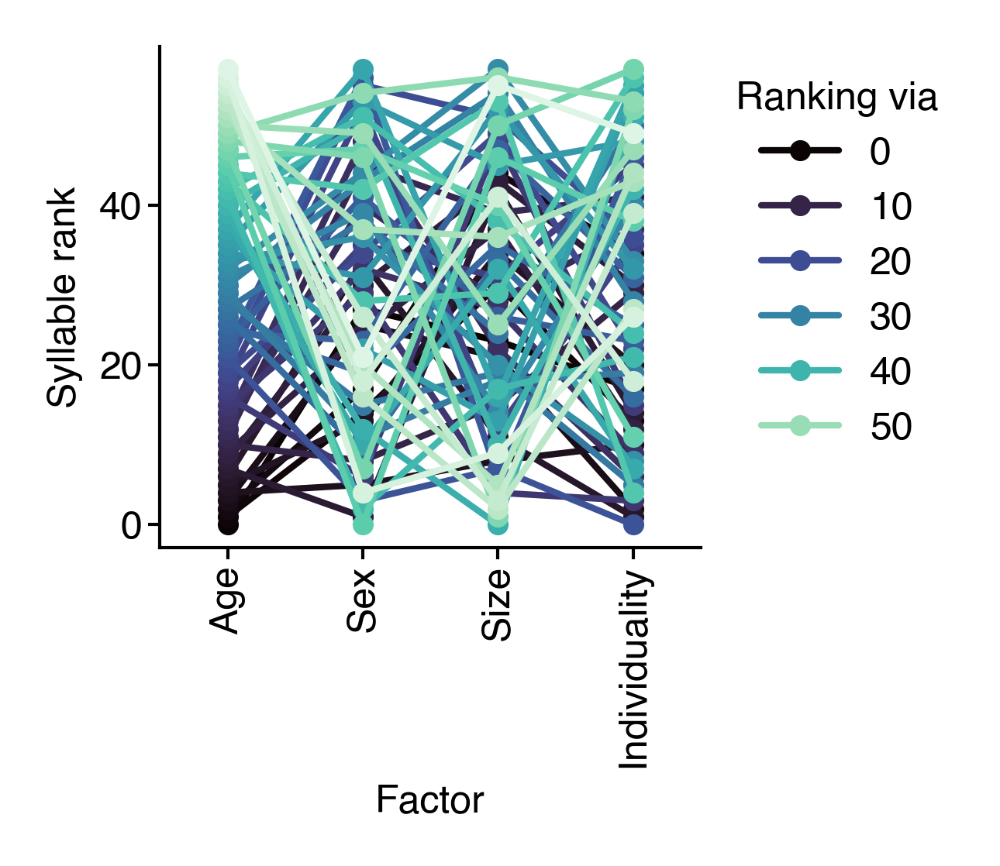

In [105]:
fig = figure(1.5, 1.4)
ax = sns.pointplot(data=melt_rank_df, x='variable', y='value', hue='age_rank_map', order=['age', 'sex', 'size', 'individuality'], palette='mako', linewidth=1)
ax.set(ylabel="Syllable rank", xlabel="Factor", xticklabels=["Age", "Sex", "Size", "Individuality"])
legend(ax, title="Ranking via")
ax.tick_params(axis='x', rotation=90)
sns.despine()
saver(fig, "bambi-factor-syllable-derivative-ranking");

## Relative contributions

In [106]:
conc_c = mdl['concentration_components']

In [107]:
list(conc_c)

['bio', 'size', 'indiv', 'indiv_scale', 'sex', 'sex_scale']

In [108]:
spline_weights = mdl['params']['bio_basis_weights']

In [109]:
spline_weights.shape

(58, 4)

In [110]:
spline_avgs = spline_weights.mean(1)

In [111]:
bio_comp = conc_c['bio'].copy()
bio_comp = bio_comp - spline_avgs[:, None]

In [112]:
indiv_components = conc_c['indiv'] * conc_c['indiv_scale'][None, :, None]

In [113]:
indiv_components.shape

(58, 1000, 1816)

In [114]:
sex_components = conc_c['sex'] * conc_c['sex_scale'][None, :, None]

In [115]:
sex_components.shape

(58, 1000, 1816)

In [116]:
total = (
    np.abs(bio_comp[..., None])
    + np.abs(indiv_components)
    + np.abs(sex_components)
    + np.abs(conc_c["size"][:, None, :])
)


In [117]:
total.shape

(58, 1000, 1816)

In [118]:
inds = np.argmax(mdl['age_likelihoods'], axis=1)

In [119]:
inds.shape

(1816,)

In [120]:
bio = np.abs(bio_comp[..., None]) / total
indiv = np.abs(indiv_components) / total
sx = np.abs(sex_components) / total
size = np.abs(conc_c['size'][:, None, :]) / total

In [121]:
inds = np.argmax(mdl['age_likelihoods'], axis=1)

In [122]:
bio = bio[:, inds, np.arange(len(inds))]
indiv = indiv[:, inds, np.arange(len(inds))]
size = size[:, inds, np.arange(len(inds))]
sx = sx[:, inds, np.arange(len(inds))]

In [123]:
bio_df = pd.DataFrame(bio.T, index=df.index).reset_index()

In [124]:
bio_df.head()

,mouse,subject_name,session_name,uuid,date,week,age,sex,0,1,...,48,49,50,51,52,53,54,55,56,57
0,M1_01,M1_01_01,longV2_M_01,2cf633c3-9a34-4cfe-ad07-9c0bce1b4b54,2023-07-03 15:16:10,0,3.5,0,0.182601,0.726549,...,0.654283,0.843925,0.325155,0.796132,0.661284,0.902443,0.589895,0.230799,0.865403,0.829515
1,M1_01,M1_01_06,longv2_M_06,5d156098-ceea-4ed4-9e64-4dadea456285,2023-07-10 16:37:55,1,4.5,0,0.777844,0.480029,...,0.495095,0.861816,0.352290,0.161066,0.563329,0.819703,0.753381,0.241488,0.873423,0.316500
2,M1_01,M1_01_11,longv2_M_11,b919dd33-04db-4e67-9f89-7c9529083494,2023-07-17 16:29:52,2,5.5,0,0.896545,0.551222,...,0.254883,0.825305,0.591255,0.494541,0.426740,0.704504,0.799999,0.236579,0.630673,0.651213
3,M1_01,M1_01_16,longv2_M_16,9e0f3c05-fcea-4993-8344-ac97f1c4c3b7,2023-07-24 16:02:18,3,6.5,0,0.408863,0.450674,...,0.154265,0.548788,0.448765,0.469469,0.019816,0.160549,0.492784,0.027994,0.736450,0.591447
4,M1_01,M1_01_29,longv2_M_29,7ea00007-7498-40f8-8dd6-32f5290d3c91,2023-07-31 08:43:52,4,7.5,0,0.537428,0.472920,...,0.165225,0.592792,0.501222,0.492510,0.009824,0.219773,0.567553,0.054609,0.799944,0.621612


In [125]:
drop_cols = ['subject_name', 'session_name', 'uuid', 'date', 'week']

bio_df = pd.DataFrame(bio.T, index=df.index).reset_index()
bio_df["bio_age"] = mdl["bio_ages"]
bio_df = bio_df.drop(columns=drop_cols).melt(
    id_vars=["mouse", "age", "bio_age", "sex"], var_name="syllable", value_name="influence"
)
bio_df["type"] = "Beh. age"

size_df = pd.DataFrame(size.T, index=df.index).reset_index()
size_df["bio_age"] = mdl["bio_ages"]
size_df = size_df.drop(columns=drop_cols).melt(
    id_vars=["mouse", "age", "bio_age", "sex"], var_name="syllable", value_name="influence"
)
size_df["type"] = "Size"

indiv_df = pd.DataFrame(indiv.T, index=df.index).reset_index()
indiv_df["bio_age"] = mdl["bio_ages"]
indiv_df = indiv_df.drop(columns=drop_cols).melt(
    id_vars=["mouse", "age", "bio_age", "sex"], var_name="syllable", value_name="influence"
)
indiv_df["type"] = "Individuality"

sex_df = pd.DataFrame(sx.T, index=df.index).reset_index()
sex_df["bio_age"] = mdl["bio_ages"]
sex_df = sex_df.drop(columns=drop_cols).melt(
    id_vars=["mouse", "age", "bio_age", "sex"], var_name="syllable", value_name="influence"
)
sex_df["type"] = "Sex"

In [126]:
plt_dfs = pd.concat([bio_df, size_df, sex_df, indiv_df])
plt_dfs['bio_bin'] = pd.cut(plt_dfs['bio_age'], 25)
plt_dfs['bio_bin'] = plt_dfs['bio_bin'].map(lambda x: x.mid)
plt_dfs['age_bin'] = pd.cut(plt_dfs['age'], 25)
plt_dfs['age_bin'] = plt_dfs['age_bin'].map(lambda x: x.mid)

In [127]:
plt_dfs.head()

,mouse,age,bio_age,sex,syllable,influence,type,bio_bin,age_bin
0,M1_01,3.5,2.101852,0,0,0.182601,Beh. age,3.2655,4.3365
1,M1_01,4.5,3.355365,0,0,0.777844,Beh. age,3.2655,4.3365
2,M1_01,5.5,4.265845,0,0,0.896545,Beh. age,3.2655,6.2225
3,M1_01,6.5,7.937006,0,0,0.408863,Beh. age,8.4905,6.2225
4,M1_01,7.5,7.367132,0,0,0.537428,Beh. age,8.4905,8.0855


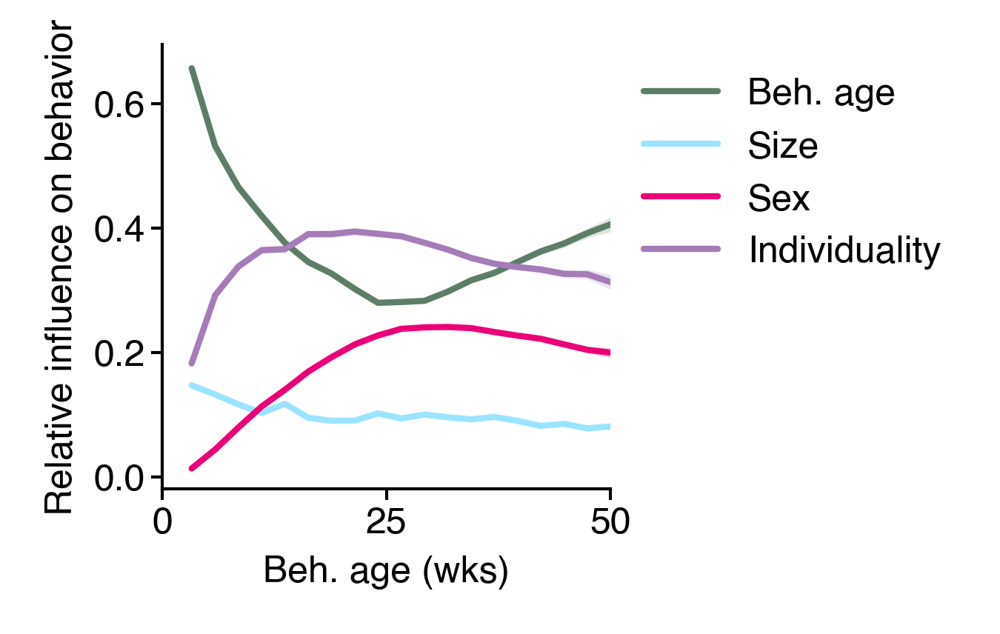

In [128]:
fig = figure(1.3, 1.3)
ax = sns.lineplot(
    data=plt_dfs.query('bio_age < 50'),
    x="bio_bin",
    y="influence",
    errorbar=("se", 2),
    hue="type",
    palette=cc.glasbey[24:28],
    err_kws=dict(lw=0),
)
ax.set(
    xlabel="Beh. age (wks)",
    ylabel="Relative influence on behavior",
    # ylim=(0, 0.8),
    xlim=(0, 50),
    xticks=[0, 25, 50],
)
legend()
sns.despine()
saver(fig, "each-factor-influence-on-behavior");

/tmp/ipykernel_62888/1333678375.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  data=plt_dfs.query('bio_age < 50').groupby(['mouse', 'age', 'bio_bin', 'type'])['influence'].mean().reset_index(),


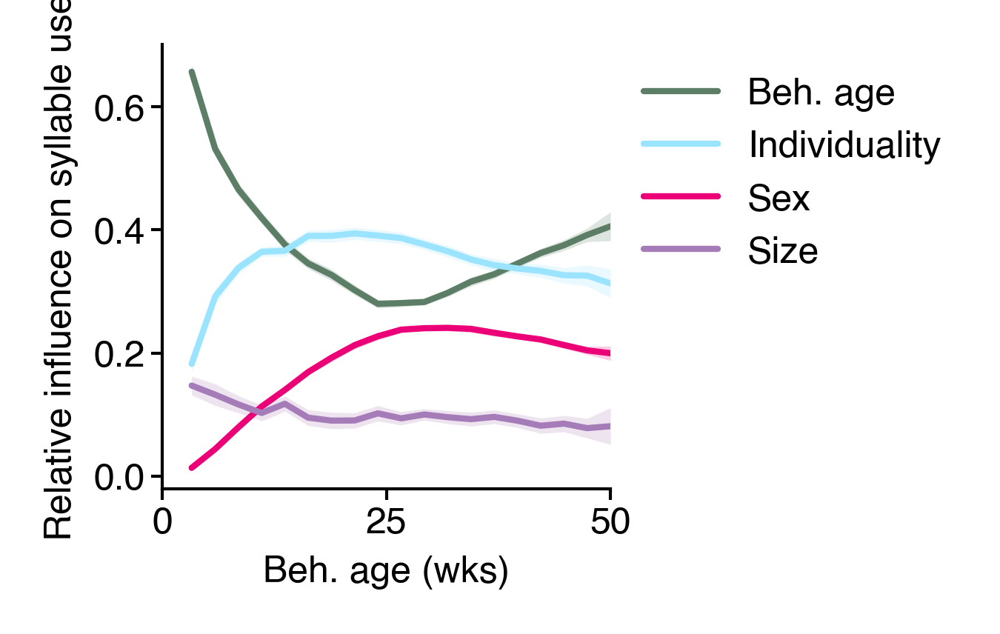

In [129]:
fig = figure(1.3, 1.3)
ax = sns.lineplot(
    data=plt_dfs.query('bio_age < 50').groupby(['mouse', 'age', 'bio_bin', 'type'])['influence'].mean().reset_index(),
    x="bio_bin",
    y="influence",
    errorbar=("se", 2),
    hue="type",
    palette=cc.glasbey[24:28],
    err_kws=dict(lw=0),
)
ax.set(
    xlabel="Beh. age (wks)",
    ylabel="Relative influence on syllable use",
    # ylim=(0, 0.8),
    xlim=(0, 50),
    xticks=[0, 25, 50],
)
legend()
sns.despine()
saver(fig, "each-factor-influence-on-behavior-v2");

In [112]:
x = pd.pivot_table(
    plt_dfs.groupby(["syllable", "type"])["influence"].mean().reset_index(),
    index="syllable",
    columns="type",
    values="influence",
)
remapping = dict(
    map(reversed, enumerate(x.sort_values(by="Beh. age", ascending=False).index))
)

In [113]:
plt_dfs['sorted_syllable'] = plt_dfs['syllable'].map(remapping)

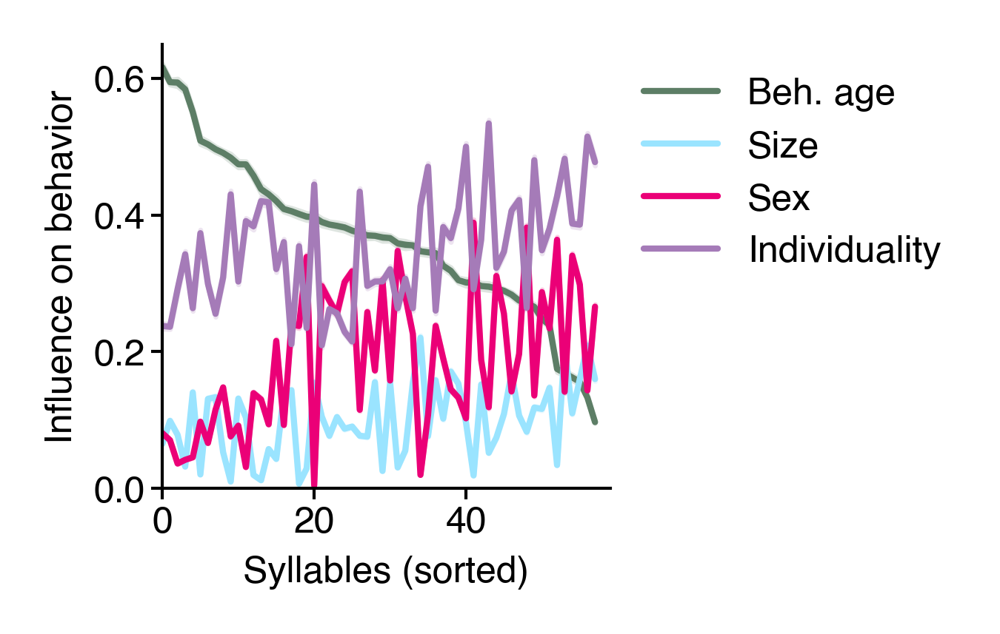

In [114]:
fig = figure(1.3, 1.3)
ax = sns.lineplot(data=plt_dfs, x='sorted_syllable', y='influence', errorbar='se', hue='type', palette=cc.glasbey[24:28])
ax.set(xlabel="Syllables (sorted)", ylabel="Influence on behavior", ylim=(0, 0.65), xlim=(0, 59))
legend()
sns.despine()
saver(fig, 'sex-syllables-component-influence-on-behavior-sorted');

In [115]:
rank_df2 = x.rank()

## Make plots showing high-influence syllables are better predicting than low-influence syllables

In [116]:
from sklearn.svm import SVC, SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression, ElasticNet
from sklearn.cross_decomposition import PLSRegression
from sklearn.model_selection import cross_val_predict, KFold
from sklearn.metrics import accuracy_score, r2_score

In [117]:
clf_data = df.reset_index().assign(bio_age=mdl['bio_ages'])

In [118]:
melt_rank_df = rank_df.reset_index().melt(id_vars='syll_idx')

In [119]:
syll_factors = rank_df.idxmax(1)
# syll_factors = rank_df2.idxmax(1)

grp_ranks = {}
for grp, ser in syll_factors.groupby(syll_factors):
    grp_ranks[grp] = rank_df.loc[ser.index, grp].sort_values(ascending=False)
    # grp_ranks[grp] = rank_df2.loc[ser.index, grp].sort_values(ascending=False)

In [120]:
valmap(len, grp_ranks)

{'age': 13, 'individuality': 10, 'sex': 18, 'size': 17}

In [121]:
top_n = 10
filt_sylls = {k: v.index[:top_n] for k, v in grp_ranks.items()}

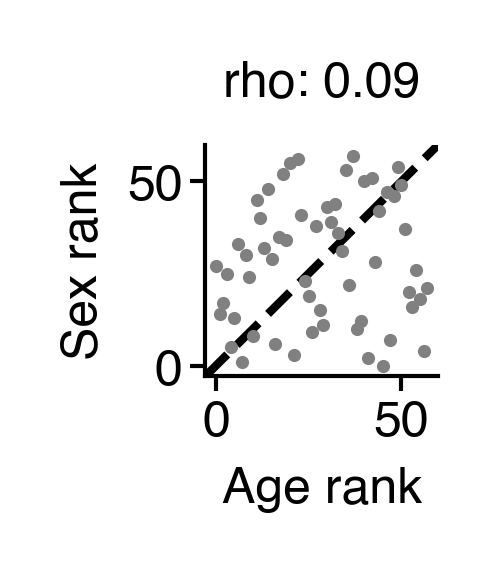

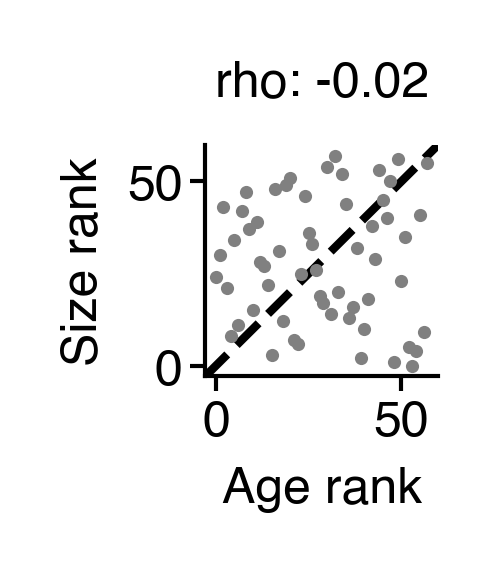

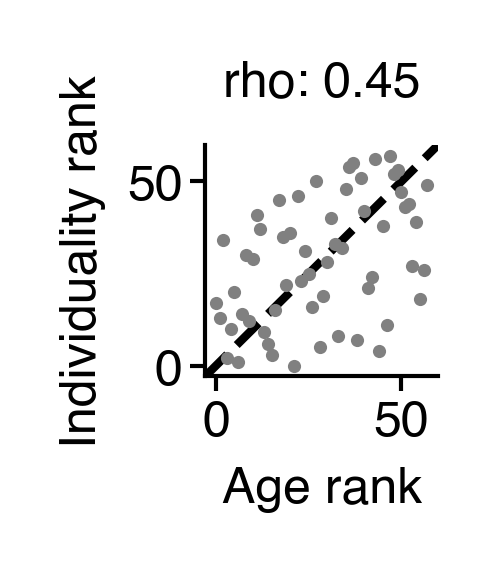

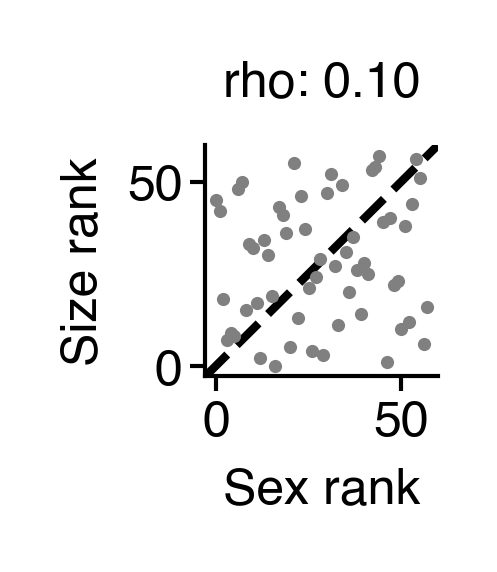

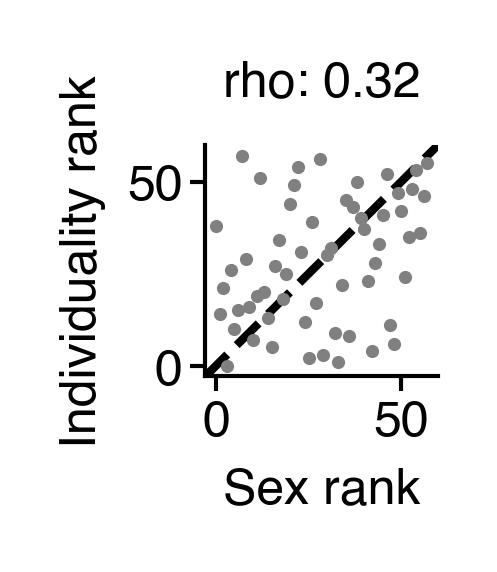

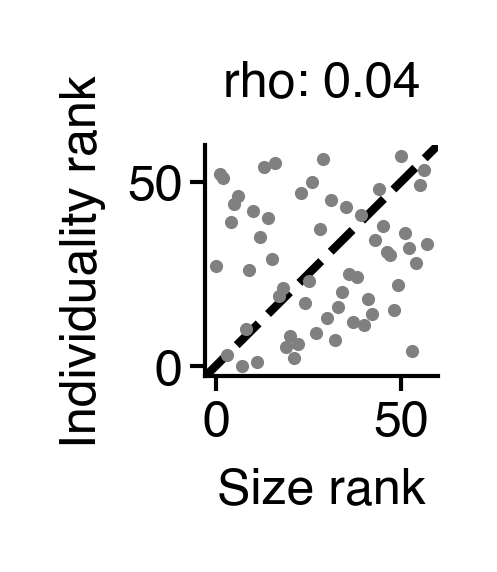

In [122]:
colors = dict(zip(['age', 'sex', 'size', 'individuality'], cc.glasbey[2:]))

for t1, t2 in combinations(['age', 'sex', 'size', 'individuality'], 2):
    fig = figure(0.5, 0.5)
    ax = fig.gca()
    c = rank_df[t1].corr(rank_df[t2], method='spearman')
    ax.scatter(rank_df[t1], rank_df[t2], s=2.5, linewidth=0, color='gray')
    # for _factor, _color in colors.items():
    #     ax.scatter(rank_df.loc[filt_sylls[_factor], t1], rank_df.loc[filt_sylls[_factor], t2], s=5, linewidth=0, color=colors[_factor], label=_factor.capitalize())
    add_identity(ax, ls='--', color='k', zorder=-1)
    # legend(ax)
    ax.set(xlabel=f"{t1.capitalize()} rank", ylabel=f"{t2.capitalize()} rank", title=f"rho: {c:0.2f}")
    sns.despine()

    saver(fig, f"{t1}-{t2}-rank-comparison");

In [123]:
pipe = make_pipeline(
    StandardScaler(),
    PLSRegression(n_components=5),
)

/home/wg41/miniconda3/envs/aging-gpu/lib/python3.10/site-packages/joblib/externals/loky/backend/fork_exec.py:38: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  pid = os.fork()


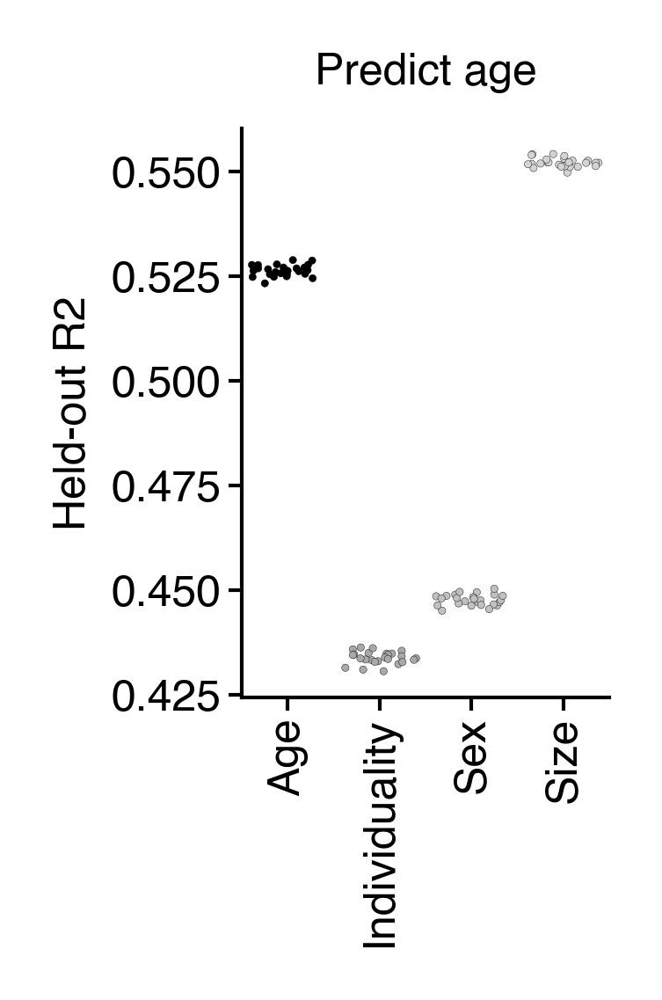

In [124]:
n_repeats = 25
x = []

for rank_grp, _df in filt_sylls.items():
    _values = rank_df[rank_grp].sort_values(ascending=False).index[:top_n].values
    # _values = rank_df2[rank_grp].sort_values(ascending=False).index[:top_n].values
    for i in range(n_repeats):
        preds = cross_val_predict(
            pipe,
            np.array(syllable_counts_jax[:, _values]),
            # np.array(syllable_counts_jax[:, _df.values]),
            clf_data["age"],
            cv=KFold(n_splits=5, shuffle=True, random_state=i),
            n_jobs=-1,
        )
        x.append(
            {"r2": r2_score(clf_data["age"], preds), "type": rank_grp.capitalize()}
        )
x = pd.DataFrame(x)

fig = figure(0.9, 1.4)
ax = sns.stripplot(
    data=x,
    x="type",
    y="r2",
    hue="type",
    palette=["k", "darkgray", "silver", "lightgray"],
    size=1,
    linewidth=0.05,
    jitter=0.4,
)
plt.xticks(rotation=90)
ax.set(ylabel="Held-out R2", xlabel="", title="Predict age")
sns.despine()
# saver(fig, "predict-age-from-syllables", tight_layout=True);

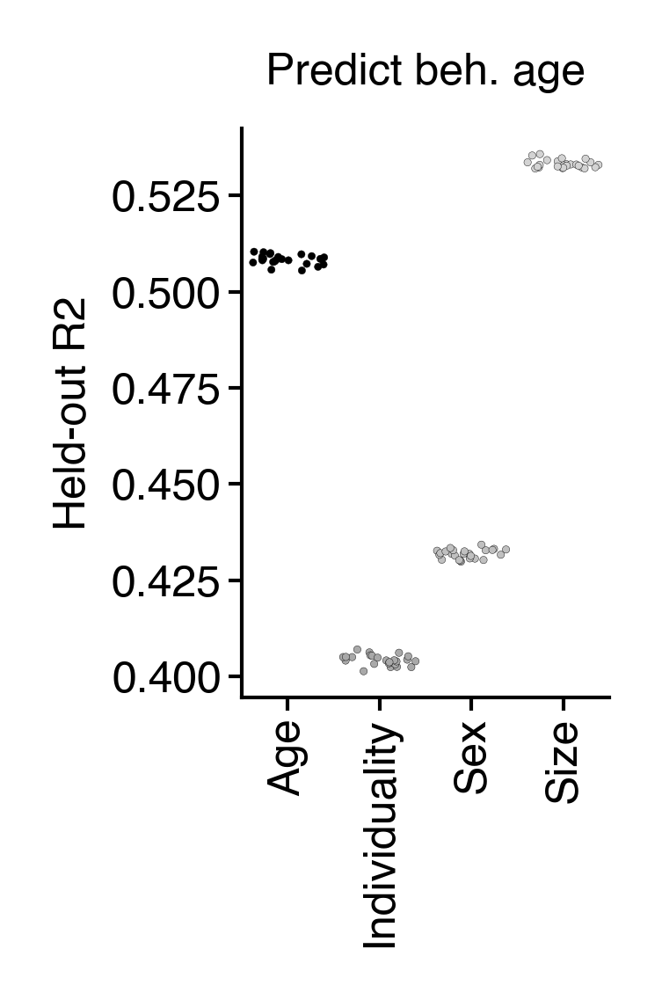

In [125]:
n_repeats = 25
x = []

for rank_grp, _df in filt_sylls.items():
    _values = rank_df[rank_grp].sort_values(ascending=False).index[:top_n].values
    # _values = rank_df2[rank_grp].sort_values(ascending=False).index[:top_n].values
    for i in range(n_repeats):
        preds = cross_val_predict(
            pipe,
            np.array(syllable_counts_jax[:, _values]),
            # np.array(syllable_counts_jax[:, _df.values]),
            clf_data["bio_age"],
            cv=KFold(n_splits=5, shuffle=True, random_state=i),
            n_jobs=-1,
        )
        x.append(
            {"r2": r2_score(clf_data["age"], preds), "type": rank_grp.capitalize()}
        )
x = pd.DataFrame(x)


fig = figure(0.9, 1.4)
ax = sns.stripplot(
    data=x,
    x="type",
    y="r2",
    hue="type",
    palette=["k", "darkgray", "silver", "lightgray"],
    size=1,
    linewidth=0.05,
    jitter=0.4,
)
plt.xticks(rotation=90)
ax.set(ylabel="Held-out R2", xlabel="", title="Predict beh. age")
sns.despine()
# saver(fig, "predict-beh-age-from-syllables", tight_layout=True);

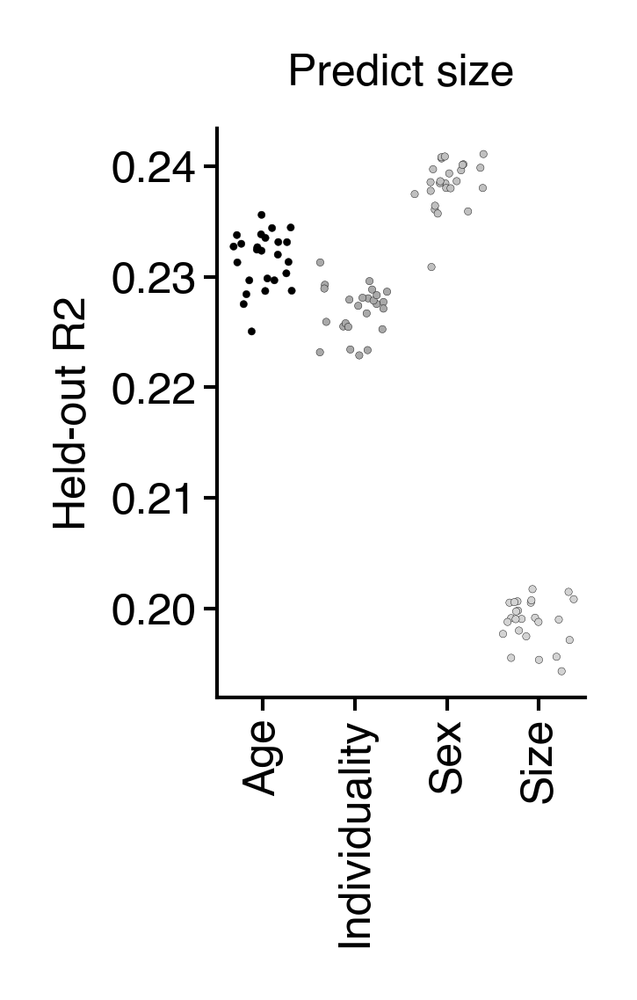

In [126]:
n_repeats = 25
x = []

y = np.array(features['sizes'])

for rank_grp, _df in filt_sylls.items():
    _values = rank_df[rank_grp].sort_values(ascending=False).index[:top_n].values
    # _values = rank_df2[rank_grp].sort_values(ascending=False).index[:top_n].values
    for i in range(n_repeats):
        preds = cross_val_predict(
            pipe,
            np.array(syllable_counts_jax[:, _values]),
            # np.array(syllable_counts_jax[:, _df.values]),
            y,
            cv=KFold(n_splits=5, shuffle=True, random_state=i),
            n_jobs=-1,
        )
        x.append(
            {"r2": r2_score(y, preds), "type": rank_grp.capitalize()}
        )
x = pd.DataFrame(x)


fig = figure(0.9, 1.4)
ax = sns.stripplot(
    data=x,
    x="type",
    y="r2",
    hue="type",
    palette=["k", "darkgray", "silver", "lightgray"],
    size=1,
    linewidth=0.05,
    jitter=0.4,
)
plt.xticks(rotation=90)
ax.set(ylabel="Held-out R2", xlabel="", title="Predict size")
sns.despine()
# saver(fig, "predict-size-from-syllables", tight_layout=True);

In [127]:
clf_pipe = make_pipeline(
    StandardScaler(),
    SVC(kernel='linear', class_weight='balanced'),
)

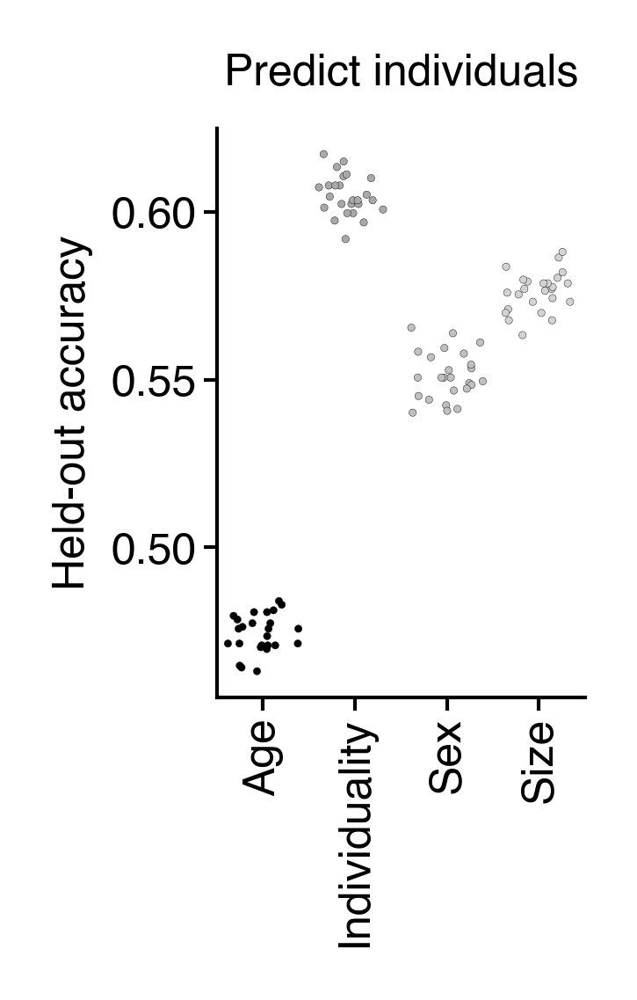

In [128]:
n_repeats = 25
x = []

y = np.argmax(features['mice'], axis=0)

for rank_grp, _df in filt_sylls.items():
    _values = rank_df[rank_grp].sort_values(ascending=False).index[:top_n].values
    # _values = rank_df2[rank_grp].sort_values(ascending=False).index[:top_n].values
    for i in range(n_repeats):
        preds = cross_val_predict(
            clf_pipe,
            np.array(syllable_counts_jax[:, _values]),
            # np.array(syllable_counts_jax[:, _df.values]),
            y,
            cv=KFold(n_splits=5, shuffle=True, random_state=i),
            n_jobs=-1,
        )
        x.append(
            {"acc": accuracy_score(y, preds), "type": rank_grp.capitalize()}
        )
x = pd.DataFrame(x)


fig = figure(0.9, 1.4)
ax = sns.stripplot(
    data=x,
    x="type",
    y="acc",
    hue="type",
    palette=["k", "darkgray", "silver", "lightgray"],
    size=1,
    linewidth=0.05,
    jitter=0.4,
)
plt.xticks(rotation=90)
ax.set(ylabel="Held-out accuracy", xlabel="", title="Predict individuals")
sns.despine()
# saver(fig, "predict-indiv-from-syllables", tight_layout=True);

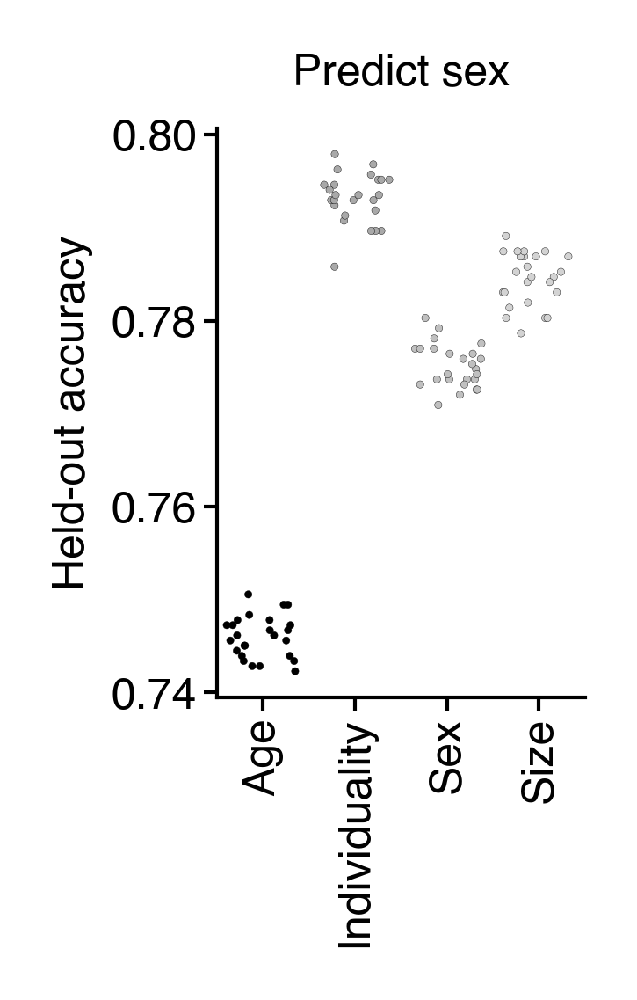

In [129]:
n_repeats = 25
x = []

y = np.argmax(features['sex'], axis=0)

for rank_grp, _df in filt_sylls.items():
    _values = rank_df[rank_grp].sort_values(ascending=False).index[:top_n].values
    # _values = rank_df2[rank_grp].sort_values(ascending=False).index[:top_n].values
    for i in range(n_repeats):
        preds = cross_val_predict(
            clf_pipe,
            np.array(syllable_counts_jax[:, _values]),
            # np.array(syllable_counts_jax[:, _df.values]),
            y,
            cv=KFold(n_splits=5, shuffle=True, random_state=i),
            n_jobs=-1,
        )
        x.append(
            {"acc": accuracy_score(y, preds), "type": rank_grp.capitalize()}
        )
x = pd.DataFrame(x)


fig = figure(0.9, 1.4)
ax = sns.stripplot(
    data=x,
    x="type",
    y="acc",
    hue="type",
    palette=["k", "darkgray", "silver", "lightgray"],
    size=1,
    linewidth=0.05,
    jitter=0.4,
)
plt.xticks(rotation=90)
ax.set(ylabel="Held-out accuracy", xlabel="", title="Predict sex")
sns.despine()
# saver(fig, "predict-sex-from-syllables", tight_layout=True);

## Example mouse syllable counts and predictions

In [130]:
lenc = LabelEncoder()
labels = lenc.fit_transform(df.index.get_level_values("mouse").to_numpy())

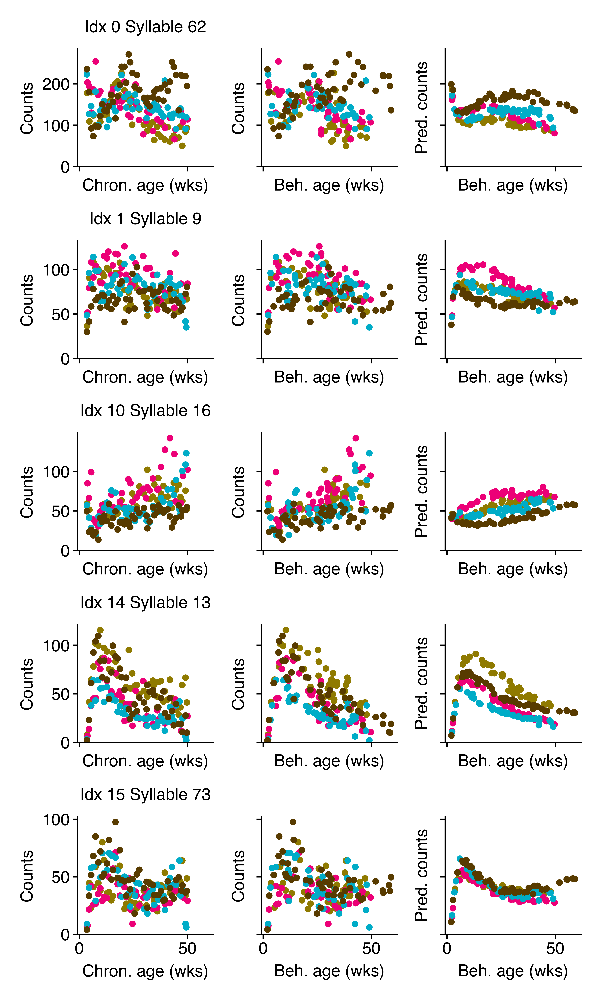

In [131]:
# example_mice = [11, 7, 0, 10]
example_mice = [3, 8, 21, 26]

mask = []
for m in example_mice:
    mask.append(labels == m)
mask = reduce(or_, mask)

sylls = [0, 1, 10, 14, 15]
fig, ax = plt.subplots(len(sylls), 3, figsize=(3, len(sylls)), sharex=True, dpi=900)

true_age = mdl["true_ages"][mask]
bio_age = mdl["bio_ages"][mask]
counts = mdl["counts"][mask]
pred_counts = mdl["predicted_counts"][mask]

for a, syll, i in zip(ax, map(lambda i: int(sort_idx[i]), sylls), sylls):
    max_counts = max([counts[:, syll].max(), pred_counts[:, syll].max()]) * 1.05
    a[0].scatter(true_age, counts[:, syll], s=2.5, c=labels[mask], cmap=cc.cm.glasbey, vmax=256, vmin=0, rasterized=True)
    a[0].set(title=f"Idx {i} Syllable {df.columns[syll]}", ylabel="Counts", xlabel="Chron. age (wks)", ylim=(0, max_counts))

    a[2].scatter(bio_age, pred_counts[:, syll], s=2.5, c=labels[mask], cmap=cc.cm.glasbey, vmax=256, vmin=0, rasterized=True)
    a[2].set(ylabel="Pred. counts", xlabel="Beh. age (wks)", ylim=(0, max_counts), yticklabels=[])

    a[1].scatter(bio_age, counts[:, syll], s=2.5, c=labels[mask], cmap=cc.cm.glasbey, vmax=256, vmin=0, rasterized=True)
    a[1].set(ylabel="Counts", xlabel="Beh. age (wks)", ylim=(0, max_counts), yticklabels=[])

sns.despine()
fig.tight_layout()
saver(fig, "longtogeny-true-vs-predicted-counts");

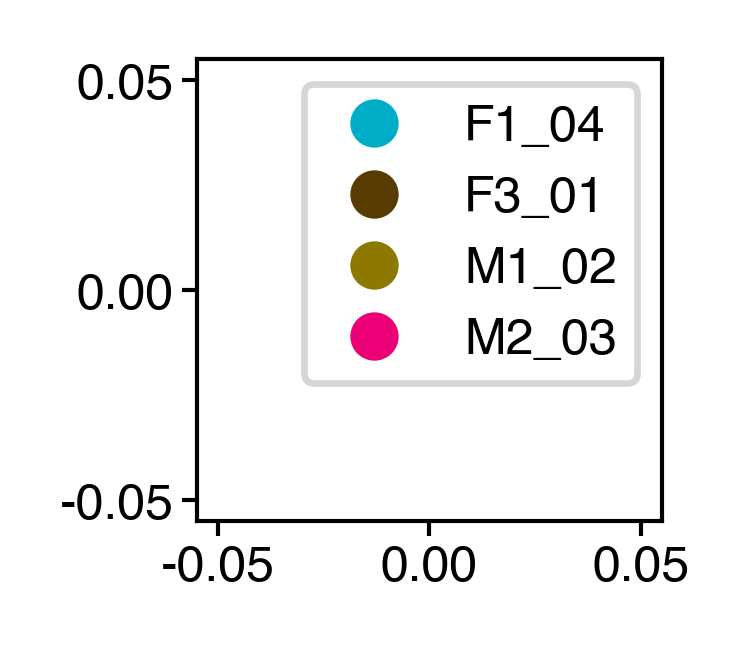

In [132]:
fig = figure(1, 1)
for idx in example_mice:
    plt.plot([], [], 'o', color=cc.glasbey[idx], label=lenc.classes_[idx])
plt.legend()
saver(fig, 'indiv-legend');

## Fit a strong-prior model

Beh. age should == chron age

In [133]:
hyp_copy = deepcopy(hypparams)
hyp_copy['age_sd'] = 1e-3
mdl = fit_model(features, hyp_copy, 6)

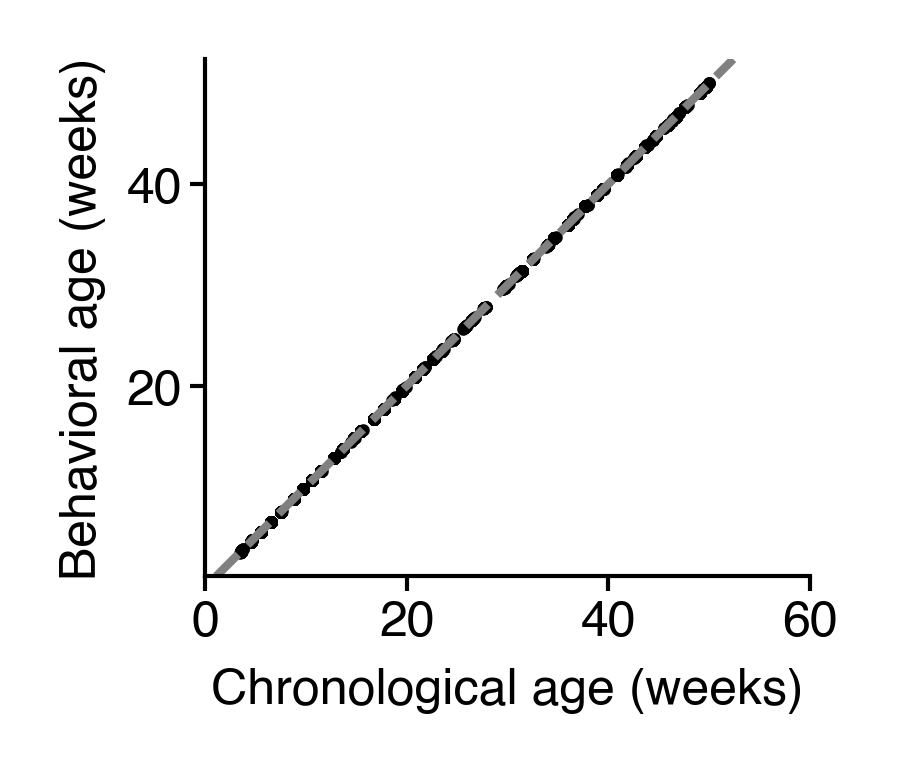

In [134]:
fig = figure(1.3, 1.3)
ax = fig.gca()
ax.scatter(mdl["true_ages"], mdl["bio_ages"], color="k", s=0.5)
ax.set(
    xlabel="Chronological age (weeks)",
    ylabel="Behavioral age (weeks)",
    aspect="equal",
    xlim=(0, 60),
)
add_identity(ax, color="gray", ls="--", zorder=1)
sns.despine()
saver(fig, "long-v2-bio-ages-strong-prior");

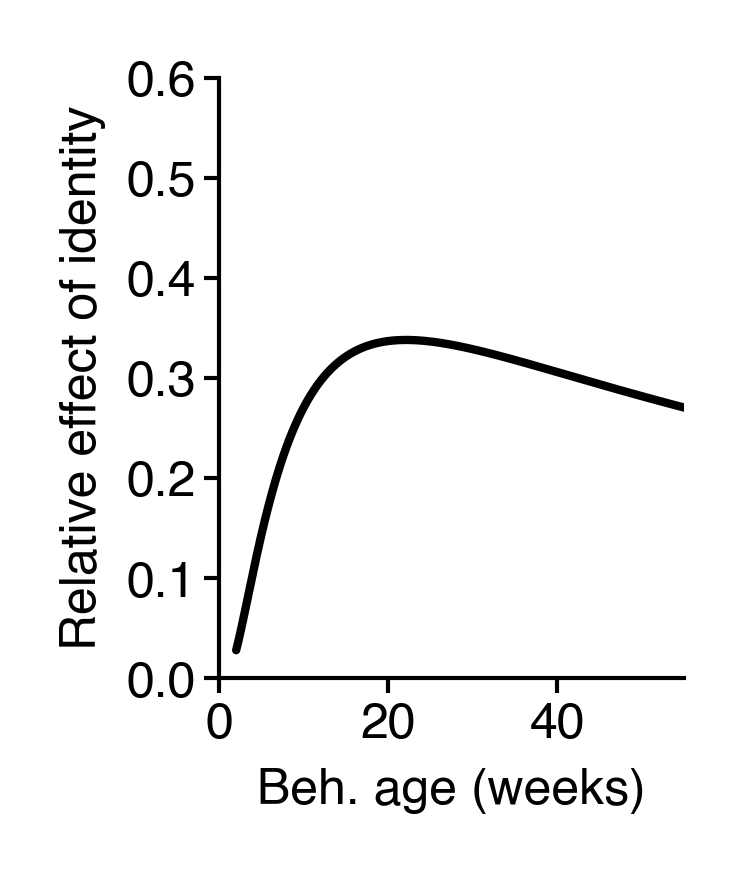

In [135]:
x = mdl['params']['development_weights']
dev = (x @ mdl['init_components'].bases['development']).squeeze()

comps = mdl['init_components']

dev = np.exp(dev)

fig = figure(1, 1.3)
ax = fig.gca()
ax.plot(comps.age_unnormalizer(comps.age_samples), dev, color='k')
plt.xlim(0, 55)
plt.ylim(0, 0.6)
plt.xlabel("Beh. age (weeks)")
plt.ylabel("Relative effect of identity")
sns.despine()
saver(fig, "long-v2-effect-of-id-strong-prior");

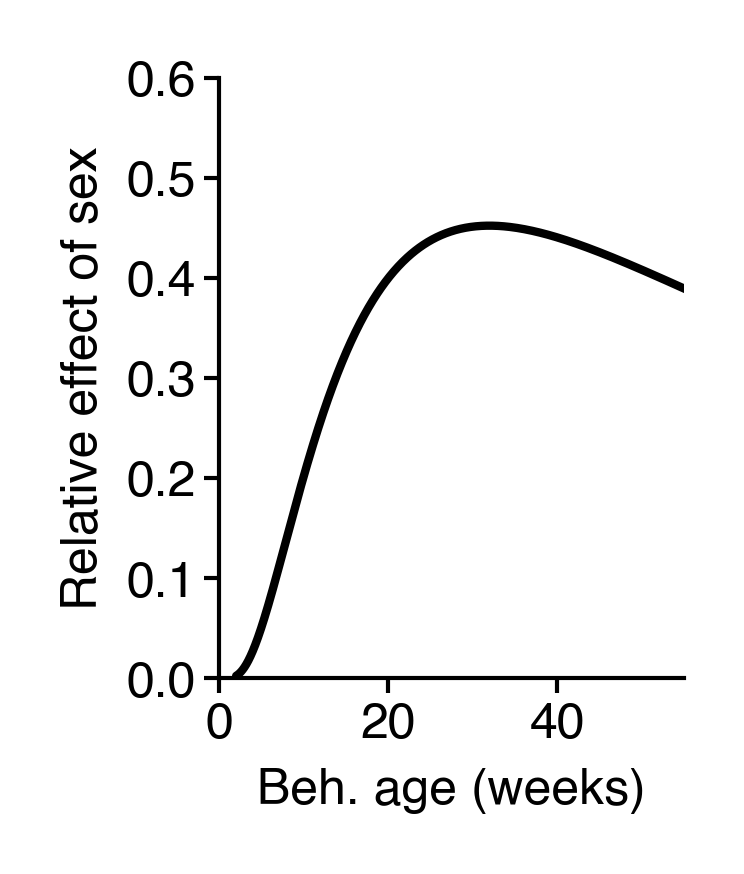

In [136]:
x = mdl['params']['sex_weights']
dev = (x @ mdl['init_components'].bases['sex']).squeeze()

comps = mdl['init_components']

dev = np.exp(dev)

fig = figure(1, 1.3)
ax = fig.gca()
ax.plot(comps.age_unnormalizer(comps.age_samples), dev, color='k')
plt.xlim(0, 55)
plt.ylim(0, 0.6)
plt.xlabel("Beh. age (weeks)")
plt.ylabel("Relative effect of sex")
sns.despine()
saver(fig, "long-v2-effect-of-sex-strong-prior");

## Show shuffles

In [137]:
from scipy.stats import ttest_ind

In [138]:
n_repeats = 30

In [139]:
hyp_copy = deepcopy(hypparams)
mdl4 = masked_xval(features, hyp_copy, 6, n_repeats=n_repeats)
r2_4 = list(pluck('heldout_r2_total_v3', mdl4.values()))
ll_4 = list(pluck('heldout_ll', mdl4.values()))
print(np.mean(r2_4))
del mdl4

  0%|          | 0/30 [00:00<?, ?it/s]

0.6319764699076775


In [140]:
hyp_copy = deepcopy(hypparams)
mdl5 = masked_xval(features, hyp_copy, 5, n_repeats=n_repeats)
r2_5 = list(pluck('heldout_r2_total_v3', mdl5.values()))
ll_5 = list(pluck('heldout_ll', mdl5.values()))
print(np.mean(r2_5))
del mdl5

  0%|          | 0/30 [00:00<?, ?it/s]

0.6291663866948748


In [141]:
ttest_ind(r2_5, r2_4, alternative='less')

TtestResult(statistic=-2.743238722301772, pvalue=0.004040235257802611, df=58.0)

In [142]:
hyp_copy = deepcopy(hypparams)
mdl0 = masked_xval(features, hyp_copy, 0, n_repeats=n_repeats)
r2_0 = list(pluck('heldout_r2_total_v3', mdl0.values()))
ll_0 = list(pluck('heldout_ll', mdl0.values()))
print(np.mean(r2_0))
del mdl0

  0%|          | 0/30 [00:00<?, ?it/s]

0.3798707086239323


In [143]:
hyp_copy = deepcopy(hypparams)
mdl1 = masked_xval(features, hyp_copy, 1, n_repeats=n_repeats)
r2_1 = list(pluck('heldout_r2_total_v3', mdl1.values()))
ll_1 = list(pluck('heldout_ll', mdl1.values()))
print(np.mean(r2_1))
del mdl1

  0%|          | 0/30 [00:00<?, ?it/s]

0.39734104875891163


In [144]:
hyp_copy = deepcopy(hypparams)
mdl2 = masked_xval(features, hyp_copy, 2, n_repeats=n_repeats, )
r2_2 = list(pluck('heldout_r2_total_v3', mdl2.values()))
ll_2 = list(pluck('heldout_ll', mdl2.values()))
print(np.mean(r2_2))
del mdl2

  0%|          | 0/30 [00:00<?, ?it/s]

0.4237686705913822


In [145]:
features_copy = deepcopy(features)
hyp_copy = deepcopy(hypparams)
features_copy['mice'], features_copy['sex'] = features_copy['sex'], features_copy['mice']
hyp_copy['n_animals'] = len(sex_id)
mdl3 = masked_xval(features_copy, hyp_copy, 5, n_repeats=n_repeats)
r2_3 = list(pluck('heldout_r2_total_v3', mdl3.values()))
ll_3 = list(pluck('heldout_ll', mdl3.values()))
print(np.mean(r2_3))
del mdl3

  0%|          | 0/30 [00:00<?, ?it/s]

0.44810980131784056


In [148]:
# move features back
hyp_copy = deepcopy(hypparams)
hyp_copy['age_sd'] = 1e-3

mdl0_1 = masked_xval(features, hyp_copy, 1, n_repeats=n_repeats)
r2_0_1 = list(pluck('heldout_r2_total_v3', mdl0_1.values()))
ll_0_1 = list(pluck('heldout_ll', mdl0_1.values()))
print(np.mean(r2_0_1))
del mdl0_1

  0%|          | 0/30 [00:00<?, ?it/s]

0.20231357020669527


In [149]:
# shuffle syllables
np.random.seed(0)
shuff_features = deepcopy(features)
hyp_copy = deepcopy(hypparams)
hyp_copy["age_sd"] = age_sd
hyp_copy['n_opt_iter'] = 650

r2_shuff = []
ll_shuff = []
for i in tqdm(range(n_repeats)):
    perm = np.array(
        [np.random.permutation(58) for _ in range(len(syllable_counts_jax))]
    )
    shuff = syllable_counts_jax[np.arange(len(syllable_counts_jax))[:, None], perm]
    shuff_features["counts"] = shuff
    tmp = masked_xval(
        shuff_features,
        hyp_copy,
        model_version=6,
        n_repeats=1,
        seed=i,
        disable_tqdm=True,
        return_loss_on_error=True,
    )
    if len(tmp[0]) > 1:
        r2_shuff.append(tmp[0]["heldout_r2_total_v3"])
        ll_shuff.append(tmp[0]['heldout_ll'])
    else:
        print(
            "Non-NaN iterations:",
            hyp_copy["n_opt_iter"] - np.isnan(tmp[0]["loss"]).sum(),
        )
print(np.mean(r2_shuff))

  0%|          | 0/30 [00:00<?, ?it/s]

-0.05822743002715798


In [150]:
# shuffle identity
np.random.seed(0)

hyp_copy = deepcopy(hypparams)
shuff_features = deepcopy(features)

shuff_r2s = []
shuff_lls = []
for i in tqdm(range(n_repeats)):
    shuff_features["mice"] = np.random.permutation(features["mice"].T).T
    shuff_results = masked_xval(
        shuff_features,
        hyp_copy,
        model_version=6,
        n_repeats=1,
        disable_tqdm=True,
        seed=i,
    )
    shuff_r2s.append(shuff_results[0]["heldout_r2_total_v3"])
    shuff_lls.append(shuff_results[0]['heldout_ll'])
print(np.mean(shuff_r2s))

  0%|          | 0/30 [00:00<?, ?it/s]

0.4204057581964354


In [151]:
# shuffle sexes
np.random.seed(0)

hyp_copy = deepcopy(hypparams)
shuff_features = deepcopy(features)

sex_shuff_r2s = []
sex_shuff_lls = []
for i in tqdm(range(n_repeats)):
    shuff_features["sex"] = np.random.permutation(features["sex"].T).T
    shuff_results = masked_xval(
        shuff_features,
        hyp_copy,
        model_version=6,
        n_repeats=1,
        disable_tqdm=True,
        seed=i,
    )
    sex_shuff_r2s.append(shuff_results[0]["heldout_r2_total_v3"])
    sex_shuff_lls.append(shuff_results[0]['heldout_ll'])
print(np.mean(sex_shuff_r2s))

  0%|          | 0/30 [00:00<?, ?it/s]

0.5949588569663679


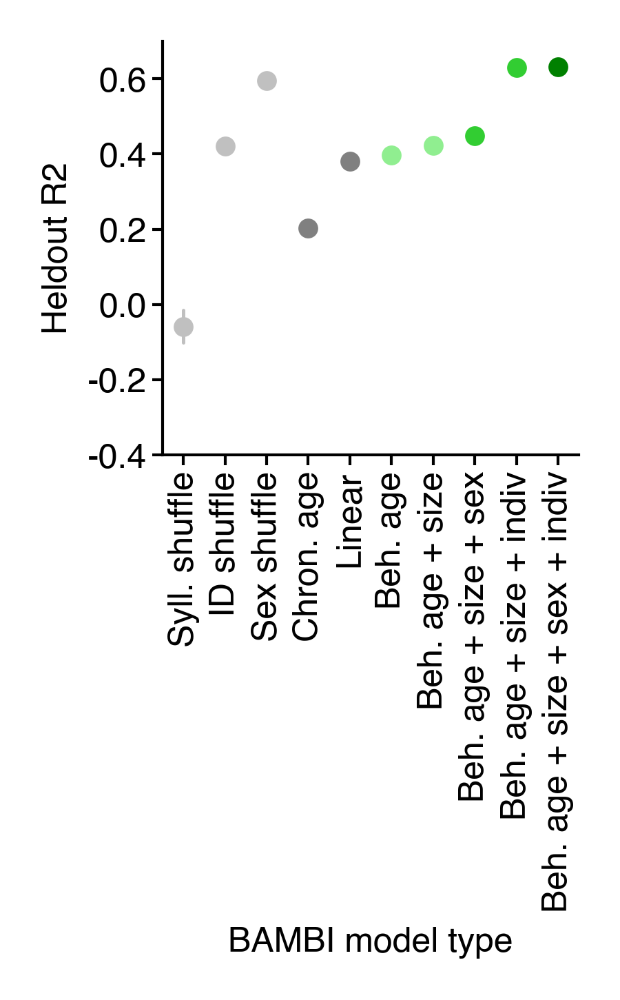

In [152]:
plt_data = {
    "Syll. shuffle": r2_shuff,
    "ID shuffle": shuff_r2s,
    "Sex shuffle": sex_shuff_r2s,
    "Chron. age": r2_0_1,
    "Linear": r2_0,
    "Beh. age": r2_1,
    "Beh. age + size": r2_2,
    "Beh. age + size + sex": r2_3,
    "Beh. age + size + indiv": r2_5,
    "Beh. age + size + sex + indiv": r2_4,
}

fig = figure(1.3, 1.3)
ax = sns.pointplot(
    data=plt_data,
    palette=[
        "silver",
        "silver",
        "silver",
        "gray",
        "gray",
        "lightgreen",
        "lightgreen",
        "limegreen",
        "limegreen",
        "green",
    ],
    linewidth=0.6,
    errorbar=("sd", 2),
    ms=3,
)
ax.set(
    xlabel="BAMBI model type",
    ylabel="Heldout R2",
    ylim=(-0.4, 0.7),
)
plt.xticks(rotation=90)
sns.despine()
saver(fig, "long-v2-males-females-heldout-r2-model-comparison");

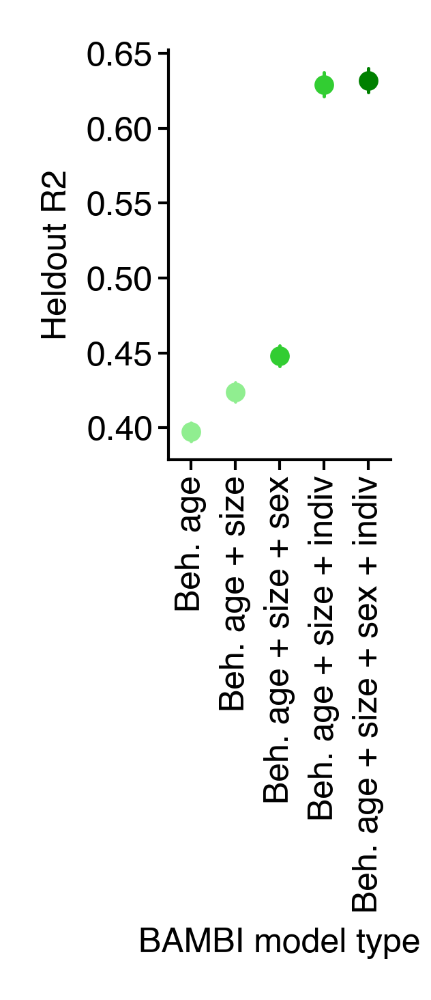

In [153]:
plt_data = {
    "Beh. age": r2_1,
    "Beh. age + size": r2_2,
    "Beh. age + size + sex": r2_3,
    "Beh. age + size + indiv": r2_5,
    "Beh. age + size + sex + indiv": r2_4,
}

fig = figure(0.7, 1.3)
ax = sns.pointplot(
    data=plt_data,
    palette=["lightgreen", "lightgreen", "limegreen", "limegreen", "green"],
    linewidth=0.6, errorbar=('sd', 2), ms=3
)
ax.set(
    xlabel="BAMBI model type",
    ylabel="Heldout R2",
)
plt.xticks(rotation=90)
sns.despine()
saver(fig, "long-v2-males-females-heldout-r2-model-comparison-just-bambi");

In [154]:
def create_broken_axis_plot(y_values, colors, order, figsize=(2, 2)):
    """
    Create a broken axis plot with 3 subplots. Made with Claude 3.5's help.

    Parameters:
    x_values (list): List of 3 numpy arrays, each containing x values for a subplot.
    y_values (list): List of 3 numpy arrays, each containing y values for a subplot.
    y_limits (list): List of 3 tuples, each containing (ymin, ymax) for a subplot.
    figsize (tuple): Figure size (width, height) in inches.
    title (str): Title of the plot.
    """

    # Create the figure and axes
    fig, (ax1, ax2, ax3) = plt.subplots(3, 1, sharex=True, figsize=figsize)
    fig.subplots_adjust(hspace=0.09)  # Adjust space between axes

    # Plot the data
    axes = [ax1, ax2, ax3]
    for ax, y, palette in zip(axes, y_values, colors):
        sns.pointplot(
            data=y,
            palette=palette,
            order=list(all_ll_plot_data),
            linewidth=0.6, errorbar=('sd', 2), ms=3,
            ax=ax
        )
        sns.despine(ax=ax, top=True)
        # ax.set_ylim(ymin, ymax)

    # Hide the spines between axes
    for ax in axes[:-1]:
        ax.spines['bottom'].set_visible(False)
        ax.tick_params(labeltop=False)
    axes[-1].xaxis.tick_bottom()

    # Add diagonal lines to indicate the breaks
    d = .015  # Size of diagonal lines
    for ax in axes:
        kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
        ax.plot((-d, +d), (-d, +d), **kwargs)
        # ax.plot((1 - d, 1 + d), (-d, +d), **kwargs)
        ax.plot((-d, +d), (1 - d, 1 + d), **kwargs)
        # ax.plot((1 - d, 1 + d), (1 - d, 1 + d), **kwargs)

    # Add labels and title
    for ax in axes:
        ax.set_ylabel('Heldout LL')
    axes[-1].tick_params(axis='x', rotation=90)
    return fig

In [155]:
all_ll_plot_data = {
    "Syll. shuffle": ll_shuff,
    "ID shuffle": shuff_lls,
    "Sex shuffle": sex_shuff_lls,
    "Chron. age": ll_0_1,
    "Linear": ll_0,
    "Beh. age": ll_1,
    "Beh. age + size": ll_2,
    "Beh. age + size + sex": ll_3,
    "Beh. age + size + indiv": ll_5,
    "Beh. age + size + sex + indiv": ll_4,
}

palette = [
    "silver",
    "silver",
    "silver",
    "gray",
    "gray",
    "lightgreen",
    "lightgreen",
    "limegreen",
    "limegreen",
    "green",
]

/tmp/ipykernel_32343/2642038311.py:2: UserWarning: 
The palette list has fewer values (2) than needed (10) and will cycle, which may produce an uninterpretable plot.
  ax = sns.pointplot(


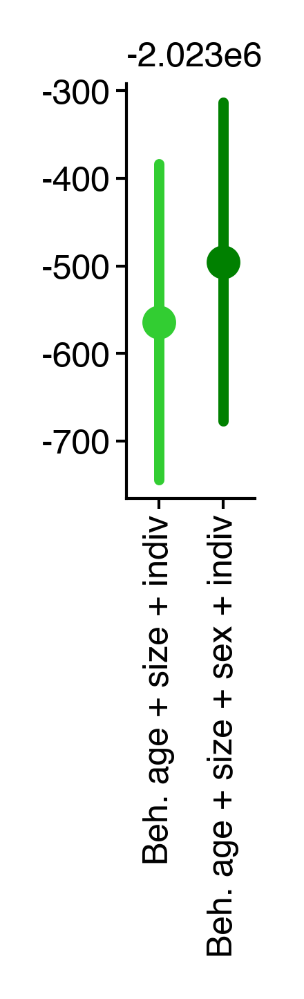

In [162]:
fig = figure(0.4, 1.3)
ax = sns.pointplot(
    data=all_ll_plot_data,
    order=["Beh. age + size + indiv", "Beh. age + size + sex + indiv"],
    palette=["limegreen", "green"],
    errorbar=("sd", 2),
)
ax.tick_params(axis='x', rotation=90)
sns.despine()
saver(fig, "just-last-two-heldout-ll");

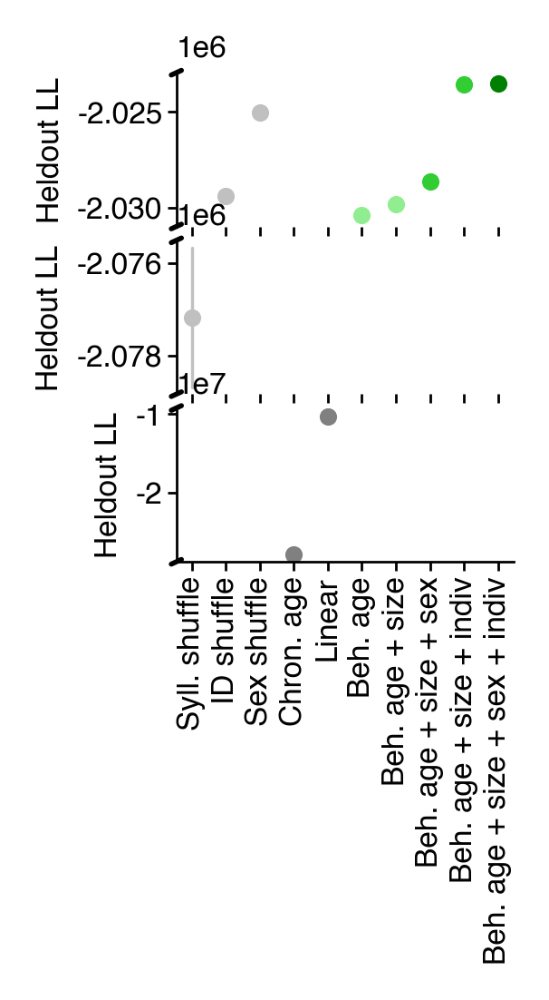

In [161]:
data_list = [
    {
        "ID shuffle": shuff_lls,
        "Sex shuffle": sex_shuff_lls,
        "Beh. age": ll_1,
        "Beh. age + size": ll_2,
        "Beh. age + size + sex": ll_3,
        "Beh. age + size + indiv": ll_5,
        "Beh. age + size + sex + indiv": ll_4,
    },
    {
        "Syll. shuffle": ll_shuff,
    },
    {
        "Chron. age": ll_0_1,
        "Linear": ll_0,
    },
]
fig = create_broken_axis_plot(
    data_list,
    colors=[
        ["silver", "silver", "lightgreen", "lightgreen", "limegreen", "limegreen", "green"],
        ["silver"],
        ["gray", "gray"],
    ],
    order=list(all_ll_plot_data),
    figsize=(1.2, 1.75)
)
saver(fig, "heldout-ll-broken-axis-plot");

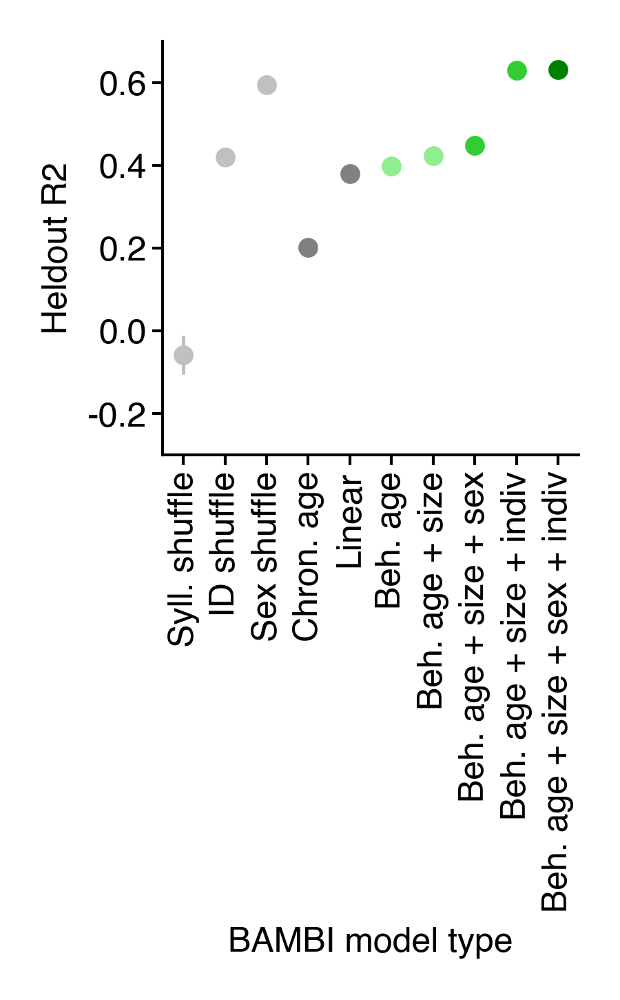

In [158]:
plt_data = {
    "Syll. shuffle": r2_shuff,
    "ID shuffle": shuff_r2s,
    "Sex shuffle": sex_shuff_r2s,
    "Chron. age": r2_0_1,
    "Linear": r2_0,
    "Beh. age": r2_1,
    "Beh. age + size": r2_2,
    "Beh. age + size + sex": r2_3,
    "Beh. age + size + indiv": r2_5,
    "Beh. age + size + sex + indiv": r2_4,
}

fig = figure(1.3, 1.3)
ax = sns.pointplot(
    data=plt_data,
    palette=[
        "silver",
        "silver",
        "silver",
        "gray",
        "gray",
        "lightgreen",
        "lightgreen",
        "limegreen",
        "limegreen",
        "green",
    ],
    linewidth=0.6,
    errorbar=("sd", 2),
    ms=3,
)
ax.set(
    xlabel="BAMBI model type",
    ylabel="Heldout R2",
    ylim=(-0.3, 0.7),
)
plt.xticks(rotation=90)
sns.despine()
saver(fig, "long-v2-males-females-heldout-r2-model-comparison");